# Rick and Morty Analysis

In [1]:
import pandas as pd
import numpy as np
import re
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from wordcloud import WordCloud
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [2]:
# Load the dataset
file_path = '/content/RickAndMortyScripts.csv'
RickAndMorty_data = pd.read_csv(file_path)
bing = pd.read_csv('/content/Bing.csv')
nrc = pd.read_csv('/content/NRC.csv')
afinn = pd.read_csv('/content/Afinn.csv', encoding='ISO-8859-1')

In [3]:
RickAndMorty_data = RickAndMorty_data.rename(columns={"index": "Index",
                                  "season no.": "Season.No",
                                  "episode no.": "Episode.No",
                                  "episode name": "Episode.Name",
                                  "name": "Character.Name",
                                  "line": "Dialog"})

In [4]:
RickAndMorty_data.head(10)

,Index,Season.No,Episode.No,Episode.Name,Character.Name,Dialog
0,0,1,1,Pilot,Rick,Morty! You gotta come on. Jus'... you gotta co...
1,1,1,1,Pilot,Morty,"What, Rick? What’s going on?"
2,2,1,1,Pilot,Rick,"I got a surprise for you, Morty."
3,3,1,1,Pilot,Morty,It's the middle of the night. What are you tal...
4,4,1,1,Pilot,Rick,"Come on, I got a surprise for you. Come on, h..."
5,5,1,1,Pilot,Morty,Ow! Ow! You're tugging me too hard!
6,6,1,1,Pilot,Rick,"We gotta go, gotta get outta here, come on. Go..."
7,7,1,1,Pilot,Rick,"What do you think of this... flying vehicle, M..."
8,8,1,1,Pilot,Morty,"Yeah, Rick... I-it's great. Is this the surprise?"
9,9,1,1,Pilot,Rick,Morty. I had to... I had to do it. I had— I ha...


In [5]:
# Summary
RickAndMorty_data_summary = RickAndMorty_data.describe()
print(RickAndMorty_data_summary)


             Index    Season.No   Episode.No
count  1905.000000  1905.000000  1905.000000
mean   1190.003675     2.155381     3.208399
std     721.719735     0.832004     2.247812
min       0.000000     1.000000     1.000000
25%     548.000000     1.000000     1.000000
50%    1164.000000     2.000000     3.000000
75%    1844.000000     3.000000     5.000000
max    2487.000000     3.000000    10.000000


In [6]:
def clean_corpus(text):
    # Convert to lowercase
    text_tmp = text.lower()

    # Remove punctuation using regex
    text_tmp = re.sub(r'[^\w\s]', '', text_tmp)

    # Remove numbers
    text_tmp = re.sub(r'\d+', '', text_tmp)

    # Tokenize text
    tokens = word_tokenize(text_tmp)

    # Define stopwords list, adding custom stopwords
    custom_stopwords = ["thats", "weve", "hes", "theres", "ive", "im",
                        "will", "can", "cant", "dont", "youve", "us",
                        "youre", "youll", "theyre", "whats", "didnt"]
    stop_words = set(stopwords.words('english')).union(custom_stopwords)

    # Remove stopwords
    tokens = [word for word in tokens if word not in stop_words]

    # Rejoin tokens into a string
    text_cleaned = ' '.join(tokens)

    return text_cleaned

In [7]:
def frequent_terms(text):
    # Define custom stopwords
    custom_stopwords = ["thats", "weve", "hes", "theres", "ive", "im",
                        "will", "can", "cant", "dont", "youve", "us",
                        "youre", "youll", "theyre", "whats", "didnt"]

    # Combine NLTK stopwords with custom stopwords
    stop_words = set(stopwords.words('english')).union(custom_stopwords)

    # Clean the corpus
    Dialogs = [clean_corpus(text) for text in Dialog]

    # Create the term-document matrix
    vectorizer = CountVectorizer(stop_words=stop_words)
    X = vectorizer.fit_transform(Dialogs)

    # Convert to a DataFrame
    df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

    # Sum the frequency of each word
    word_freqs = df.sum(axis=0).sort_values(ascending=False)

    # Convert to DataFrame
    dm = pd.DataFrame(word_freqs).reset_index()
    dm.columns = ['word', 'freq']

    # Filter out sparse terms if needed, this step can be customized as per requirements
    # For example, to remove terms that appear only once across all documents:
    # dm = dm[dm['freq'] > 1]

    return dm


In [8]:
def tokenizer_2(text):
    return [text[i:i+2] for i in range(len(text)-1)]

def frequent_bigrams(text):
    # Create the CountVectorizer object with custom tokenizer
    vectorizer = CountVectorizer(tokenizer=tokenizer_2)

    # Fit the vectorizer to the text data and transform the text into a term-document matrix
    X = vectorizer.fit_transform(text)

    # Get feature names (bigrams)
    feature_names = vectorizer.get_feature_names_out()

    # Calculate bigram frequencies
    bigram_freqs = X.sum(axis=0).A1

    # Create a DataFrame with bigrams and their frequencies
    bigram_freq_df = pd.DataFrame({'bigram': feature_names, 'freq': bigram_freqs})

    # Sort the DataFrame by bigram frequency in descending order
    bigram_freq_df = bigram_freq_df.sort_values(by='freq', ascending=False)

    return bigram_freq_df

In [9]:
def tokenizer_3(text):
    return [text[i:i+3] for i in range(len(text)-2)]

def frequent_trigrams(text):
    # Create the CountVectorizer object with custom tokenizer
    vectorizer = CountVectorizer(tokenizer=tokenizer_3)

    # Fit the vectorizer to the text data and transform the text into a term-document matrix
    X = vectorizer.fit_transform(text)

    # Get feature names (trigrams)
    feature_names = vectorizer.get_feature_names_out()

    # Calculate trigram frequencies
    trigram_freqs = X.sum(axis=0).A1

    # Create a DataFrame with trigrams and their frequencies
    trigram_freq_df = pd.DataFrame({'trigram': feature_names, 'freq': trigram_freqs})

    # Sort the DataFrame by trigram frequency in descending order
    trigram_freq_df = trigram_freq_df.sort_values(by='freq', ascending=False)

    return trigram_freq_df

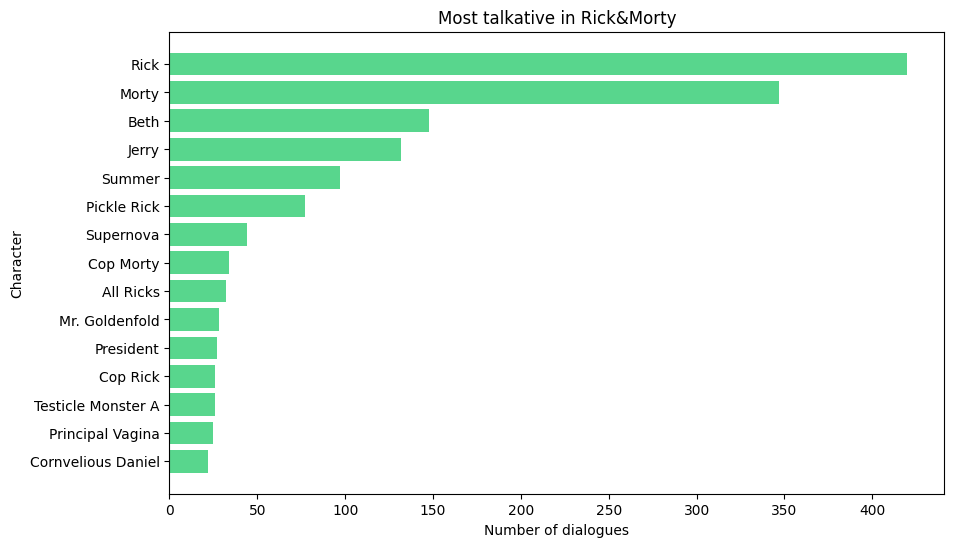

In [10]:
# Group by Character.Name and count dialogues, then select top 15
top_characters = RickAndMorty_data.groupby('Character.Name').size().nlargest(15).reset_index(name='n')

# Plot
plt.figure(figsize=(10, 6))
plt.barh(top_characters['Character.Name'], top_characters['n'], color='#58D68D')
plt.xlabel('Number of dialogues')
plt.ylabel('Character')
plt.title('Most talkative in Rick&Morty')
plt.gca().invert_yaxis()  # Invert y-axis to have the most talkative character at the top
plt.show()

4. BING Lexicon 🙂🙁
Bing Lexicon cathegorizes the words into positives and negatives.

To be able to do so in our data, first we make a dataframe that splits all the words in 1 dialogue onto rows. Afterwards, we can join our data with the lexicon, leaving us with a beautiful classification of our words.

Note: tokens are both words and punctuation signs.

In [11]:
#     'Character.Name': ['Rick', 'Morty', 'Rick', 'Beth'],
#     'Dialog': ["Let's get schwifty!", "Oh man, Rick!", "What's this thing?", "Are you drunk again?"]
# })

# Ensure 'Dialog' is in string format
RickAndMorty_data['Dialog'] = RickAndMorty_data['Dialog'].astype(str)

# Tokenize the 'Dialog' column
RickAndMorty_data['tokens'] = RickAndMorty_data.apply(lambda row: word_tokenize(row['Dialog']), axis=1)

# Flatten the list of tokens with corresponding character names
rows = []
for _, row in RickAndMorty_data.iterrows():
    for word in row['tokens']:
        rows.append({'Character.Name': row['Character.Name'], 'word': word})

# Create a DataFrame from the list of dictionaries
tokens_df = pd.DataFrame(rows)

# Display the first 5 rows
print(tokens_df.head(5))

  Character.Name   word
0           Rick  Morty
1           Rick      !
2           Rick    You
3           Rick    got
4           Rick     ta


4.1 Word Cloud ☁☁
An overall Glimpse on the positive and negative words in the data.

                                              Dialog Sentiment
0  Morty! You gotta come on. Jus'... you gotta co...   neutral
1                       What, Rick? What’s going on?   neutral
2                   I got a surprise for you, Morty.   neutral
3  It's the middle of the night. What are you tal...   neutral
4  Come on, I got a surprise for you.  Come on, h...   neutral
Word Cloud for Positive Sentiment:


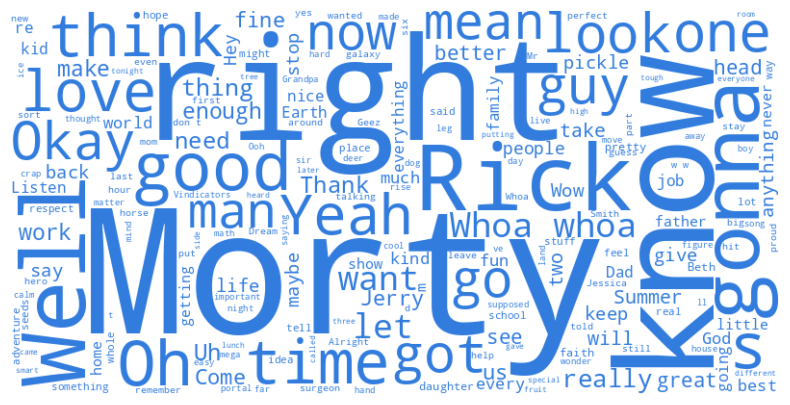

Word Cloud for Negative Sentiment:


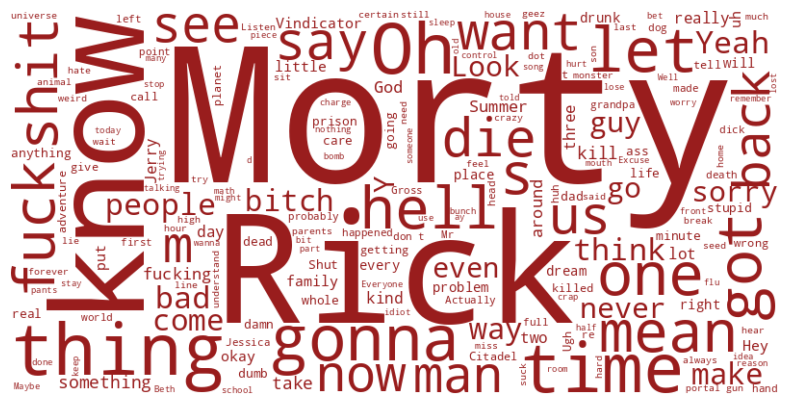

In [12]:
def categorize_line(Dialog, sentiment_dict):
    # Tokenize and convert to lowercase
    tokens = word_tokenize(Dialog.lower())
    # Categorize words by sentiment using the sentiment dictionary
    line_sentiment = {'positive': 0, 'negative': 0}
    for word in tokens:
        if word in sentiment_dict:
            line_sentiment[sentiment_dict[word]] += 1
    # Determine the category of the line by the predominant sentiment
    if line_sentiment['positive'] > line_sentiment['negative']:
        return 'positive'
    elif line_sentiment['positive'] < line_sentiment['negative']:
        return 'negative'
    else:
        return 'neutral'

# Create a dictionary of words and their sentiment
sentiment_dict = pd.Series(bing.sentiment.values, index=bing.word).to_dict()

# Categorize each line
RickAndMorty_data['Sentiment'] = RickAndMorty_data['Dialog'].apply(lambda x: categorize_line(x, sentiment_dict))

# Preview the categorized data
print(RickAndMorty_data[['Dialog', 'Sentiment']].head())

def generate_wordcloud(text, color):
    wordcloud = WordCloud(width=800, height=400, background_color='white', color_func=lambda *args, **kwargs: color).generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# Aggregate words for each sentiment
positive_words = ' '.join(RickAndMorty_data[RickAndMorty_data['Sentiment'] == 'positive']['Dialog'].tolist())
negative_words = ' '.join(RickAndMorty_data[RickAndMorty_data['Sentiment'] == 'negative']['Dialog'].tolist())

# Generate and show word clouds for each sentiment
print("Word Cloud for Positive Sentiment:")
generate_wordcloud(positive_words, color='#327CDE')

print("Word Cloud for Negative Sentiment:")
generate_wordcloud(negative_words, color='#991D1D')

NRC Lexicon🙂🙁😠🤔🤢😥😊😭😲😎
The nrc lexicon cathegorizes the words in 10 moods:

positive
negative
anger
anticipation
disgust
fear
joy
sadness
surprise
trust
Let's look at how these sentiments rank in our data:

In [13]:
# Print the first few rows to see its structure
print(nrc.head())

# Print the column names to understand what columns are available
print("Column Names:", nrc.columns.tolist())

        word sentiment
0     abacus     trust
1    abandon      fear
2    abandon  negative
3    abandon   sadness
4  abandoned     anger
Column Names: ['word', 'sentiment']


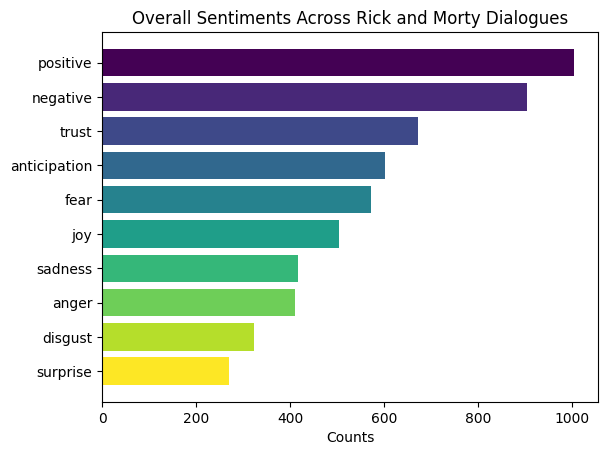

In [14]:
# Create a sentiment dictionary where each word can have multiple sentiments
sentiment_dict = {}
for index, row in nrc.iterrows():
    if row['word'] not in sentiment_dict:
        sentiment_dict[row['word']] = []
    sentiment_dict[row['word']].append(row['sentiment'])

# Tokenize the dialog and determine the sentiment counts
def determine_sentiments(Dialog):
    tokens = word_tokenize(Dialog.lower())
    sentiments = [sentiment_dict.get(token, []) for token in tokens]
    # Flatten list of lists and count each sentiment
    sentiment_counts = Counter([sent for sublist in sentiments for sent in sublist])
    return sentiment_counts

# Apply the function to each 'Dialog' and sum up all sentiment counts
total_sentiments = Counter()
RickAndMorty_data['Sentiment_Counts'] = RickAndMorty_data['Dialog'].apply(determine_sentiments)
for counts in RickAndMorty_data['Sentiment_Counts']:
    total_sentiments.update(counts)

# Prepare data for plotting by sorting
sentiments_sorted = {k: v for k, v in sorted(total_sentiments.items(), key=lambda item: item[1], reverse=True)}
sentiments = list(sentiments_sorted.keys())
counts = [sentiments_sorted[sent] for sent in sentiments]

# Define a color for each sentiment
colors = plt.cm.viridis(np.linspace(0, 1, len(sentiments)))

# Plot the inverted bar graph with top sentiments at the top
fig, ax = plt.subplots()
ax.barh(sentiments, counts, color=colors)
ax.set_xlabel('Counts')
ax.set_title('Overall Sentiments Across Rick and Morty Dialogues')
ax.invert_yaxis()  # Inverts the y-axis so the bar with the highest count is on top
plt.show()


AFINN Lexicon 5️⃣🔁¶
Afinn Lexicon ranks every word from -5 to 5, where:

-5 being the most negative
+5 being the most positive

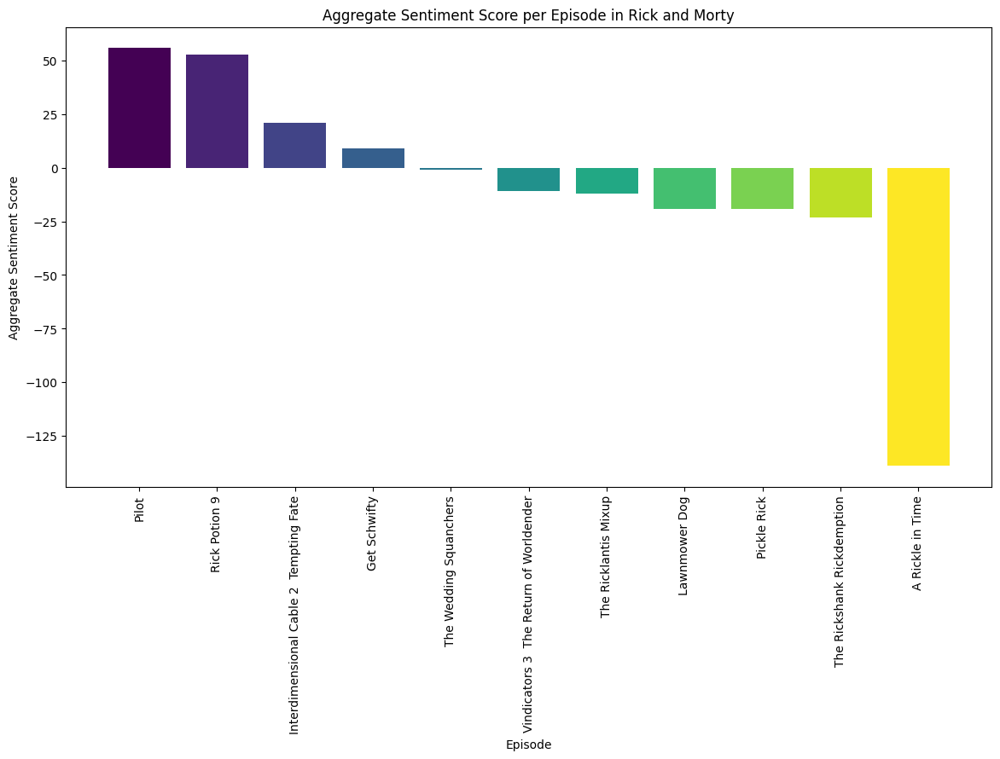

In [15]:
# Ensure the text is a string and tokenize it
RickAndMorty_data['tokens'] = RickAndMorty_data['Dialog'].apply(lambda x: word_tokenize(str(x).lower()))

# Expand the DataFrame so that each token gets its row, duplicating the other columns
all_words = RickAndMorty_data.explode('tokens')
all_words.rename(columns={'tokens': 'word'}, inplace=True)

# Merge with the AFINN data
merged_data = pd.merge(all_words, afinn, on='word', how='inner')

# Aggregate sentiment scores for each dialogue
sentiment_score = merged_data.groupby('Episode.Name').agg({'value': 'sum'}).reset_index()

# Sorting values for plotting
sentiment_score_sorted = sentiment_score.sort_values('value', ascending=False)

# Plotting the sentiment distribution
fig, ax = plt.subplots(figsize=(14, 7))
colors = plt.cm.viridis(np.linspace(0, 1, len(sentiment_score_sorted)))
ax.bar(sentiment_score_sorted['Episode.Name'], sentiment_score_sorted['value'], color=colors)
ax.set_xlabel('Episode')
ax.set_ylabel('Aggregate Sentiment Score')
ax.set_title('Aggregate Sentiment Score per Episode in Rick and Morty')
plt.xticks(rotation=90)
plt.show()


**Define functions used to clean text for LDA**

In [16]:
# Define a dictionary for common abbreviations and slang
abbreviations = {
     "n't": " not",
    "'re": " are",
    "'s": " is",
    "'d": " would",
    "'ll": " will",
    "'ve": " have",
    "'m": " am",
    "lol": "laughing out loud",
    "brb": "be right back",
    "btw": "by the way",
    "gonna": "going to",
    "wanna": "want to",
    "gotta": "got to",
    "y'know": "you know",
    "'cause": " because",
    "c'mon" : "come on"
}

In [17]:
# Include a function to expand abbreviations in the text
def expand_abbreviations(text):
    for abbr, expanded in abbreviations.items():
        text = re.sub(r'\b' + abbr + r'\b', expanded, text, flags=re.IGNORECASE)
    return text

In [18]:
# Function to remove filler words and non-verbal cues
def remove_filler_words(text):
    words = text.split()
    cleaned_words = [word for word in words if word not in filler_words]
    return ' '.join(cleaned_words)

def handle_non_verbal_cues(text):
    non_verbal_pattern = r"\[(.*?)\]"
    cleaned_text = re.sub(non_verbal_pattern, '', text)
    return cleaned_text.strip()

In [19]:
# Define a list of common filler words and short responses
filler_words = ['uh', 'um', 'ah', 'like', 'you know', 'so', 'actually', 'basically', 'seriously', 'literally']
short_responses = ['yes', 'no', 'okay', 'ok', 'sure', 'right', 'yep', 'nope', 'uh-huh', 'nah','oh','wow','yeah','ooh','uh','sh','uhm']

In [20]:
# Recognize the named entity. Because we focus on the emotion and triggering, the named entity should be ignored.
def remove_named_entities(text):
    doc = nlp(text)
    cleaned_text = ' '.join([token.text if token.ent_type_ == '' else '' for token in doc])
    return cleaned_text

In [21]:
punctuations = string.punctuation

In [22]:
# Function to perform lemmatization and stop words, punctuations removal
def clean_text(text):
    doc = nlp(text)
    cleaned_text = ' '.join([token.lemma_ for token in doc if token.text not in STOP_WORDS and token.text not in punctuations and '...' not in token.text and '-' not in token.text])
    return cleaned_text

In [23]:
# Function to identify short responses
def is_short_response(text, threshold=3):
    # Check if text is a string and split it, otherwise handle non-string input
    if isinstance(text, str):
        return len(text.split()) <= threshold
    else:
        # Handle non-string data by returning False or transforming it into a string
        return len(str(text).split()) <= threshold

# Function to remove short responses from sentence
  # Define a regular expression pattern to match whole words for removing verbals
pattern = r'\b(?:{})\b'.format('|'.join(map(re.escape, short_responses)))

  # Function to remove short responses from the text
def remove_words(text):
    return re.sub(pattern, '', text)

Now we move on to the categorization of themes based on identified topics


In [24]:
# Apply the functions to clean text
RickAndMorty_data['Cleaned_Text'] = RickAndMorty_data['Dialog'].apply(lambda x: handle_non_verbal_cues(remove_filler_words(expand_abbreviations(x))))

In [25]:
# Load the English tokenizer, tagger, parser, NER, and word vectors
nlp = spacy.load("en_core_web_sm")

In [26]:
# Remove the named entities from df
RickAndMorty_data['Cleaned_Text'] = RickAndMorty_data['Cleaned_Text'].apply(remove_named_entities)

In [27]:
# Normalize Text (convert to lowercase)
RickAndMorty_data['Cleaned_Text'] = RickAndMorty_data['Cleaned_Text'].str.lower()

In [28]:
# Apply the clean text function
RickAndMorty_data['Cleaned_Text'] = RickAndMorty_data['Cleaned_Text'].apply(lambda x: clean_text(x))

In [29]:
RickAndMorty_data['Is_Short_Response'] = RickAndMorty_data['Cleaned_Text'].apply(is_short_response)

In [30]:
# Filter the dataset to exclude short responses for thematic analysis
RickAndMorty_data = RickAndMorty_data[~RickAndMorty_data['Is_Short_Response']].copy()

In [31]:
RickAndMorty_data['Cleaned_Text'] = RickAndMorty_data['Cleaned_Text'].astype(str)

In [32]:
# Apply the function to remove short responses words
RickAndMorty_data['Cleaned_Text'] = RickAndMorty_data['Cleaned_Text'].apply(remove_words)

In [33]:
RickAndMorty_data

,Index,Season.No,Episode.No,Episode.Name,Character.Name,Dialog,tokens,Sentiment,Sentiment_Counts,Cleaned_Text,Is_Short_Response
0,0,1,1,Pilot,Rick,Morty! You gotta come on. Jus'... you gotta co...,"[morty, !, you, got, ta, come, on, ., jus, ', ...",neutral,{},morty get come get come,False
4,4,1,1,Pilot,Rick,"Come on, I got a surprise for you. Come on, h...","[come, on, ,, i, got, a, surprise, for, you, ....",neutral,"{'fear': 1, 'joy': 1, 'positive': 1, 'surprise...",come get surprise come hurry,False
5,5,1,1,Pilot,Morty,Ow! Ow! You're tugging me too hard!,"[ow, !, ow, !, you, 're, tugging, me, too, har...",negative,{},ow ow tug hard,False
6,6,1,1,Pilot,Rick,"We gotta go, gotta get outta here, come on. Go...","[we, got, ta, go, ,, got, ta, get, outta, here...",neutral,"{'fear': 1, 'joy': 1, 'positive': 1, 'surprise...",get get outta come get surprise morty,False
7,7,1,1,Pilot,Rick,"What do you think of this... flying vehicle, M...","[what, do, you, think, of, this, ..., flying, ...",neutral,"{'fear': 1, 'positive': 2, 'joy': 1, 'trust': 1}",think fly vehicle build outta stuff find garage,False
...,...,...,...,...,...,...,...,...,...,...,...
1895,2464,3,7,The Ricklantis Mixup,Teacher Rick,No graduation. No new Ricks. The school's curr...,"[no, graduation, ., no, new, ricks, ., the, sc...",neutral,"{'anticipation': 1, 'fear': 1, 'joy': 1, 'posi...",graduation new school curriculum change,False
1897,2466,3,7,The Ricklantis Mixup,Teacher Rick,"I don't know, and I don't have to know. I've b...","[i, do, n't, know, ,, and, i, do, n't, have, t...",positive,"{'anticipation': 2, 'joy': 2, 'positive': 2, '...",know know fire good luck turd,False
1898,2467,3,7,The Ricklantis Mixup,Lizard Morty,Holy crap... Slick's wish came true.,"[holy, crap, ..., slick, 's, wish, came, true, .]",positive,"{'positive': 1, 'disgust': 1, 'negative': 1}",holy crap slick wish come true,False
1902,2485,3,7,The Ricklantis Mixup,Morty,I'm really hoping it wasn't a one-off thing an...,"[i, 'm, really, hoping, it, was, n't, a, one-o...",negative,"{'anger': 1, 'fear': 1, 'negative': 1, 'sadnes...",hope thing way hey um curious happen crazy c...,False


In [34]:
# Check the dataset and we noticed that some of the 'morty' did not recognized as named entity so we remove it manually
RickAndMorty_data['Cleaned_Text'] = RickAndMorty_data['Cleaned_Text'].str.replace('morty', '')

In [35]:
# Exploratory Data Analysis (EDA)
# Frequency of words or phrases
word_frequency_RM = RickAndMorty_data['Cleaned_Text'].str.split(expand=True).stack().value_counts()
word_frequency_RM

know          150
go            140
get           110
want           84
time           82
             ... 
headlight       1
green           1
motorcycle      1
fruity          1
puss            1
Name: count, Length: 2202, dtype: int64

In [36]:
# Topic modelling

In [37]:
# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(RickAndMorty_data['Cleaned_Text'])

In [38]:
# Latent Dirichlet Allocation (LDA) for Topic Modeling
n_components = 10
lda = LatentDirichletAllocation(n_components=n_components, random_state=42)
lda.fit(tfidf_matrix)

LatentDirichletAllocation(random_state=42)

In [39]:
# Define function to print the topics and thier keyword
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += " ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()

In [40]:
# Print topics and the top 30 words
tf_feature_names = tfidf_vectorizer.get_feature_names_out()
n_top_words = 30
print_top_words(lda, tf_feature_names, n_top_words)

Topic #0: need horse love surgeon world think say wrong family father heart like ask sauce work friend job god shut important course thing daughter hand seed infinite mean feel faith galaxy
Topic #1: know want kid face human check good love come vindicator parent look reason crap child baby guy believe hit holy defense tell let buddy end ball mega wish class drop
Topic #2: mom guy come hell want penis ice know dad tell honey fuck think cream ve nuke dick fuckin let dream damn asshole schwifty remember shut stop thank hear head hospital
Topic #3: look maybe know mean time little like think pant hey guy place long math guess glad thing dot leave listen understand lose real bad pee prison idea world good school
Topic #4: let come snuffle want good later alright adventure free tell smart pretty job mean motherfucker ready plan huge dinner lick invite new dark open easy freeze dad day kid deal
Topic #5: whoa god help come kill mean wait bitch people head want guy know high worry family thin

In [41]:
# From the keywords, we assign those categories for topics
rm_categories = ['emotions, relationships, existential pondering', 'parenthood, love, responsibility', 'vulgar language, interpersonal interactions', 'uncertainty, speculation, curiosity', 'planning, readiness, anticipation', 'concerns, assistance, family dynamics', 'general comments, opinions, expressions', 'dreams, escapism, conflict', 'conversational expressions, observations', 'life events, reflections, apologies']

In [42]:
# Get topic distribution for each episode
topic_distributions = lda.transform(tfidf_matrix)

# Function to assign top three thematic categories based on topic distribution
def assign_top_three_categories(distribution, category):
    top_three = sorted(list(enumerate(distribution)), key=lambda x: x[1], reverse=True)[:3]
    return [category[idx] for idx, prob in top_three]

In [43]:
# Apply the function to each episode
RickAndMorty_data['Top_3_Categories'] = [
    assign_top_three_categories(dist,rm_categories) for dist in topic_distributions
]

# Create a clean output DataFrame
result_df = RickAndMorty_data[['Season.No', 'Episode.No', 'Top_3_Categories']].copy()
result_df['Top_3_Categories_Str'] = result_df['Top_3_Categories'].apply(lambda x: ', '.join(x))

# Group by Season and Episode
grouped_results = result_df.groupby(['Season.No', 'Episode.No']).agg({
    'Top_3_Categories_Str': 'first'  # Ensure only the first occurrence is taken if duplicates exist
}).reset_index()

# Print and view the DataFrame
print(grouped_results)

    Season.No  Episode.No                               Top_3_Categories_Str
0           1           1  planning, readiness, anticipation, concerns, a...
1           1           2  emotions, relationships, existential pondering...
2           1           6  vulgar language, interpersonal interactions, d...
3           2           1  uncertainty, speculation, curiosity, dreams, e...
4           2           5  vulgar language, interpersonal interactions, c...
5           2           8  life events, reflections, apologies, concerns,...
6           2          10  general comments, opinions, expressions, conve...
7           3           1  uncertainty, speculation, curiosity, dreams, e...
8           3           3  conversational expressions, observations, plan...
9           3           4  conversational expressions, observations, plan...
10          3           7  planning, readiness, anticipation, life events...


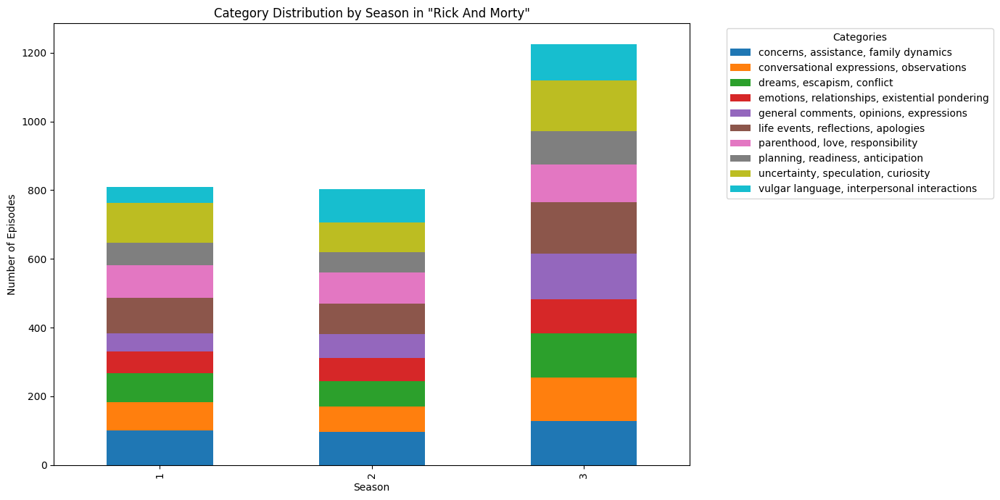

In [44]:
# Visualization of distribution by season
data_for_visualization = RickAndMorty_data.explode('Top_3_Categories')
season_theme_counts = data_for_visualization.groupby(['Season.No', 'Top_3_Categories']).size().unstack(fill_value=0)

# Plotting
season_theme_counts.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='tab10')
plt.title('Category Distribution by Season in "Rick And Morty"')
plt.xlabel('Season')
plt.ylabel('Number of Episodes')
plt.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

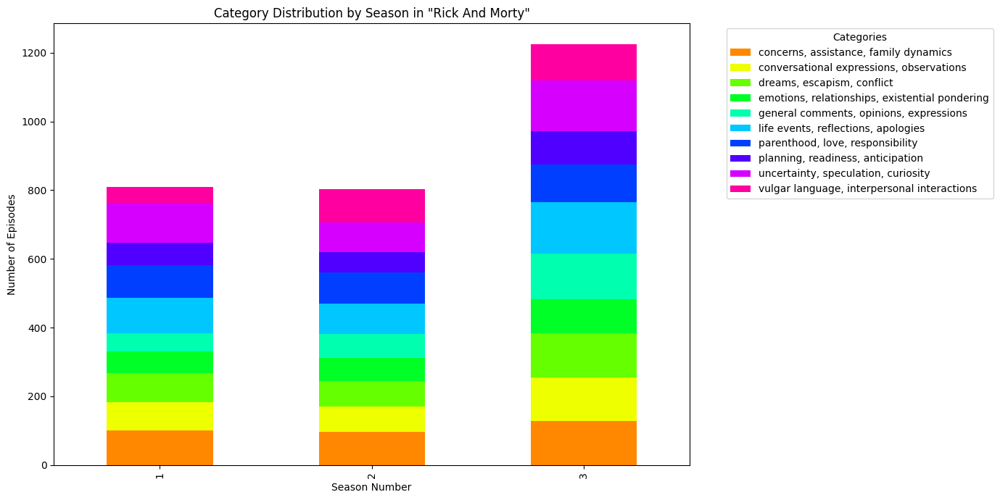

In [45]:
palette = sns.color_palette("hsv", len(season_theme_counts.columns))
season_theme_counts.plot(kind='bar', stacked=True, figsize=(14, 7), color=palette)
plt.title('Category Distribution by Season in "Rick And Morty"')
plt.xlabel('Season Number')
plt.ylabel('Number of Episodes')
plt.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [46]:
import plotly.express as px
df_long = season_theme_counts.reset_index().melt(id_vars=['Season.No'], var_name='Category', value_name='Episode.No')

# Create an interactive bar chart
fig = px.bar(df_long, x='Season.No', y='Episode.No', color='Category',
             title='Category Distribution by Season in "Rick And Morty"',
             labels={'Season.No': 'Season Number', 'Episode.No': 'Number of Episodes'},
             barmode='stack')

# Move the legend to the right side of the plot
fig.update_layout(legend_title_text='Categories', legend=dict(orientation="v", y=1, yanchor="top", x=1.25, xanchor="right"))

fig.show()

In [65]:
#Sentiment Analysis
from textblob import TextBlob

# Function to get sentiment
def get_sentiment(text):
    analysis = TextBlob(text)
    # Return a polarity score
    return analysis.sentiment.polarity

# Apply sentiment analysis to cleaned text
RickAndMorty_data['Sentiment'] = RickAndMorty_data['Dialog'].apply(get_sentiment)
RickAndMorty_data['Sentiment']

0       0.000000
4       0.000000
5      -0.364583
6       0.000000
7       0.000000
          ...   
1895   -0.068182
1897    0.700000
1898   -0.233333
1902   -0.116667
1903   -0.156250
Name: Sentiment, Length: 946, dtype: float64

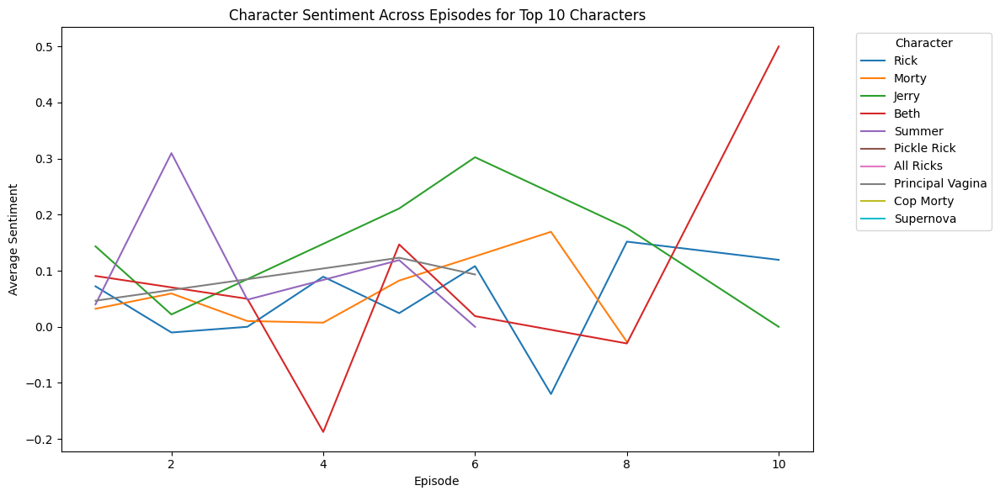

In [66]:
import matplotlib.pyplot as plt

# Assuming RickAndMorty_data is already loaded with columns 'Character.Name', 'Episode.No', and 'Sentiment'
# Identify the top 10 characters with the most lines
top_characters = RickAndMorty_data['Character.Name'].value_counts().head(10).index

# Filter the data to include only these top characters
filtered_data = RickAndMorty_data[RickAndMorty_data['Character.Name'].isin(top_characters)]

# Group the filtered data by character and episode, and calculate the mean sentiment
character_episode_sentiment = filtered_data.groupby(['Character.Name', 'Episode.No']).agg({'Sentiment': 'mean'}).reset_index()

# Plotting the sentiment for each top character across episodes
plt.figure(figsize=(12, 6))
for character in top_characters:
    subset = character_episode_sentiment[character_episode_sentiment['Character.Name'] == character]
    plt.plot(subset['Episode.No'], subset['Sentiment'], label=character)

plt.title('Character Sentiment Across Episodes for Top 10 Characters')
plt.xlabel('Episode')
plt.ylabel('Average Sentiment')
plt.legend(title='Character', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [67]:
#Categorize sentiment scores into 'Positive', 'Neutral', and 'Negative'
RickAndMorty_data['Sentiment_Category'] = pd.cut(RickAndMorty_data['Sentiment'], bins=[-1, -0.01, 0.01, 1], labels=['Negative', 'Neutral', 'Positive'])

<ipython-input-68-2d4bd0e494a0>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




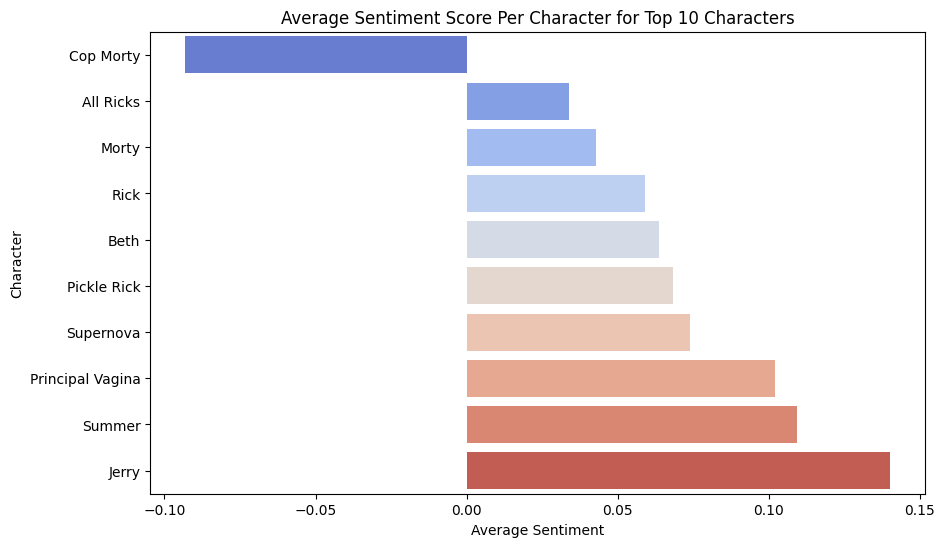

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd


# Find the top 10 characters with the most lines
top_10_names = RickAndMorty_data['Character.Name'].value_counts().nlargest(10).index

# Calculate the average sentiment for each character and filter for the top 10 characters
character_sentiment = RickAndMorty_data[RickAndMorty_data['Character.Name'].isin(top_10_names)].groupby('Character.Name')['Sentiment'].mean().sort_values()

# Plotting for the top 10 characters
plt.figure(figsize=(10, 6))
sns.barplot(x=character_sentiment.values, y=character_sentiment.index, palette='coolwarm')
plt.title('Average Sentiment Score Per Character for Top 10 Characters')
plt.xlabel('Average Sentiment')
plt.ylabel('Character')
plt.show()


In [69]:
sensitive_keywords = {
    'Death': ['death', 'die', 'dead', 'dying', 'fatal', 'killed', 'pass away', 'deceased', 'funeral', 'loss', 'mourning'],
    'Sex': ['sex', 'sexual', 'nude', 'nudity', 'naked', 'intercourse', 'sexual relations', 'lovemaking', 'make love', 'erotic', 'erotica', 'sex tape'],
    'Alcohol': ['drunk', 'alcohol', 'beer', 'wine', 'liquor', 'inebriated', 'tipsy', 'buzzed', 'booze', 'drinking', 'alcoholic'],
    'Drugs': ['drugs', 'weed', 'marijuana', 'stoned', 'high', 'dope', 'joint', 'blunt', 'cannabis', 'pot', 'hash', 'heroin', 'cocaine', 'meth', 'amphetamine', 'ecstasy', 'MDMA', 'LSD', 'acid', 'magic mushrooms', 'psychedelic'],
    'Relationship Issues': ['break up', 'divorce', 'cheating', 'affair', 'infidelity', 'separation', 'estrangement', 'unfaithful', 'heartbreak', 'broken heart', 'breakup'],
    'Mental Health': ['depression', 'anxiety', 'panic', 'nervous', 'mental health', 'mental illness', 'psychiatric', 'therapy', 'therapist', 'counseling', 'bipolar', 'schizophrenia', 'PTSD', 'post-traumatic stress disorder', 'trauma'],
    'Emotional Abuse': ['manipulate', 'verbal abuse', 'gaslighting', 'emotional abuse', 'mental abuse', 'manipulation', 'abusive', 'control', 'controlling', 'intimidation', 'harassment', 'victim', 'victimization'],
    'Sexual Content': ['sex tape', 'sexual relations', 'naked', 'strip', 'striptease', 'exotic dancer', 'porn', 'pornography', 'explicit', 'adult film'],
    'Homophobia': ['homophobia', 'gay', 'lesbian', 'bisexual', 'transgender', 'LGBT', 'LGBTQ', 'queer', 'gender identity', 'sexual orientation', 'discrimination'],
    'Pregnancy': ['pregnant', 'abortion', 'miscarriage', 'birth', 'childbirth', 'maternity', 'fetus', 'conceive', 'conception', 'gestation', 'termination'],
    'Body Image': ['fat', 'overweight', 'obese', 'skinny', 'thin', 'anorexia', 'bulimia', 'eating disorder', 'body dysmorphia', 'weight gain', 'weight loss', 'diet', 'dieting']
}

In [70]:
# Function to check for sensitive content
def check_sensitive_content(text):
    warnings = Counter()
    for theme, keywords in sensitive_keywords.items():
        for keyword in keywords:
            pattern = r'\b{}\b'.format(re.escape(keyword))  # Using \b to match the whole word
            if re.search(pattern, text):
                warnings[theme] += 1
    return warnings

In [71]:
# Function to get the top three triggers
def get_top_three_triggers(counter):
    return ', '.join([item[0] for item in counter.most_common(3)])

In [72]:
RickAndMorty_data

,Index,Season.No,Episode.No,Episode.Name,Character.Name,Dialog,tokens,Sentiment,Sentiment_Counts,Cleaned_Text,Is_Short_Response,Top_3_Categories,Sentiment_Category,Trigger_Warnings
0,0,1,1,Pilot,Rick,Morty! You gotta come on. Jus'... you gotta co...,"[morty, !, you, got, ta, come, on, ., jus, ', ...",0.000000,{},get come get come,False,"[planning, readiness, anticipation, concerns, ...",Neutral,{}
4,4,1,1,Pilot,Rick,"Come on, I got a surprise for you. Come on, h...","[come, on, ,, i, got, a, surprise, for, you, ....",0.000000,"{'fear': 1, 'joy': 1, 'positive': 1, 'surprise...",come get surprise come hurry,False,"[concerns, assistance, family dynamics, parent...",Neutral,{}
5,5,1,1,Pilot,Morty,Ow! Ow! You're tugging me too hard!,"[ow, !, ow, !, you, 're, tugging, me, too, har...",-0.364583,{},ow ow tug hard,False,"[conversational expressions, observations, par...",Negative,{}
6,6,1,1,Pilot,Rick,"We gotta go, gotta get outta here, come on. Go...","[we, got, ta, go, ,, got, ta, get, outta, here...",0.000000,"{'fear': 1, 'joy': 1, 'positive': 1, 'surprise...",get get outta come get surprise,False,"[parenthood, love, responsibility, concerns, a...",Neutral,{}
7,7,1,1,Pilot,Rick,"What do you think of this... flying vehicle, M...","[what, do, you, think, of, this, ..., flying, ...",0.000000,"{'fear': 1, 'positive': 2, 'joy': 1, 'trust': 1}",think fly vehicle build outta stuff find garage,False,"[conversational expressions, observations, lif...",Neutral,{}
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1895,2464,3,7,The Ricklantis Mixup,Teacher Rick,No graduation. No new Ricks. The school's curr...,"[no, graduation, ., no, new, ricks, ., the, sc...",-0.068182,"{'anticipation': 1, 'fear': 1, 'joy': 1, 'posi...",graduation new school curriculum change,False,"[conversational expressions, observations, con...",Negative,{}
1897,2466,3,7,The Ricklantis Mixup,Teacher Rick,"I don't know, and I don't have to know. I've b...","[i, do, n't, know, ,, and, i, do, n't, have, t...",0.700000,"{'anticipation': 2, 'joy': 2, 'positive': 2, '...",know know fire good luck turd,False,"[life events, reflections, apologies, parentho...",Positive,{}
1898,2467,3,7,The Ricklantis Mixup,Lizard Morty,Holy crap... Slick's wish came true.,"[holy, crap, ..., slick, 's, wish, came, true, .]",-0.233333,"{'positive': 1, 'disgust': 1, 'negative': 1}",holy crap slick wish come true,False,"[parenthood, love, responsibility, general com...",Negative,{}
1902,2485,3,7,The Ricklantis Mixup,Morty,I'm really hoping it wasn't a one-off thing an...,"[i, 'm, really, hoping, it, was, n't, a, one-o...",-0.116667,"{'anger': 1, 'fear': 1, 'negative': 1, 'sadnes...",hope thing way hey um curious happen crazy c...,False,"[general comments, opinions, expressions, conv...",Negative,{}


In [73]:
# Apply the function to identify episodes with sensitive content
RickAndMorty_data['Trigger_Warnings'] = RickAndMorty_data['Cleaned_Text'].apply(check_sensitive_content)

# Group by Season and Episode, summing the Counters directly
grouped_data = RickAndMorty_data.groupby(['Season.No', 'Episode.No'])['Trigger_Warnings'].agg(sum)

# Apply function to get the top three trigger warnings for each grouped data
grouped_data = grouped_data.apply(get_top_three_triggers)

# Reset index and prepare for display
final_results_rm = grouped_data.reset_index()
final_results_rm.columns = ['Season.No', 'Episode.No', 'Top_3_Trigger_Warnings']

# Print and view the DataFrame
print(final_results_rm)

    Season.No  Episode.No                       Top_3_Trigger_Warnings
0           1           1                  Drugs, Death, Mental Health
1           1           2                Emotional Abuse, Death, Drugs
2           1           6                                 Death, Drugs
3           2           1                             Death, Pregnancy
4           2           5        Death, Emotional Abuse, Mental Health
5           2           8                                          Sex
6           2          10                                             
7           3           1  Death, Emotional Abuse, Relationship Issues
8           3           3                  Mental Health, Death, Drugs
9           3           4                        Death, Alcohol, Drugs
10          3           7         Sexual Content, Drugs, Mental Health


In [74]:
combined_results_rm = pd.merge(grouped_results, final_results_rm, on=['Season.No', 'Episode.No'], how='outer')

# Check the resulting DataFrame
print(combined_results_rm)

    Season.No  Episode.No                               Top_3_Categories_Str  \
0           1           1  planning, readiness, anticipation, concerns, a...   
1           1           2  emotions, relationships, existential pondering...   
2           1           6  vulgar language, interpersonal interactions, d...   
3           2           1  uncertainty, speculation, curiosity, dreams, e...   
4           2           5  vulgar language, interpersonal interactions, c...   
5           2           8  life events, reflections, apologies, concerns,...   
6           2          10  general comments, opinions, expressions, conve...   
7           3           1  uncertainty, speculation, curiosity, dreams, e...   
8           3           3  conversational expressions, observations, plan...   
9           3           4  conversational expressions, observations, plan...   
10          3           7  planning, readiness, anticipation, life events...   

                         Top_3_Trigger_

In [75]:
# Convert season to numeric
combined_results_rm['Season.No'] = combined_results_rm['Episode.No'].astype(int)

# Convert ep to numeric
combined_results_rm['Episode.No'] = combined_results_rm['Episode.No'].astype(int)


for season_number in range(1, 4):
    season_data = combined_results_rm[combined_results_rm['Season.No'] == season_number]
    warnings_list = season_data['Top_3_Trigger_Warnings'].str.split(', ')
    warnings_count = {}
    for warnings in warnings_list:
        for warning in warnings:
            warnings_count[warning.strip()] = warnings_count.get(warning.strip(), 0) + 1
    max_warning = max(warnings_count, key=warnings_count.get)
    max_count = warnings_count[max_warning]

    print(f"The most common warning in season {season_number} is '{max_warning}' with {max_count} occurrences.")


The most common warning in season 1 is 'Death' with 3 occurrences.
The most common warning in season 2 is 'Emotional Abuse' with 1 occurrences.
The most common warning in season 3 is 'Mental Health' with 1 occurrences.


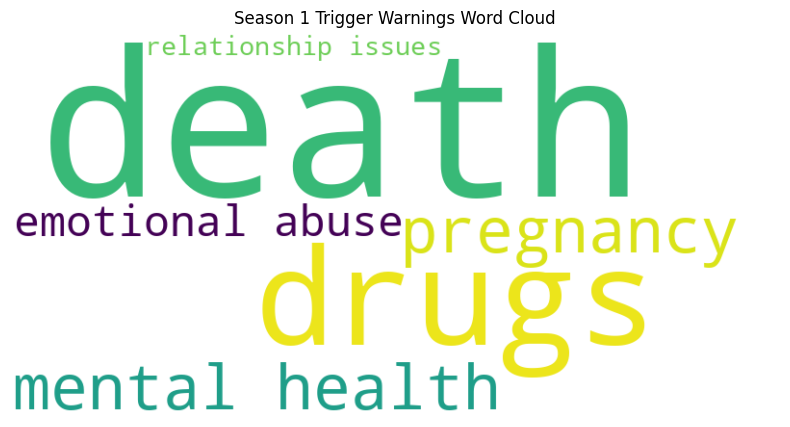

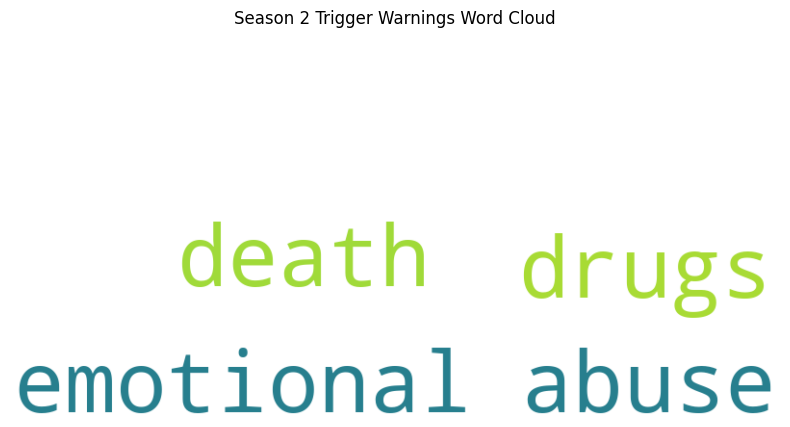

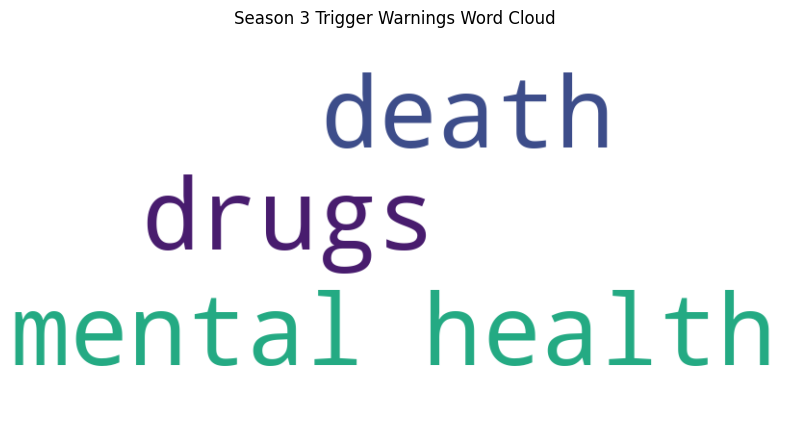

In [76]:
for season_number in range(1, 4):
    # Filter data for the current season
    season_data = combined_results_rm[combined_results_rm['Season.No'] == season_number]

    # Flatten the list of trigger warnings for the season
    warnings_list = [warning.strip().lower() for sublist in season_data['Top_3_Trigger_Warnings'].str.split(', ') for warning in sublist]

    # Count the occurrences of each trigger warning
    warnings_count = Counter(warnings_list)

    # Generate word cloud data
    wordcloud_data = {word: count for word, count in warnings_count.items()}

    # Create and display the word cloud
    rm_wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)

    plt.figure(figsize=(10, 5))
    plt.imshow(rm_wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Season {season_number} Trigger Warnings Word Cloud')
    plt.show()


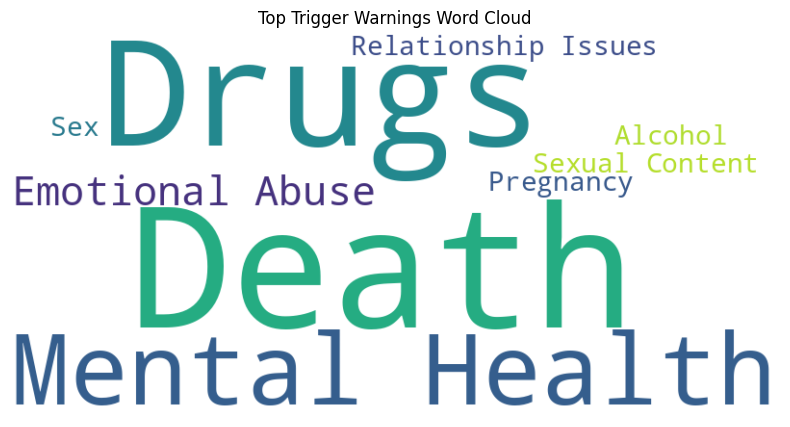

In [77]:
# WorldCloud of warnings for all seasons
# Concatenate all trigger warnings from each row into a single string
all_warnings_text = ', '.join(combined_results_rm['Top_3_Trigger_Warnings'])

# Split the text into words and filter out empty strings
words = [word.strip() for word in all_warnings_text.split(',') if word.strip()]

# Count the frequency of each word
word_freq = Counter(words)

# Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Top Trigger Warnings Word Cloud')
plt.show()

In [78]:
word_freq

Counter({'Drugs': 6,
         'Death': 8,
         'Mental Health': 4,
         'Emotional Abuse': 3,
         'Pregnancy': 1,
         'Sex': 1,
         'Relationship Issues': 1,
         'Alcohol': 1,
         'Sexual Content': 1})

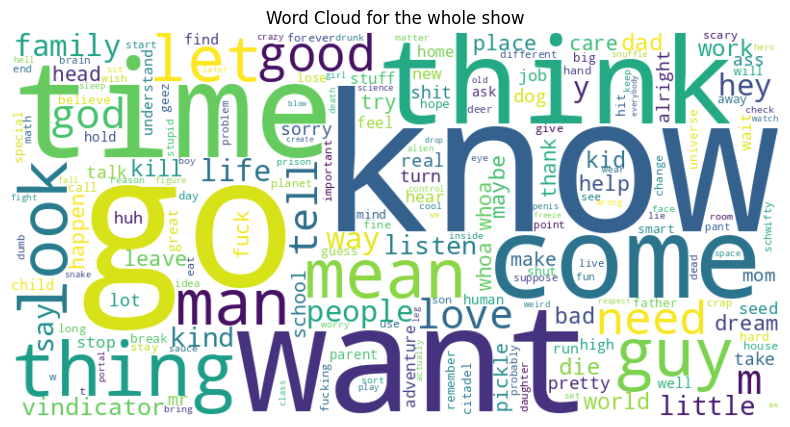

In [79]:
# Concatenate all dialogs from each row into a single string
all_text = ' '.join(RickAndMorty_data['Cleaned_Text'])

# Generate word frequencies for EP=1 and season=1
text_highlighted = ' '.join(RickAndMorty_data.loc[(RickAndMorty_data['Episode.No'] == 7) & (RickAndMorty_data['Season.No'] == 3), 'Cleaned_Text'])

# Create a word cloud, Darker word are used in S3E7
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)
wordcloud_highlighted = WordCloud(width=800, height=400, background_color ='white', color_func=lambda *args, **kwargs: "black").generate(text_highlighted)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for the whole show')
plt.show()

                                        Cleaned_Text Sentiment
0                                get come   get come   neutral
4                       come get surprise come hurry   neutral
5                                     ow ow tug hard  negative
6                   get get outta come get surprise    neutral
7  think fly vehicle   build outta stuff find garage   neutral
Word Cloud for Positive Sentiment:


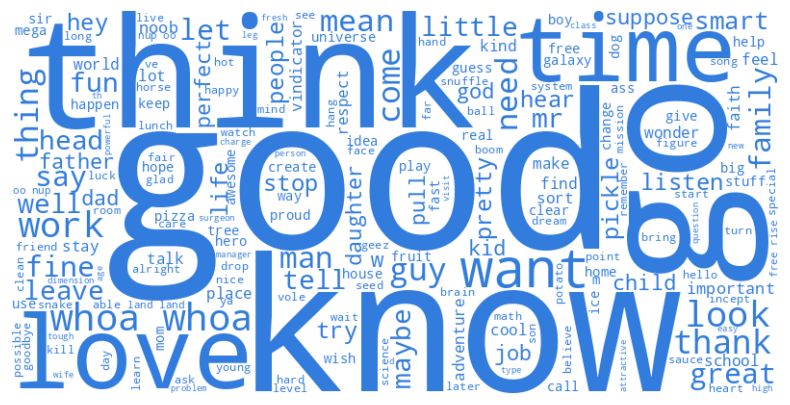

Word Cloud for Negative Sentiment:


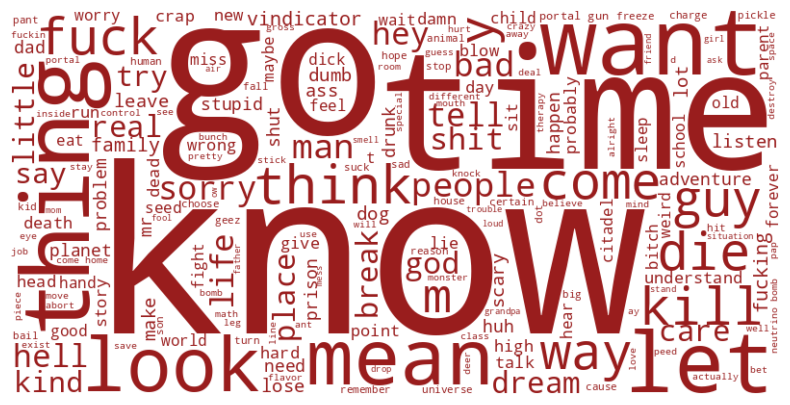

In [80]:
# WordCloud using bing
# Create a dictionary of words and their sentiment
sentiment_dict = pd.Series(bing.sentiment.values, index=bing.word).to_dict()

# Categorize each line
RickAndMorty_data['Sentiment'] = RickAndMorty_data['Cleaned_Text'].apply(lambda x: categorize_line(x, sentiment_dict))

# Preview the categorized data
print(RickAndMorty_data[['Cleaned_Text', 'Sentiment']].head())

# Aggregate words for each sentiment
positive_words = ' '.join(RickAndMorty_data[RickAndMorty_data['Sentiment'] == 'positive']['Cleaned_Text'].tolist())
negative_words = ' '.join(RickAndMorty_data[RickAndMorty_data['Sentiment'] == 'negative']['Cleaned_Text'].tolist())

# Generate and show word clouds for each sentiment
print("Word Cloud for Positive Sentiment:")
generate_wordcloud(positive_words, color='#327CDE')

print("Word Cloud for Negative Sentiment:")
generate_wordcloud(negative_words, color='#991D1D')

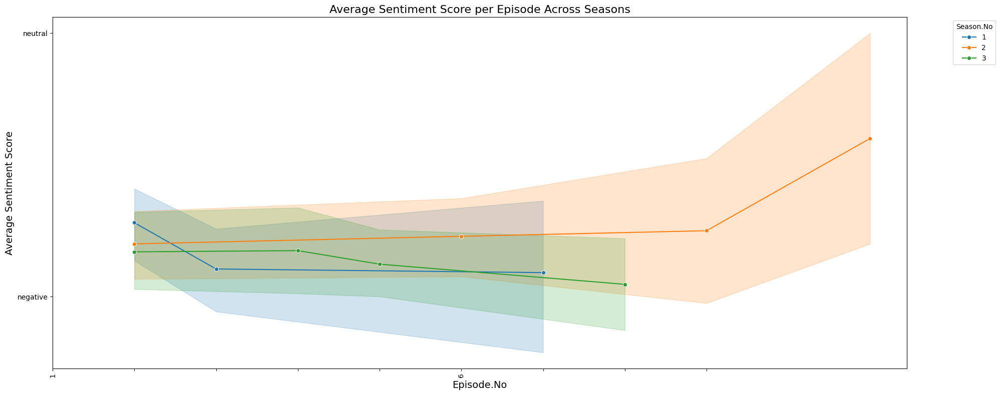

In [81]:
plt.figure(figsize=(20, 8))  # Increase figure size

# Line plot for average sentiment score per episode across seasons
sns.lineplot(data=RickAndMorty_data, x='Episode.No', y='Sentiment', hue='Season.No', marker='o', palette='tab10')

plt.title('Average Sentiment Score per Episode Across Seasons', fontsize=16)
plt.xlabel('Episode.No', fontsize=14)
plt.ylabel('Average Sentiment Score', fontsize=14)

# Adjust the display of episode labels on the x-axis for better readability
sorted_episodes = sorted(RickAndMorty_data['Episode.No'].unique())
visible_labels = [label if i % 5 == 0 else "" for i, label in enumerate(sorted_episodes)]
plt.xticks(ticks=range(len(sorted_episodes)), labels=visible_labels, rotation=90)  # Ensure x-ticks are set correctly

plt.legend(title='Season.No', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

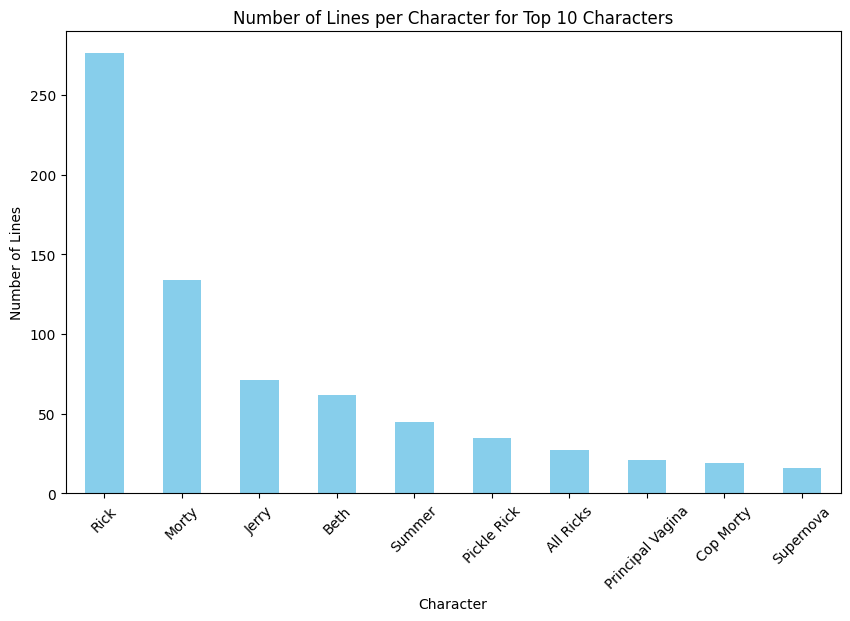

In [82]:
top_10_character_lines_count = RickAndMorty_data['Character.Name'].value_counts().head(10)

# Plotting the count of dialogues for the top 10 characters
plt.figure(figsize=(10, 6))
top_10_character_lines_count.plot(kind='bar', color='skyblue')
plt.title('Number of Lines per Character for Top 10 Characters')
plt.xlabel('Character')
plt.ylabel('Number of Lines')
plt.xticks(rotation=45)
plt.show()

# Social Media Analysis - Friends

In [83]:
import pandas as pd
import numpy as np
import re
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns

In [84]:
# Load the dataset
file_path = '/content/Friends.csv'
data_filtered = pd.read_csv(file_path)

In [85]:
data_filtered.head(10)

,Text,Speaker,Episode,Season,Show
0,Originally written by Marta Kauffman and David...,NaN,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends
1,Transcribed by guineapig.,NaN,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends
2,CENTRAL PERK. (ALL PRESENT EXCEPT RACHEL AND ...,SCENE 1,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends
3,There's nothing to tell! He's just some guy I...,MONICA,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends
4,"C'mon, you're going out with the guy! There's...",JOEY,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends
5,So does he have a hump? A hump and a hairpiece?,CHANDLER,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends
6,"Wait, does he eat chalk?",PHOEBE,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends
7,"(THE OTHERS STARE, BEMUSED)",NaN,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends
8,"Just, 'cause, I don't want her to go through ...",PHOEBE,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends
9,"Okay, everybody relax. This is not even a dat...",MONICA,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends


In [86]:
# Function to extract the simple episode code
def extract_simple_episode(episode_str):
    # Split by '-' and attempt to keep the "Episode-XX" format
    parts = episode_str.split('-')
    if len(parts) > 1:
        return '-'.join(parts[:2])  # Concatenate 'Episode' and the number, e.g., 'Episode-01'
    return episode_str  # Returns the original string if not in expected format

# Apply the function to the Episode column
data_filtered['Simple_Episode'] = data_filtered['Episode'].apply(extract_simple_episode)

# Display the updated DataFrame to verify the new column
print(data_filtered[['Episode', 'Simple_Episode']])

                                                 Episode Simple_Episode
0      Episode-01-The One Where Monica Gets a New Roo...     Episode-01
1      Episode-01-The One Where Monica Gets a New Roo...     Episode-01
2      Episode-01-The One Where Monica Gets a New Roo...     Episode-01
3      Episode-01-The One Where Monica Gets a New Roo...     Episode-01
4      Episode-01-The One Where Monica Gets a New Roo...     Episode-01
...                                                  ...            ...
69969              Episode-15-The One Where Estelle Dies     Episode-15
69970              Episode-15-The One Where Estelle Dies     Episode-15
69971              Episode-15-The One Where Estelle Dies     Episode-15
69972              Episode-15-The One Where Estelle Dies     Episode-15
69973              Episode-15-The One Where Estelle Dies     Episode-15

[69974 rows x 2 columns]


In [87]:
# Before proceeding, ensure that the 'Text' column exists
if 'Text' not in data_filtered.columns:
    raise ValueError("Column 'Text' does not exist in the dataset. Please check the dataset's structure.")

In [88]:
#Extract episode numbers
data_filtered['Episode_Number'] = data_filtered['Episode'].str.extract(r'(\d+)').astype(int)

In [89]:
data_filtered

,Text,Speaker,Episode,Season,Show,Simple_Episode,Episode_Number
0,Originally written by Marta Kauffman and David...,NaN,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends,Episode-01,1
1,Transcribed by guineapig.,NaN,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends,Episode-01,1
2,CENTRAL PERK. (ALL PRESENT EXCEPT RACHEL AND ...,SCENE 1,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends,Episode-01,1
3,There's nothing to tell! He's just some guy I...,MONICA,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends,Episode-01,1
4,"C'mon, you're going out with the guy! There's...",JOEY,Episode-01-The One Where Monica Gets a New Roo...,Season-01,Friends,Episode-01,1
...,...,...,...,...,...,...,...
69969,Then I'm happy too. (They're still hugging - ...,Ross,Episode-15-The One Where Estelle Dies,Season-10,Friends,Episode-15,15
69970,COMMERCIAL BREAK,NaN,Episode-15-The One Where Estelle Dies,Season-10,Friends,Episode-15,15
69971,Estelle's memorial service. Joey is giving a ...,[Scene,Episode-15-The One Where Estelle Dies,Season-10,Friends,Episode-15,15
69972,Thank you all for coming. We're here today to...,Joey,Episode-15-The One Where Estelle Dies,Season-10,Friends,Episode-15,15


In [90]:
# Remove all the voice-over line (Speaker= NaN or Scene)
data_filtered['Speaker'] = data_filtered['Speaker'].fillna('')

data_filtered = data_filtered[~data_filtered['Speaker'].str.contains('SCENE',case=False)]

data_filtered = data_filtered[data_filtered['Speaker'] != '']

print(data_filtered)

                                                    Text   Speaker  \
3       There's nothing to tell! He's just some guy I...    MONICA   
4       C'mon, you're going out with the guy! There's...      JOEY   
5        So does he have a hump? A hump and a hairpiece?  CHANDLER   
6                               Wait, does he eat chalk?    PHOEBE   
8       Just, 'cause, I don't want her to go through ...    PHOEBE   
...                                                  ...       ...   
69966         Yeah! I'm going to Paris. Thank you, Ross!    Rachel   
69967                         Yeah, yeah, oh! (They hug)      Ross   
69968                              Oh! Oh, I'm so happy.    Rachel   
69969   Then I'm happy too. (They're still hugging - ...      Ross   
69972   Thank you all for coming. We're here today to...      Joey   

                                                 Episode     Season     Show  \
3      Episode-01-The One Where Monica Gets a New Roo...  Season-01  Friends   

In [91]:
# Apply the functions to clean text
data_filtered['Cleaned_Text'] = data_filtered['Text'].apply(lambda x: handle_non_verbal_cues(remove_filler_words(expand_abbreviations(x))))

In [92]:
data_filtered['Cleaned_Text'] = data_filtered['Cleaned_Text'].apply(remove_named_entities)

In [93]:
data_filtered['Cleaned_Text'] = data_filtered['Cleaned_Text'].str.lower()
data_filtered['Cleaned_Text'] = data_filtered['Cleaned_Text'].apply(lambda x: clean_text(x))
data_filtered['Cleaned_Text'] = data_filtered['Cleaned_Text'].apply(remove_words)
data_filtered['Is_Short_Response'] = data_filtered['Cleaned_Text'].apply(is_short_response)
data_filtered = data_filtered[~data_filtered['Is_Short_Response']].copy()
data_filtered['Cleaned_Text'] = data_filtered['Cleaned_Text'].astype(str)

  Character.Name   word
0           JOEY  C'mon
1           JOEY      ,
2           JOEY    you
3           JOEY    're
4           JOEY  going
                                         Cleaned_Text Sentiment
4                               come go guy get wrong  negative
9    everybody relax date   people go dinner have s*x   neutral
12  alright high school stand middle cafeteria rea...   neutral
19     sudden phone start ring turn mother weird call  negative
22                            guy say hello want kill  negative
Word Cloud for Positive Sentiment:


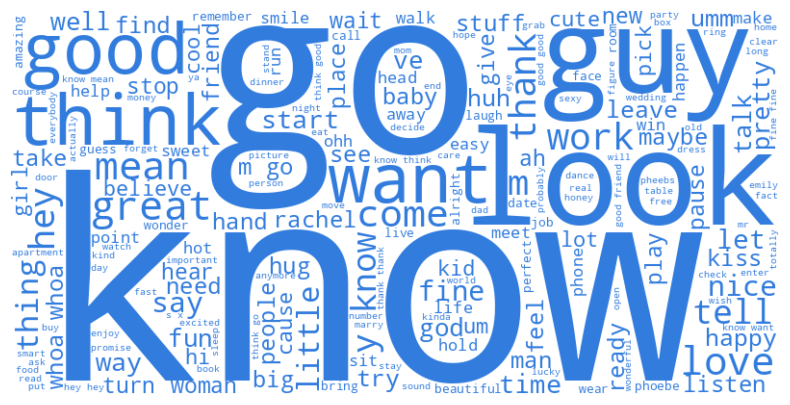

Word Cloud for Negative Sentiment:


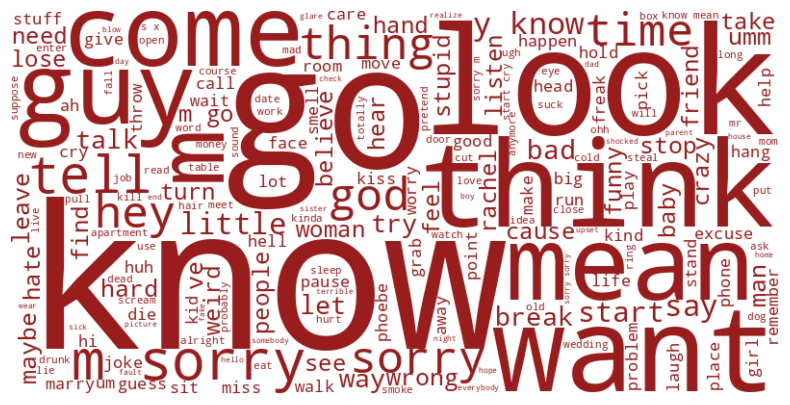

In [94]:
#bing
data_filtered['Text'] = data_filtered['Text'].astype(str)

# Tokenize the 'Text' column
data_filtered['tokens'] = data_filtered.apply(lambda row: word_tokenize(row['Text']), axis=1)

# Flatten the list of tokens with corresponding character names
rows = []
for _, row in data_filtered.iterrows():
    for word in row['tokens']:
        rows.append({'Character.Name': row['Speaker'], 'word': word})

# Create a DataFrame from the list of dictionaries
tokens_df = pd.DataFrame(rows)

# Display the first 5 rows
print(tokens_df.head(5))

# WordCloud using bing
# Create a dictionary of words and their sentiment
sentiment_dict = pd.Series(bing.sentiment.values, index=bing.word).to_dict()

# Categorize each line
data_filtered['Sentiment'] = data_filtered['Cleaned_Text'].apply(lambda x: categorize_line(x, sentiment_dict))

# Preview the categorized data
print(data_filtered[['Cleaned_Text', 'Sentiment']].head())

# Aggregate words for each sentiment
positive_words = ' '.join(data_filtered[data_filtered['Sentiment'] == 'positive']['Cleaned_Text'].tolist())
negative_words = ' '.join(data_filtered[data_filtered['Sentiment'] == 'negative']['Cleaned_Text'].tolist())

# Generate and show word clouds for each sentiment
print("Word Cloud for Positive Sentiment:")
generate_wordcloud(positive_words, color='#327CDE')

print("Word Cloud for Negative Sentiment:")
generate_wordcloud(negative_words, color='#991D1D')


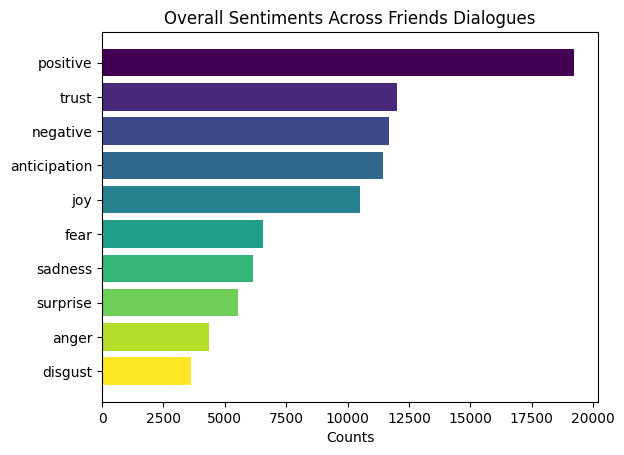

In [95]:
# NRC
# Create a sentiment dictionary where each word can have multiple sentiments
sentiment_dict = {}
for index, row in nrc.iterrows():
    if row['word'] not in sentiment_dict:
        sentiment_dict[row['word']] = []
    sentiment_dict[row['word']].append(row['sentiment'])
total_sentiments = Counter()
data_filtered['Sentiment_Counts'] = data_filtered['Text'].apply(determine_sentiments)
for counts in data_filtered['Sentiment_Counts']:
    total_sentiments.update(counts)

# Prepare data for plotting by sorting
sentiments_sorted = {k: v for k, v in sorted(total_sentiments.items(), key=lambda item: item[1], reverse=True)}
sentiments = list(sentiments_sorted.keys())
counts = [sentiments_sorted[sent] for sent in sentiments]

# Define a color for each sentiment
colors = plt.cm.viridis(np.linspace(0, 1, len(sentiments)))

# Plot the inverted bar graph with top sentiments at the top
fig, ax = plt.subplots()
ax.barh(sentiments, counts, color=colors)
ax.set_xlabel('Counts')
ax.set_title('Overall Sentiments Across Friends Dialogues')
ax.invert_yaxis()  # Inverts the y-axis so the bar with the highest count is on top
plt.show()

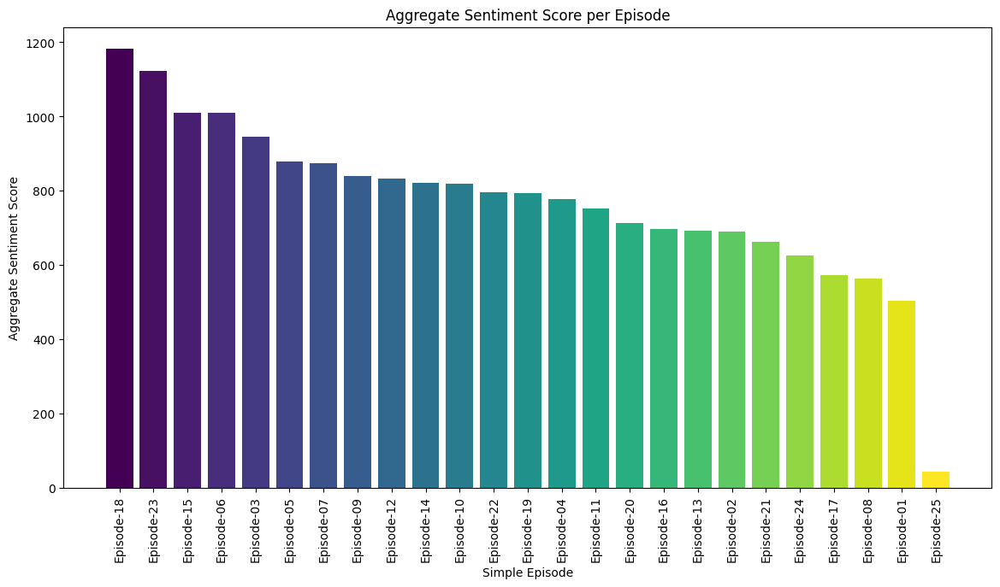

In [96]:
# AFINN
# Ensure the text is a string and tokenize it
data_filtered['tokens'] = data_filtered['Text'].apply(lambda x: word_tokenize(str(x).lower()))

# Expand the DataFrame so that each token gets its row, duplicating the other columns
all_words = data_filtered.explode('tokens')
all_words.rename(columns={'tokens': 'word'}, inplace=True)

# Merge with the AFINN data
merged_data = pd.merge(all_words, afinn, on='word', how='inner')

# Aggregate sentiment scores for each dialogue
sentiment_score = merged_data.groupby('Simple_Episode').agg({'value': 'sum'}).reset_index()

# Sorting values for plotting
sentiment_score_sorted = sentiment_score.sort_values('value', ascending=False)

# Plotting the sentiment distribution
fig, ax = plt.subplots(figsize=(14, 7))
colors = plt.cm.viridis(np.linspace(0, 1, len(sentiment_score_sorted)))
ax.bar(sentiment_score_sorted['Simple_Episode'], sentiment_score_sorted['value'], color=colors)
ax.set_xlabel('Simple Episode')
ax.set_ylabel('Aggregate Sentiment Score')
ax.set_title('Aggregate Sentiment Score per Episode')
plt.xticks(rotation=90)
plt.show()

In [97]:
# Categorization

In [98]:
# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(data_filtered['Cleaned_Text'])

In [99]:
# Latent Dirichlet Allocation (LDA) for Topic Modeling
n_components = 10
lda = LatentDirichletAllocation(n_components=n_components, random_state=42)
lda.fit(tfidf_matrix)

LatentDirichletAllocation(random_state=42)

In [100]:
tf_feature_names = tfidf_vectorizer.get_feature_names_out()
n_top_words = 30
print_top_words(lda, tf_feature_names, n_top_words)

Topic #0: whoa know think look friend come tell phone easy boy ya problem true good hey guy wife sorry job want bedroom married mean audition hang lie let gay say excuse
Topic #1: know hey sorry think look want guy talk come umm stop mean tell listen hard happy start stuff party little good weird time nice thing way let feel rachel person
Topic #2: door good know thank hey bye room walk look leave think away start want great open guy close enter dr key time box mean ve come cat need luck news
Topic #3: know want maybe think guy mean come look fine love stay tell hey need baby great good thing help alright time guess care cause kinda promise um plan home work
Topic #4: know tell look think want bad mean freak dad feel live hey come guy time hear eye girlfriend boyfriend restaurant doctor thing father roommate new love god lunch wh naked
Topic #5: know look guy come glad hi hey table thing think bed card happen ve check want cute hand god mean place point fight big clean good tv say leav

In [101]:
# Get topic distribution for each episode
topic_distributions = lda.transform(tfidf_matrix)

In [102]:
# From the keywords, we assign those categories for topics
categories_friends = [
'Inquiries and communication',
'Scenarios and actions',
'Positive emotions and social interactions',
'Family and future plans',
'Apologies and intimate relationships',
'Daily life and hobbies',
'Interpersonal relationships and emotional expressions',
'Social gatherings and greetings',
'Reflection and observation',
'Waiting and preparation'
]

In [103]:
# Apply the finding categories function to each episode
data_filtered['Top_3_Categories'] = [
    assign_top_three_categories(dist, categories_friends) for dist in topic_distributions
]

# Create a clean output DataFrame
result_df = data_filtered[['Season', 'Simple_Episode', 'Top_3_Categories']].copy()
result_df['Top_3_Categories_Str'] = result_df['Top_3_Categories'].apply(lambda x: ', '.join(x))

# Group by Season and Episode
grouped_results = result_df.groupby(['Season', 'Simple_Episode']).agg({
    'Top_3_Categories_Str': 'first'  # Ensure only the first occurrence is taken if duplicates exist
}).reset_index()

# Print and view the DataFrame
print(grouped_results)

        Season Simple_Episode  \
0    Season-01     Episode-01   
1    Season-01     Episode-02   
2    Season-01     Episode-03   
3    Season-01     Episode-04   
4    Season-01     Episode-05   
..         ...            ...   
220  Season-10     Episode-11   
221  Season-10     Episode-12   
222  Season-10     Episode-13   
223  Season-10     Episode-14   
224  Season-10     Episode-15   

                                  Top_3_Categories_Str  
0    Family and future plans, Scenarios and actions...  
1    Social gatherings and greetings, Reflection an...  
2    Social gatherings and greetings, Positive emot...  
3    Social gatherings and greetings, Positive emot...  
4    Waiting and preparation, Reflection and observ...  
..                                                 ...  
220  Interpersonal relationships and emotional expr...  
221  Family and future plans, Apologies and intimat...  
222  Reflection and observation, Inquiries and comm...  
223  Positive emotions and social

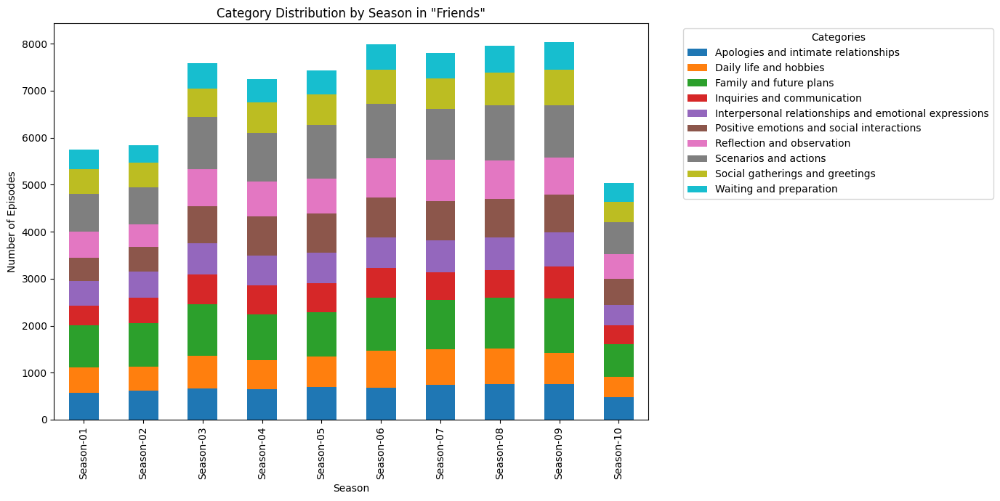

In [104]:
# Visualization of distribution by season
data_for_visualization = data_filtered.explode('Top_3_Categories')
season_theme_counts = data_for_visualization.groupby(['Season', 'Top_3_Categories']).size().unstack(fill_value=0)

# Plotting
season_theme_counts.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='tab10')
plt.title('Category Distribution by Season in "Friends"')
plt.xlabel('Season')
plt.ylabel('Number of Episodes')
plt.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [105]:
#Sentiment Analysis
from textblob import TextBlob

# Function to get sentiment
def get_sentiment(text):
    analysis = TextBlob(text)
    # Return a polarity score
    return analysis.sentiment.polarity

# Apply sentiment analysis to cleaned text
data_filtered['Sentiment'] = data_filtered['Cleaned_Text'].apply(get_sentiment)
data_filtered['Sentiment']

4       -0.500000
9        0.000000
12       0.053333
19      -0.250000
22       0.000000
           ...   
69954    0.276389
69955    0.031250
69956    0.376042
69963    0.000000
69972    0.783333
Name: Sentiment, Length: 23554, dtype: float64

In [106]:
#Categorize sentiment scores into 'Positive', 'Neutral', and 'Negative'
data_filtered['Sentiment_Category'] = pd.cut(data_filtered['Sentiment'], bins=[-1, -0.01, 0.01, 1], labels=['Negative', 'Neutral', 'Positive'])

In [107]:
# Sensitive content detection

In [108]:
# Apply the function to identify episodes with sensitive content
data_filtered['Trigger_Warnings'] = data_filtered['Cleaned_Text'].apply(check_sensitive_content)

# Group by Season and Episode, summing the Counters directly
grouped_data = data_filtered.groupby(['Season', 'Simple_Episode'])['Trigger_Warnings'].agg(sum)

# Apply function to get the top three trigger warnings for each grouped data
grouped_data = grouped_data.apply(get_top_three_triggers)

# Reset index and prepare for display
final_results = grouped_data.reset_index()
final_results.columns = ['Season', 'Simple_Episode', 'Top_3_Trigger_Warnings']

# Print and view the DataFrame
print(final_results)

        Season Simple_Episode                  Top_3_Trigger_Warnings
0    Season-01     Episode-01                     Drugs, Alcohol, Sex
1    Season-01     Episode-02                  Homophobia, Death, Sex
2    Season-01     Episode-03            Sex, Sexual Content, Alcohol
3    Season-01     Episode-04            Death, Pregnancy, Body Image
4    Season-01     Episode-05            Sex, Sexual Content, Alcohol
..         ...            ...                                     ...
220  Season-10     Episode-11       Drugs, Body Image, Sexual Content
221  Season-10     Episode-12                Drugs, Death, Body Image
222  Season-10     Episode-13  Relationship Issues, Body Image, Drugs
223  Season-10     Episode-14                                   Death
224  Season-10     Episode-15                                   Death

[225 rows x 3 columns]


In [109]:
combined_results_friends = pd.merge(grouped_results, final_results, on=['Season', 'Simple_Episode'], how='outer')

# Check the resulting DataFrame
combined_results_friends

,Season,Simple_Episode,Top_3_Categories_Str,Top_3_Trigger_Warnings
0,Season-01,Episode-01,"Family and future plans, Scenarios and actions...","Drugs, Alcohol, Sex"
1,Season-01,Episode-02,"Social gatherings and greetings, Reflection an...","Homophobia, Death, Sex"
2,Season-01,Episode-03,"Social gatherings and greetings, Positive emot...","Sex, Sexual Content, Alcohol"
3,Season-01,Episode-04,"Social gatherings and greetings, Positive emot...","Death, Pregnancy, Body Image"
4,Season-01,Episode-05,"Waiting and preparation, Reflection and observ...","Sex, Sexual Content, Alcohol"
...,...,...,...,...
220,Season-10,Episode-11,Interpersonal relationships and emotional expr...,"Drugs, Body Image, Sexual Content"
221,Season-10,Episode-12,"Family and future plans, Apologies and intimat...","Drugs, Death, Body Image"
222,Season-10,Episode-13,"Reflection and observation, Inquiries and comm...","Relationship Issues, Body Image, Drugs"
223,Season-10,Episode-14,"Positive emotions and social interactions, Int...",Death


In [110]:
# Convert season to numeric
combined_results_friends['Season'] = combined_results_friends['Season'].str[-2:].astype(int)

# Convert ep to numeric
combined_results_friends['Simple_Episode'] = combined_results_friends['Simple_Episode'].str[-2:].astype(int)

for season_number in range(1, 10):
    season_data = combined_results_friends[combined_results_friends['Season'] == season_number]
    warnings_list = season_data['Top_3_Trigger_Warnings'].str.split(', ')
    warnings_count = {}
    for warnings in warnings_list:
        for warning in warnings:
            warnings_count[warning.strip()] = warnings_count.get(warning.strip(), 0) + 1
    max_warning = max(warnings_count, key=warnings_count.get)
    max_count = warnings_count[max_warning]

    print(f"The most common warning in season {season_number} is '{max_warning}' with {max_count} occurrences.")

The most common warning in season 1 is 'Sex' with 12 occurrences.
The most common warning in season 2 is 'Drugs' with 11 occurrences.
The most common warning in season 3 is 'Death' with 12 occurrences.
The most common warning in season 4 is 'Drugs' with 9 occurrences.
The most common warning in season 5 is 'Death' with 11 occurrences.
The most common warning in season 6 is 'Death' with 12 occurrences.
The most common warning in season 7 is 'Alcohol' with 12 occurrences.
The most common warning in season 8 is 'Pregnancy' with 13 occurrences.
The most common warning in season 9 is 'Death' with 11 occurrences.


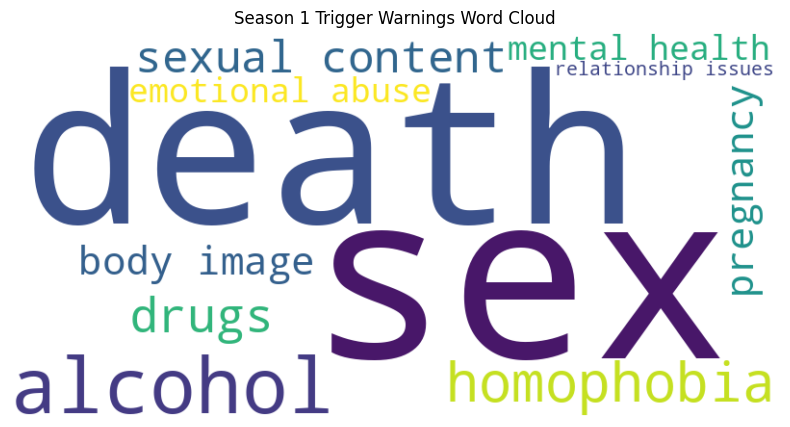

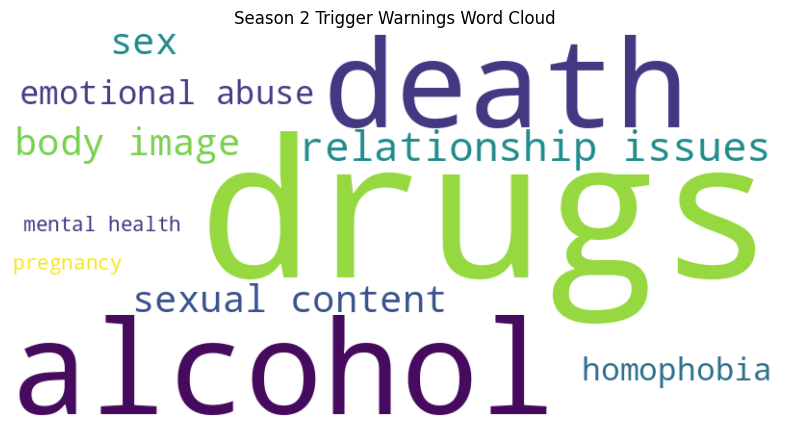

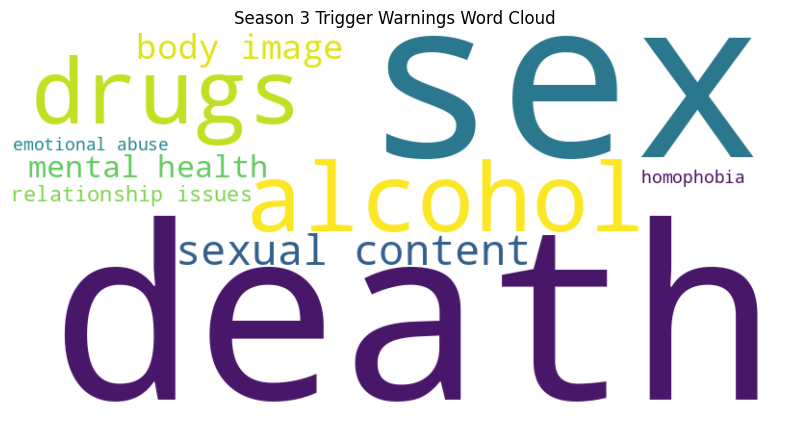

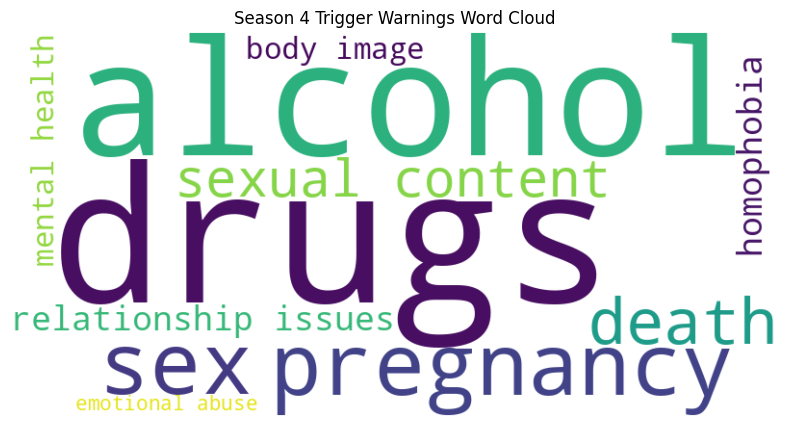

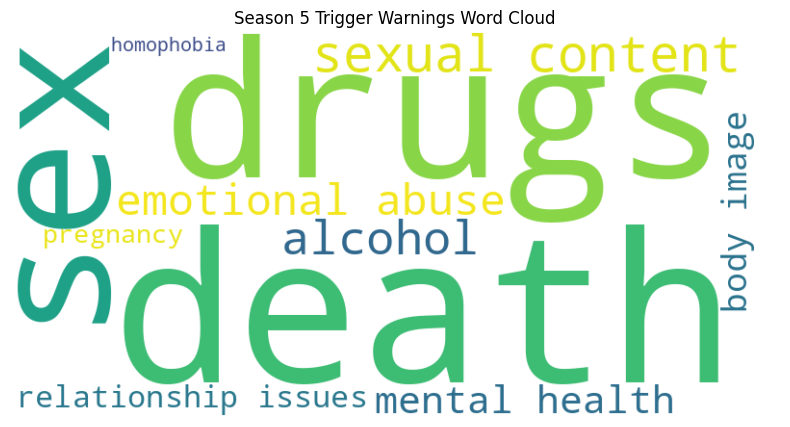

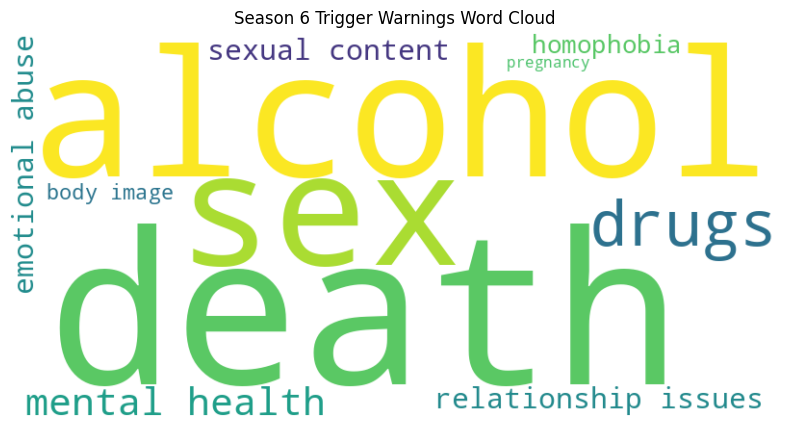

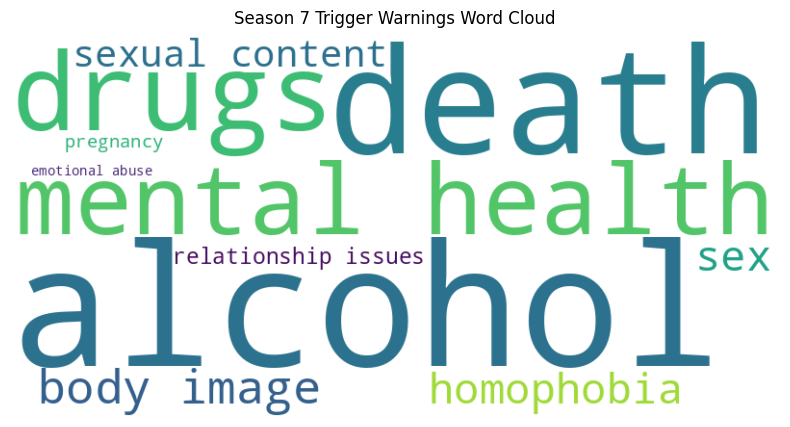

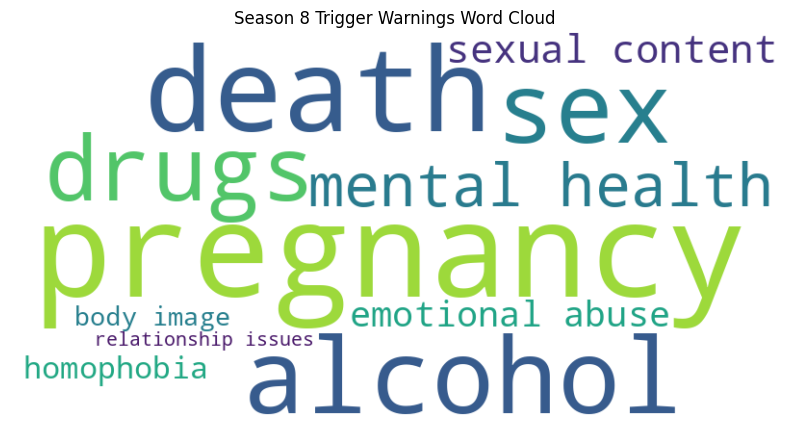

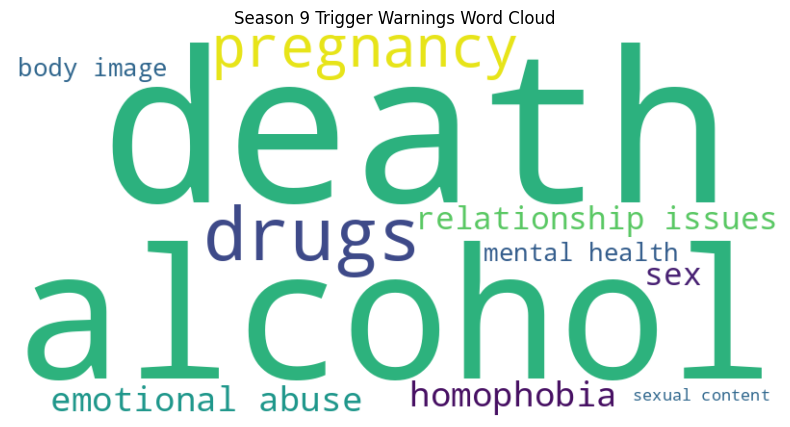

In [111]:
for season_number in range(1, 10):
    # Filter data for the current season
    season_data = combined_results_friends[combined_results_friends['Season'] == season_number]
    # Flatten the list of trigger warnings for the season
    warnings_list = [warning.strip().lower() for sublist in season_data['Top_3_Trigger_Warnings'].str.split(', ') for warning in sublist]

    # Count the occurrences of each trigger warning
    warnings_count = Counter(warnings_list)

    # Generate word cloud data
    wordcloud_data = {word: count for word, count in warnings_count.items()}

    # Create and display the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Season {season_number} Trigger Warnings Word Cloud')
    plt.show()


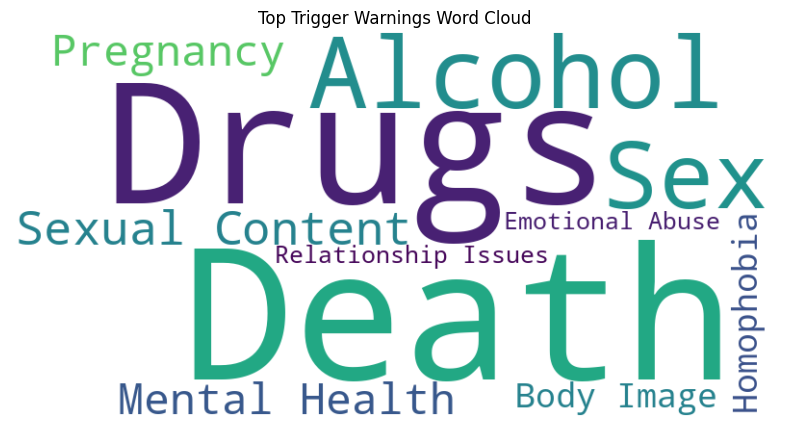

In [112]:
# Concatenate all trigger warnings from each row into a single string
all_warnings_text = ', '.join(combined_results_friends['Top_3_Trigger_Warnings'])

# Split the text into words and filter out empty strings
words = [word.strip() for word in all_warnings_text.split(',') if word.strip()]

# Count the frequency of each word
word_freq = Counter(words)

# Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Top Trigger Warnings Word Cloud')
plt.show()

In [113]:
word_freq

Counter({'Drugs': 78,
         'Alcohol': 77,
         'Sex': 67,
         'Homophobia': 35,
         'Death': 94,
         'Sexual Content': 47,
         'Pregnancy': 39,
         'Body Image': 36,
         'Relationship Issues': 32,
         'Emotional Abuse': 32,
         'Mental Health': 39})

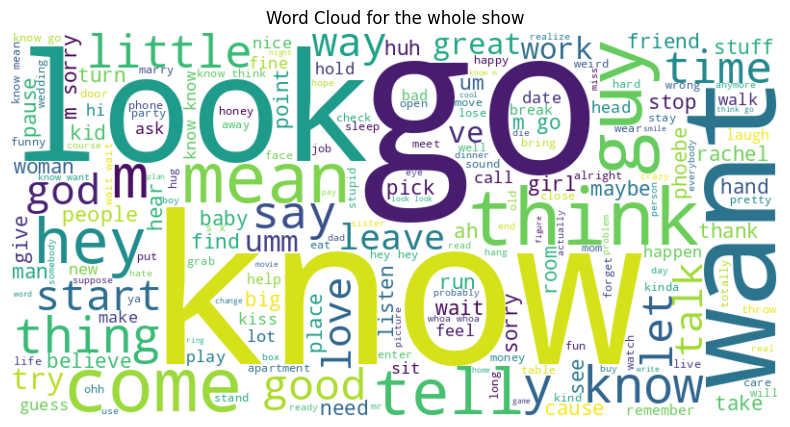

In [114]:
# Convert season to numeric
data_filtered['Season'] = data_filtered['Season'].str[-2:].astype(int)

# Convert ep to numeric
data_filtered['Simple_Episode'] = data_filtered['Simple_Episode'].str[-2:].astype(int)

# Concatenate all text from each row into a single string
all_text = ' '.join(data_filtered['Cleaned_Text'])

# Generate word frequencies for S4EP20. That is one triggering ep according to reddit
text_highlighted = ' '.join(data_filtered.loc[(data_filtered['Simple_Episode'] == 20) & (data_filtered['Season'] == 4), 'Cleaned_Text'])

# Create a word cloud, Darker word are used in S3E7
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)
wordcloud_highlighted = WordCloud(width=800, height=400, background_color ='white', color_func=lambda *args, **kwargs: "black").generate(text_highlighted)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for the whole show')
plt.show()

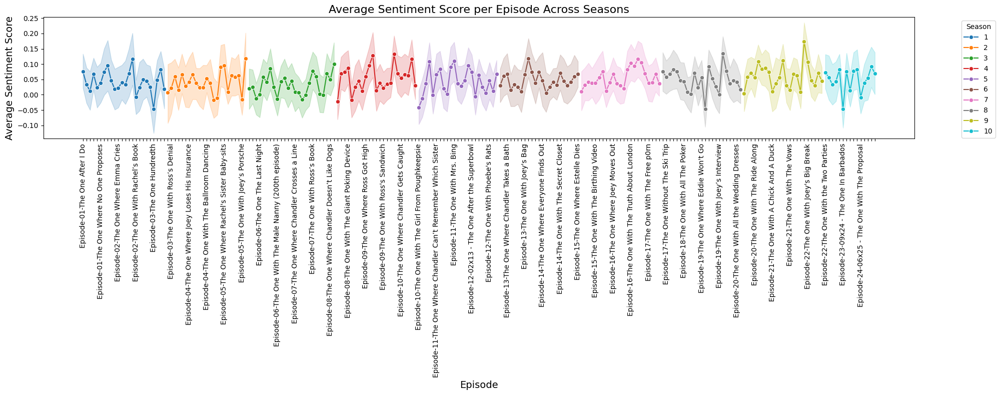

In [115]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20, 8))  # Increase figure size

# Line plot for average sentiment score per episode across seasons
sns.lineplot(data=data_filtered, x='Episode', y='Sentiment', hue='Season', marker='o', palette='tab10')

plt.title('Average Sentiment Score per Episode Across Seasons', fontsize=16)
plt.xlabel('Episode', fontsize=14)
plt.ylabel('Average Sentiment Score', fontsize=14)

# Adjust the display of episode labels on the x-axis for better readability
# Here we assume 'data_filtered' is indexed correctly and 'Episode' is accessible
# Also check if Episode is sorted if not we should sort it or the visualization can be misleading
sorted_episodes = sorted(data_filtered['Episode'].unique())
visible_labels = [label if i % 5 == 0 else "" for i, label in enumerate(sorted_episodes)]
plt.xticks(ticks=range(len(sorted_episodes)), labels=visible_labels, rotation=90)  # Ensure x-ticks are set correctly

plt.legend(title='Season', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [116]:
#Character Analysis
#Filter data for main characters
main_characters = ["ROSS", "MONICA", "RACHEL", "JOEY", "CHANDLER", "PHOEBE"]
data_main_characters = data_filtered[data_filtered['Speaker'].isin(main_characters)]

In [117]:
data_main_characters

,Text,Speaker,Episode,Season,Show,Simple_Episode,Episode_Number,Cleaned_Text,Is_Short_Response,tokens,Sentiment,Sentiment_Counts,Top_3_Categories,Sentiment_Category,Trigger_Warnings
4,"C'mon, you're going out with the guy! There's...",JOEY,Episode-01-The One Where Monica Gets a New Roo...,1,Friends,1,1,come go guy get wrong,False,"[c'mon, ,, you, 're, going, out, with, the, gu...",-0.500000,{'negative': 1},"[Family and future plans, Scenarios and action...",Negative,{}
9,"Okay, everybody relax. This is not even a dat...",MONICA,Episode-01-The One Where Monica Gets a New Roo...,1,Friends,1,1,everybody relax date people go dinner have s*x,False,"[okay, ,, everybody, relax, ., this, is, not, ...",0.000000,{'positive': 1},"[Inquiries and communication, Interpersonal re...",Neutral,{}
12,"Alright, so I'm back in high school, I'm stan...",CHANDLER,Episode-01-The One Where Monica Gets a New Roo...,1,Friends,1,1,alright high school stand middle cafeteria rea...,False,"[alright, ,, so, i, 'm, back, in, high, school...",0.053333,"{'trust': 1, 'positive': 1}","[Apologies and intimate relationships, Waiting...",Positive,"{'Sex': 1, 'Drugs': 1, 'Sexual Content': 1}"
19,"All of a sudden, the phone starts to ring. An...",CHANDLER,Episode-01-The One Where Monica Gets a New Roo...,1,Friends,1,1,sudden phone start ring turn mother weird call,False,"[all, of, a, sudden, ,, the, phone, starts, to...",-0.250000,"{'surprise': 1, 'anticipation': 2, 'joy': 1, '...","[Inquiries and communication, Reflection and o...",Negative,{}
22,"This guy says hello, I wanna kill myself.",JOEY,Episode-01-The One Where Monica Gets a New Roo...,1,Friends,1,1,guy say hello want kill,False,"[this, guy, says, hello, ,, i, wan, na, kill, ...",0.000000,"{'fear': 2, 'negative': 2, 'sadness': 2}","[Reflection and observation, Inquiries and com...",Neutral,{}
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14464,"Hey, I don't know what to tell you guys that'...",ROSS,Episode-04-The One with the Metaphorical Tunnel,3,Friends,4,4,hey know tell guy doll,False,"[hey, ,, i, do, n't, know, what, to, tell, you...",0.000000,{'joy': 1},"[Daily life and hobbies, Scenarios and actions...",Neutral,{}
14472,"Well, you used to dress up in Mom's clothes a...",MONICA,Episode-04-The One with the Metaphorical Tunnel,3,Friends,4,4,dress mom clothe time,False,"[well, ,, you, used, to, dress, up, in, mom, '...",0.000000,{'anticipation': 1},"[Family and future plans, Apologies and intima...",Neutral,{}
14474,"The big hat, the pearls, the little pick hand...",MONICA,Episode-04-The One with the Metaphorical Tunnel,3,Friends,4,4,big hat pearl little pick handbag,False,"[the, big, hat, ,, the, pearls, ,, the, little...",-0.093750,{'positive': 1},"[Daily life and hobbies, Reflection and observ...",Negative,{}
14487,(coming out of the bathroom) Won't you dance ...,ROSS,Episode-04-The One with the Metaphorical Tunnel,3,Friends,4,4,come bathroom will dance,False,"[(, coming, out, of, the, bathroom, ), wo, n't...",0.000000,"{'anticipation': 1, 'joy': 1, 'positive': 1, '...","[Scenarios and actions, Daily life and hobbies...",Neutral,{}


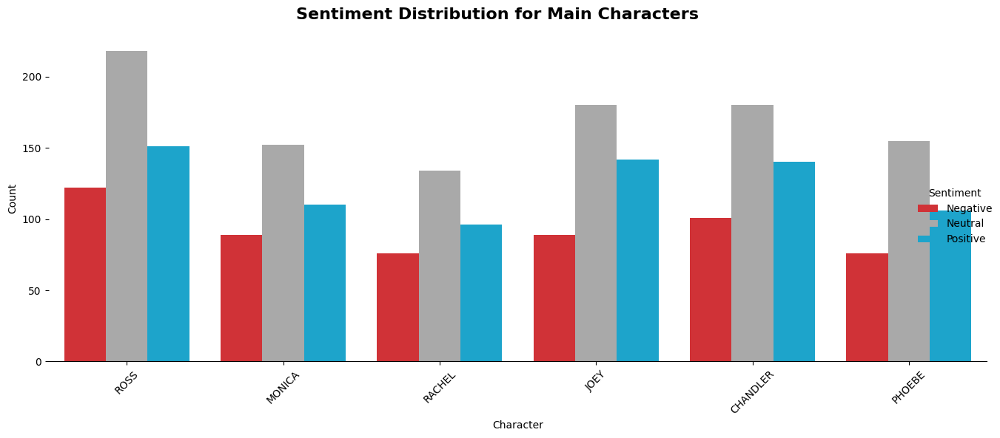

In [118]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define a new palette that includes a color for 'Neutral'
sentiment_palette = {"Positive": "#00B4E8", "Negative": "#EA181E", "Neutral": "#A9A9A9"}

# Create a faceted bar plot showing sentiment distribution for each character
g = sns.catplot(
    data=data_main_characters,
    x='Speaker',
    hue='Sentiment_Category',
    palette=sentiment_palette,
    kind='count',
    height=6,
    aspect=2,
    order=main_characters,
    hue_order=['Negative', 'Neutral', 'Positive']  # Ensuring consistent order
)

# Improve the aesthetics and layout
g.set_axis_labels("Character", "Count")
g.set_titles("{col_name}")
g.fig.suptitle("Sentiment Distribution for Main Characters", fontsize=16, fontweight='bold')
g._legend.set_title('Sentiment')
g._legend.set_bbox_to_anchor((1, 0.5))  # Adjust legend position
g.despine(left=True)  # Remove left spine for cleaner look

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# The Office Analysis

In [119]:
import pandas as pd
import numpy as np
import re
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns
import nltk
import string

In [120]:
# read dataset
office_df = pd.read_csv('/content/the_office.csv')

In [121]:
office_df['line_text'] = office_df['line_text'].str.replace('���', "'")
office_df

,id,season,episode,scene,line_text,speaker,deleted
0,1,1,1,1,All right Jim. Your quarterlies look very good...,Michael,False
1,2,1,1,1,"Oh, I told you. I couldn't close it. So...",Jim,False
2,3,1,1,1,So you've come to the master for guidance? Is ...,Michael,False
3,4,1,1,1,"Actually, you called me in here, but yeah.",Jim,False
4,5,1,1,1,"All right. Well, let me show you how it's done.",Michael,False
...,...,...,...,...,...,...,...
59904,59905,9,23,112,It all seems so very arbitrary. I applied for ...,Creed,False
59905,59906,9,23,113,I just feel lucky that I got a chance to share...,Meredith,False
59906,59907,9,23,114,I'm happy that this was all filmed so I can re...,Phyllis,False
59907,59908,9,23,115,I sold paper at this company for 12 years. My ...,Jim,False


In [122]:
office_df['Cleaned_Text'] = office_df['line_text'].apply(lambda x: handle_non_verbal_cues(remove_filler_words(expand_abbreviations(x))))

In [123]:
# Remove the named entities from df
office_df['Cleaned_Text'] = office_df['Cleaned_Text'].apply(remove_named_entities)

In [124]:
# Normalize Text (convert to lowercase)
office_df['Cleaned_Text'] = office_df['Cleaned_Text'].str.lower()

In [125]:
office_df

,id,season,episode,scene,line_text,speaker,deleted,Cleaned_Text
0,1,1,1,1,All right Jim. Your quarterlies look very good...,Michael,False,all right . your quarterlies look very good ....
1,2,1,1,1,"Oh, I told you. I couldn't close it. So...",Jim,False,"oh , i told you . i could n't close it . so ..."
2,3,1,1,1,So you've come to the master for guidance? Is ...,Michael,False,so you have come to the master for guidance ? ...
3,4,1,1,1,"Actually, you called me in here, but yeah.",Jim,False,"actually , you called me in here , but yeah ."
4,5,1,1,1,"All right. Well, let me show you how it's done.",Michael,False,"all right . well , let me show you how it is d..."
...,...,...,...,...,...,...,...,...
59904,59905,9,23,112,It all seems so very arbitrary. I applied for ...,Creed,False,it all seems very arbitrary . i applied for a ...
59905,59906,9,23,113,I just feel lucky that I got a chance to share...,Meredith,False,i just feel lucky that i got a chance to share...
59906,59907,9,23,114,I'm happy that this was all filmed so I can re...,Phyllis,False,i am happy that this was all filmed i can reme...
59907,59908,9,23,115,I sold paper at this company for 12 years. My ...,Jim,False,i sold paper at this company for . my job wa...


In [126]:
# Clean Text
office_df['Cleaned_Text'] = office_df['Cleaned_Text'].apply(lambda x: clean_text(x))

In [127]:
office_df

,id,season,episode,scene,line_text,speaker,deleted,Cleaned_Text
0,1,1,1,1,All right Jim. Your quarterlies look very good...,Michael,False,right quarterly look good thing library
1,2,1,1,1,"Oh, I told you. I couldn't close it. So...",Jim,False,oh tell close
2,3,1,1,1,So you've come to the master for guidance? Is ...,Michael,False,come master guidance say grasshopper
3,4,1,1,1,"Actually, you called me in here, but yeah.",Jim,False,actually call yeah
4,5,1,1,1,"All right. Well, let me show you how it's done.",Michael,False,right let
...,...,...,...,...,...,...,...,...
59904,59905,9,23,112,It all seems so very arbitrary. I applied for ...,Creed,False,arbitrary apply job company hire take desk mat...
59905,59906,9,23,113,I just feel lucky that I got a chance to share...,Meredith,False,feel lucky get chance share crummy story think...
59906,59907,9,23,114,I'm happy that this was all filmed so I can re...,Phyllis,False,happy film remember work paper company write
59907,59908,9,23,115,I sold paper at this company for 12 years. My ...,Jim,False,sell paper company job speak client phone q...


In [128]:
# Handle the short response
office_df['Is_Short_Response'] = office_df['Cleaned_Text'].apply(is_short_response)

In [129]:
# Filter the dataset to exclude short responses for thematic analysis
office_df = office_df[~office_df['Is_Short_Response']].copy()

In [130]:
office_df['Cleaned_Text'] = office_df['Cleaned_Text'].astype(str)

In [131]:
# Removing verbals(short responses)
office_df['Cleaned_Text'] = office_df['Cleaned_Text'].apply(remove_words)

   speaker   word
0  Michael    All
1  Michael  right
2  Michael    Jim
3  Michael      .
4  Michael   Your
                                         Cleaned_Text Sentiment
0                   quarterly look good thing library  positive
2                come master guidance say grasshopper  positive
5    speak office manager  hello    regional manag...  negative
6              manager want come entire floor king...   neutral
12   pam   time tell special filing cabinet thing ...   neutral
Word Cloud for Positive Sentiment:


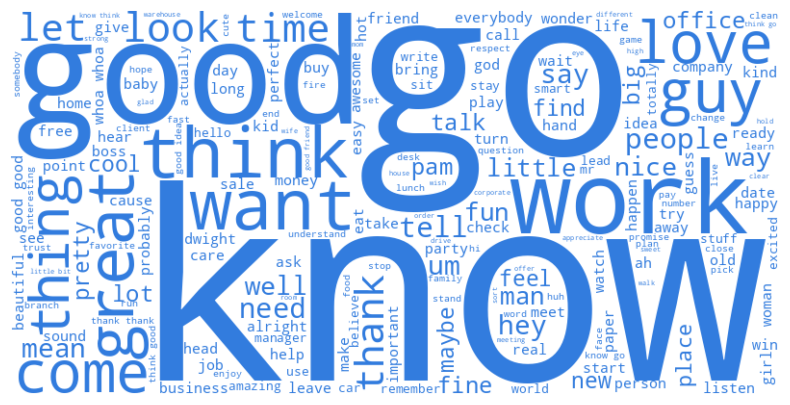

Word Cloud for Negative Sentiment:


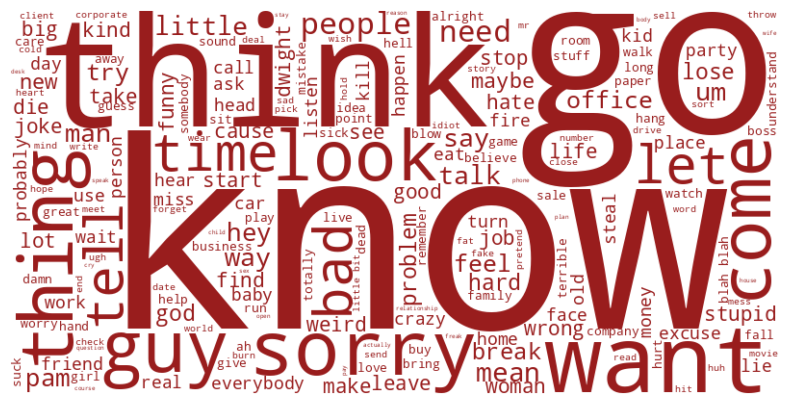

In [132]:
#bing
# Ensure 'line_text' is in string format
office_df['line_text'] = office_df['line_text'].astype(str)

# Tokenize the 'line_text’ column
office_df['tokens'] = office_df.apply(lambda row: word_tokenize(row['line_text']), axis=1)

# Flatten the list of tokens with corresponding character names
rows = []
for _, row in office_df.iterrows():
    for word in row['tokens']:
        rows.append({'speaker': row['speaker'], 'word': word})

# Create a DataFrame from the list of dictionaries
tokens_office_df = pd.DataFrame(rows)

# Display the first 5 rows
print(tokens_office_df.head(5))

# WordCloud using bing
# Create a dictionary of words and their sentiment
sentiment_dict = pd.Series(bing.sentiment.values, index=bing.word).to_dict()

# Categorize each line
office_df['Sentiment'] = office_df['Cleaned_Text'].apply(lambda x: categorize_line(x, sentiment_dict))

# Preview the categorized data
print(office_df[['Cleaned_Text', 'Sentiment']].head())

# Aggregate words for each sentiment
positive_words = ' '.join(office_df[office_df['Sentiment'] == 'positive']['Cleaned_Text'].tolist())
negative_words = ' '.join(office_df[office_df['Sentiment'] == 'negative']['Cleaned_Text'].tolist())

# Generate and show word clouds for each sentiment
print("Word Cloud for Positive Sentiment:")
generate_wordcloud(positive_words, color='#327CDE')

print("Word Cloud for Negative Sentiment:")
generate_wordcloud(negative_words, color='#991D1D')

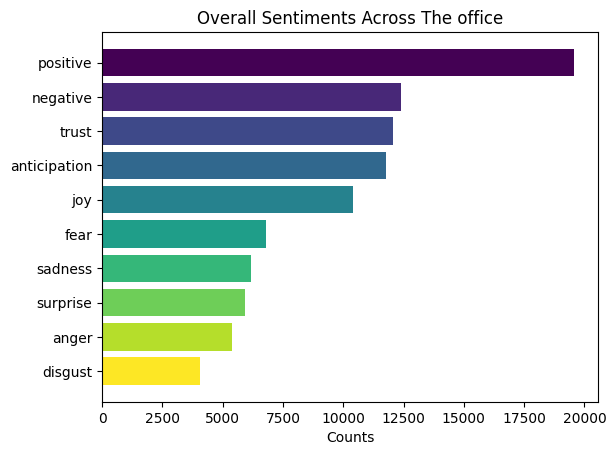

In [133]:
# NRC
# Create a sentiment dictionary where each word can have multiple sentiments
sentiment_dict = {}
for index, row in nrc.iterrows():
    if row['word'] not in sentiment_dict:
        sentiment_dict[row['word']] = []
    sentiment_dict[row['word']].append(row['sentiment'])
# Apply the function to each ’line’ and sum up all sentiment counts
total_sentiments = Counter()
office_df['Sentiment_Counts'] = office_df['line_text'].apply(determine_sentiments)
for counts in office_df['Sentiment_Counts']:
    total_sentiments.update(counts)

# Prepare data for plotting by sorting
sentiments_sorted = {k: v for k, v in sorted(total_sentiments.items(), key=lambda item: item[1], reverse=True)}
sentiments = list(sentiments_sorted.keys())
counts = [sentiments_sorted[sent] for sent in sentiments]

# Define a color for each sentiment
colors = plt.cm.viridis(np.linspace(0, 1, len(sentiments)))

# Plot the inverted bar graph with top sentiments at the top
fig, ax = plt.subplots()
ax.barh(sentiments, counts, color=colors)
ax.set_xlabel('Counts')
ax.set_title('Overall Sentiments Across The office')
ax.invert_yaxis()  # Inverts the y-axis so the bar with the highest count is on top
plt.show()

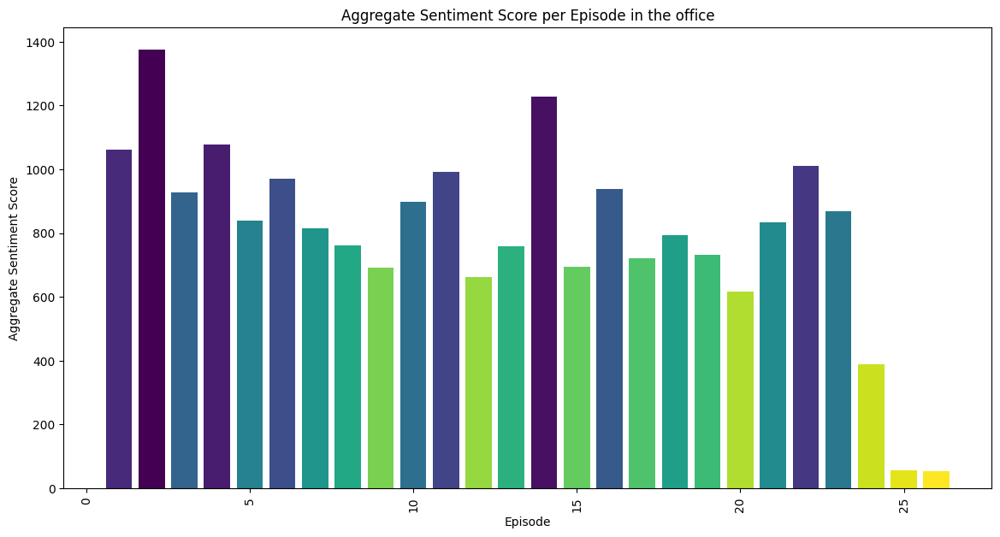

In [134]:
# AFINN
# Ensure the text is a string and tokenize it
office_df['tokens'] = office_df['line_text'].apply(lambda x: word_tokenize(str(x).lower()))

# Expand the DataFrame so that each token gets its row, duplicating the other columns
all_words = office_df.explode('tokens')
all_words.rename(columns={'tokens': 'word'}, inplace=True)

# Merge with the AFINN data
merged_data = pd.merge(all_words, afinn, on='word', how='inner')

# Aggregate sentiment scores for each dialogue
sentiment_score = merged_data.groupby('episode').agg({'value': 'sum'}).reset_index()

# Sorting values for plotting
sentiment_score_sorted = sentiment_score.sort_values('value', ascending=False)

# Plotting the sentiment distribution
fig, ax = plt.subplots(figsize=(14, 7))
colors = plt.cm.viridis(np.linspace(0, 1, len(sentiment_score_sorted)))
ax.bar(sentiment_score_sorted['episode'], sentiment_score_sorted['value'], color=colors)
ax.set_xlabel('Episode')
ax.set_ylabel('Aggregate Sentiment Score')
ax.set_title('Aggregate Sentiment Score per Episode in the office')
plt.xticks(rotation=90)
plt.show()

In [135]:
# Exploratory Data Analysis (EDA)
# Frequency of words or phrases
word_frequency = office_df['Cleaned_Text'].str.split(expand=True).stack().value_counts()
word_frequency

know                               3642
go                                 3191
think                              2273
want                               2119
good                               1748
                                   ... 
ds                                    1
nintendo                              1
rainforest                            1
moan                                  1
stupid'wonderful'boring'amazing       1
Name: count, Length: 11659, dtype: int64

In [136]:
# Topic modelling
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(office_df['Cleaned_Text'])

In [137]:
NUM_TOPICS = 10

In [138]:
# Latent Dirichlet Allocation (LDA) for Topic Modeling
lda = LatentDirichletAllocation(n_components=NUM_TOPICS, random_state=42)
office_df_lda = lda.fit(tfidf_matrix)

In [139]:
# Print topics and the top 30 words
tf_feature_names = tfidf_vectorizer.get_feature_names_out()
n_top_words = 30
print_top_words(lda, tf_feature_names, n_top_words)

Topic #0: stop think know little want good dog idea win guy definitely try hot look thing way bit wedding hey mean terrible need answer late come lot remember smart sorry happen
Topic #1: hey baby know like guy think little look want close come man love fun hear time thing good um mean sorry hurt great feel let eye people make weird care
Topic #2: know whoa say ha work think come want thing home later date let mean stay time watch life good guy money hey long place need talk appreciate thank people worry
Topic #3: know let talk think guy want tell come time thing work hey good need leave um game look big everybody way hard office miss hate mean people kind pam little
Topic #4: thank god dwight come know think ask good want hey nice look feel work time tell people let bye suppose person desk mr great guy mean say question pam lady
Topic #5: know think want manager sorry hi good assistant hmm way look come regional grab gay mm need sex let sound count pam man tell cause shoot thing black

In [140]:
# Get topic distribution for each episode
topic_distributions = lda.transform(tfidf_matrix)

In [141]:
# From the keywords, we assign those categories for topics
categories_office = ['Speed and efficiency', 'Gratitude and assistance', 'Social interactions and relationships', 'Decision-making and planning', 'Work and responsibilities', 'Communication and discussion', 'Celebration and enjoyment', 'Interruptions and distractions', 'Apologies and explanations', 'Miscellaneous']

In [142]:
# Apply the finding categories function to each episode
office_df['Top_3_Categories'] = [
    assign_top_three_categories(dist, categories_office) for dist in topic_distributions
]

# Create a clean output DataFrame
result_office_df = office_df[['season', 'episode', 'Top_3_Categories']].copy()
result_office_df['Top_3_Categories_Str'] = result_office_df['Top_3_Categories'].apply(lambda x: ', '.join(x))

# Group by Season and Episode
grouped_office_results = result_office_df.groupby(['season', 'episode']).agg({
    'Top_3_Categories_Str': 'first'  # Ensure only the first occurrence is taken if duplicates exist
}).reset_index()

# Print and view the DataFrame
print(grouped_office_results)

     season  episode                               Top_3_Categories_Str
0         1        1  Miscellaneous, Work and responsibilities, Deci...
1         1        2  Speed and efficiency, Miscellaneous, Communica...
2         1        3  Miscellaneous, Speed and efficiency, Apologies...
3         1        4  Work and responsibilities, Gratitude and assis...
4         1        5  Work and responsibilities, Decision-making and...
..      ...      ...                                                ...
181       9       19  Apologies and explanations, Gratitude and assi...
182       9       20  Apologies and explanations, Gratitude and assi...
183       9       21  Social interactions and relationships, Decisio...
184       9       22  Decision-making and planning, Speed and effici...
185       9       23  Social interactions and relationships, Miscell...

[186 rows x 3 columns]


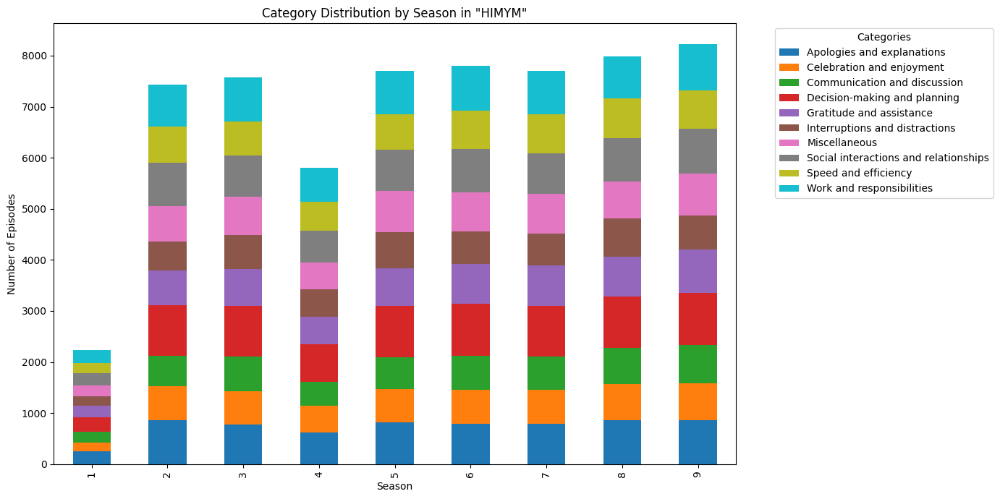

In [143]:
# Visualization of category distribution by season
data_for_visualization = office_df.explode('Top_3_Categories')
season_theme_counts = data_for_visualization.groupby(['season', 'Top_3_Categories']).size().unstack(fill_value=0)

# Plotting
season_theme_counts.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='tab10')
plt.title('Category Distribution by Season in "HIMYM"')
plt.xlabel('Season')
plt.ylabel('Number of Episodes')
plt.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [144]:
# Apply the function to identify episodes with sensitive content
office_df['Trigger_Warnings'] = office_df['Cleaned_Text'].apply(check_sensitive_content)

# Group by Season and Episode, summing the Counters directly
grouped_office_data = office_df.groupby(['season', 'episode'])['Trigger_Warnings'].agg(sum)

# Apply function to get the top three trigger warnings for each grouped data
grouped_office_data = grouped_office_data.apply(get_top_three_triggers)

# Reset index and prepare for display
final_results_office = grouped_office_data.reset_index()
final_results_office.columns = ['season', 'episode', 'Top_3_Trigger_Warnings']

# Print and view the DataFrame
print(final_results_office)

     season  episode                   Top_3_Trigger_Warnings
0         1        1    Mental Health, Emotional Abuse, Drugs
1         1        2         Drugs, Homophobia, Mental Health
2         1        3                 Death, Drugs, Body Image
3         1        4               Relationship Issues, Drugs
4         1        5                   Homophobia, Drugs, Sex
..      ...      ...                                      ...
181       9       19    Mental Health, Homophobia, Body Image
182       9       20          Drugs, Sex, Relationship Issues
183       9       21            Body Image, Death, Homophobia
184       9       22  Relationship Issues, Mental Health, Sex
185       9       23                  Pregnancy, Drugs, Death

[186 rows x 3 columns]


In [145]:
combined_office_results = pd.merge(grouped_office_results, final_results_office, on=['season', 'episode'], how='outer')

# Check the resulting DataFrame
print(combined_office_results)

     season  episode                               Top_3_Categories_Str  \
0         1        1  Miscellaneous, Work and responsibilities, Deci...   
1         1        2  Speed and efficiency, Miscellaneous, Communica...   
2         1        3  Miscellaneous, Speed and efficiency, Apologies...   
3         1        4  Work and responsibilities, Gratitude and assis...   
4         1        5  Work and responsibilities, Decision-making and...   
..      ...      ...                                                ...   
181       9       19  Apologies and explanations, Gratitude and assi...   
182       9       20  Apologies and explanations, Gratitude and assi...   
183       9       21  Social interactions and relationships, Decisio...   
184       9       22  Decision-making and planning, Speed and effici...   
185       9       23  Social interactions and relationships, Miscell...   

                      Top_3_Trigger_Warnings  
0      Mental Health, Emotional Abuse, Drugs  
1    

In [146]:
# Convert season to numeric
combined_office_results['season'] = combined_office_results['season'].astype(int)

# Convert ep to numeric
combined_office_results['episode'] = combined_office_results['episode'].astype(int)

In [147]:
for office_season_number in range(1, 10):
    office_season_data = combined_office_results[combined_office_results['season'] == office_season_number]
    office_warnings_list = office_season_data['Top_3_Trigger_Warnings'].str.split(', ')
    office_warnings_count = {}
    for office_warnings in office_warnings_list:
        for office_warning in office_warnings:
            office_warnings_count[office_warning.strip()] = office_warnings_count.get(office_warning.strip(), 0) + 1
    max_warning = max(office_warnings_count, key=office_warnings_count.get)
    max_count = office_warnings_count[max_warning]

    print(f"The most common warning in season {office_season_number} is '{max_warning}' with {max_count} occurrences.")


The most common warning in season 1 is 'Drugs' with 6 occurrences.
The most common warning in season 2 is 'Death' with 12 occurrences.
The most common warning in season 3 is 'Sex' with 11 occurrences.
The most common warning in season 4 is 'Death' with 13 occurrences.
The most common warning in season 5 is 'Death' with 13 occurrences.
The most common warning in season 6 is 'Drugs' with 13 occurrences.
The most common warning in season 7 is 'Death' with 13 occurrences.
The most common warning in season 8 is 'Sex' with 14 occurrences.
The most common warning in season 9 is 'Death' with 10 occurrences.


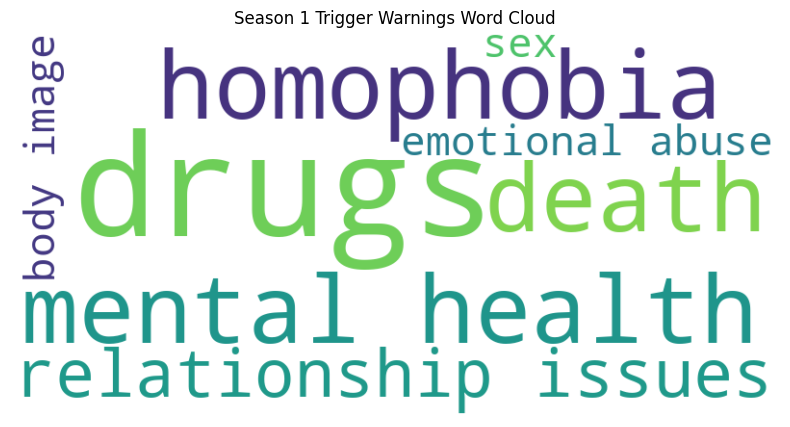

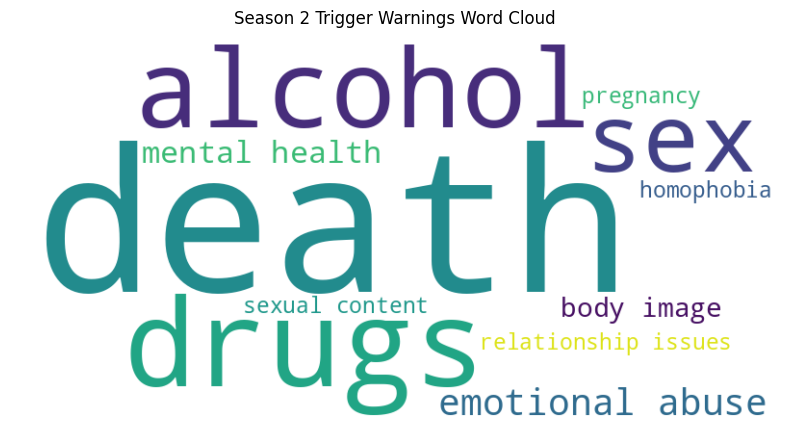

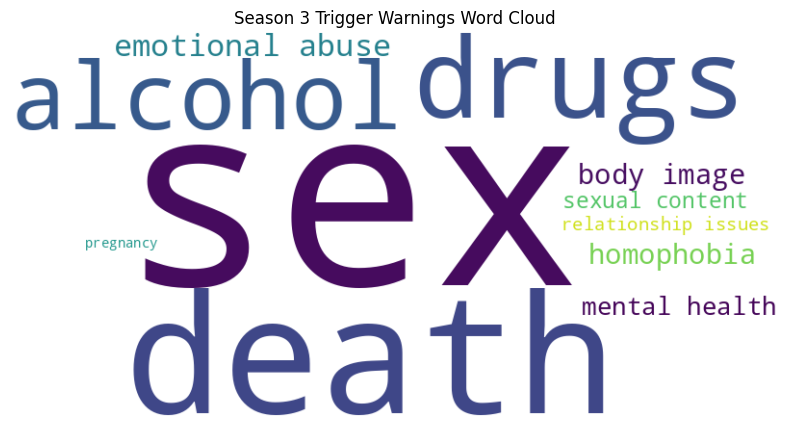

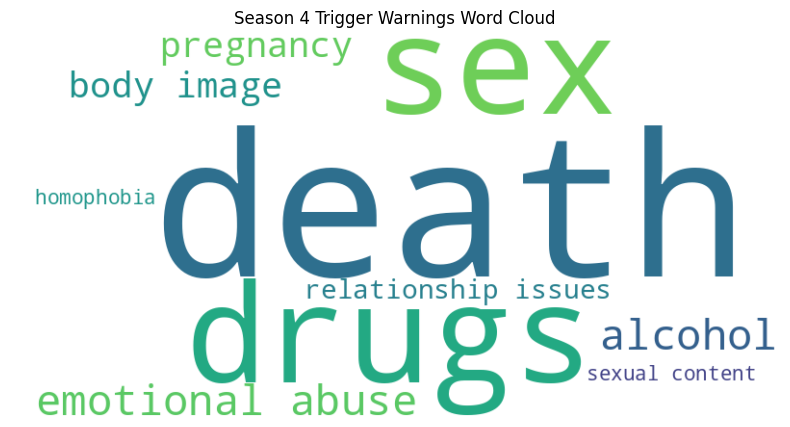

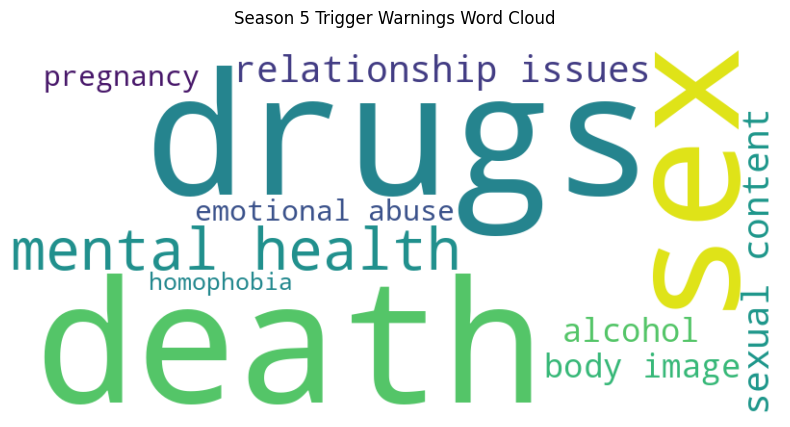

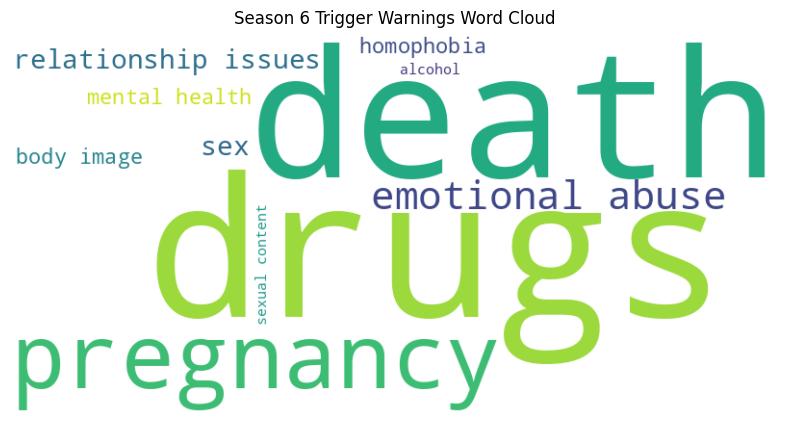

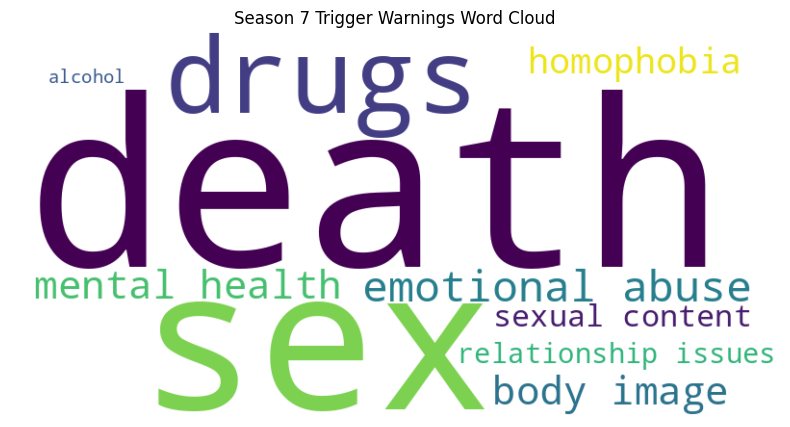

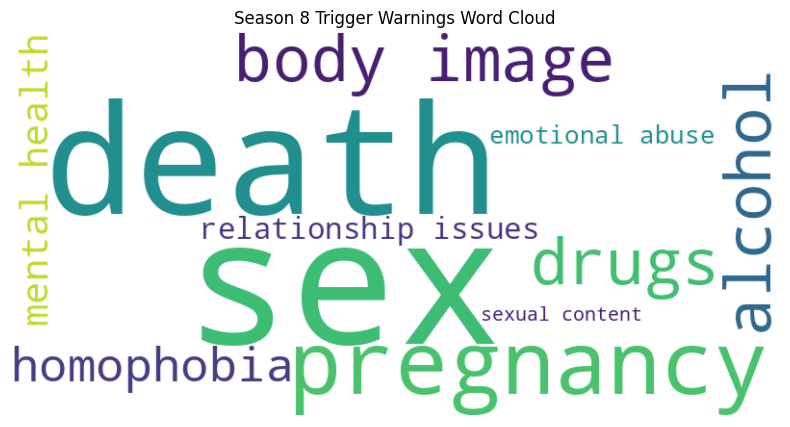

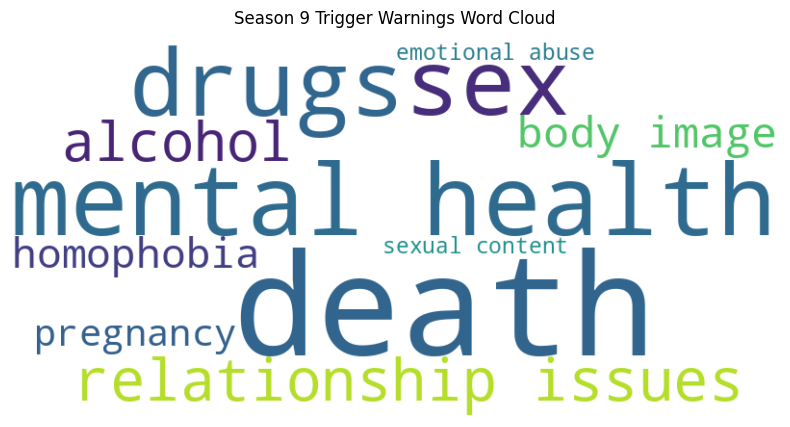

In [148]:
for office_season_number in range(1, 10):
    # Filter data for the current season
    office_season_data = combined_office_results[combined_office_results['season'] == office_season_number]

    # Flatten the list of trigger warnings for the season
    office_warnings_list = [warning.strip().lower() for sublist in office_season_data['Top_3_Trigger_Warnings'].str.split(', ') for warning in sublist]

    # Count the occurrences of each trigger warning
    office_warnings_count = Counter(office_warnings_list)

    # Generate word cloud data
    wordcloud_data = {word: count for word, count in office_warnings_count.items()}

    # Create and display the word cloud
    office_wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)

    plt.figure(figsize=(10, 5))
    plt.imshow(office_wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Season {office_season_number} Trigger Warnings Word Cloud')
    plt.show()


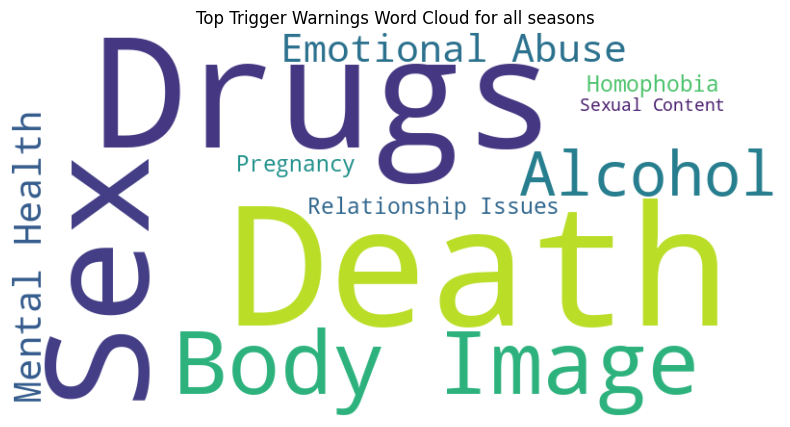

In [149]:
# Concatenate all trigger warnings from each row into a single string
all_warnings_text = ', '.join(combined_office_results['Top_3_Trigger_Warnings'])

# Split the text into words and filter out empty strings
words = [word.strip() for word in all_warnings_text.split(',') if word.strip()]

# Count the frequency of each word
word_freq = Counter(words)

# Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Top Trigger Warnings Word Cloud for all seasons')
plt.show()

In [150]:
word_freq

Counter({'Mental Health': 35,
         'Emotional Abuse': 36,
         'Drugs': 81,
         'Homophobia': 30,
         'Death': 95,
         'Body Image': 37,
         'Relationship Issues': 31,
         'Sex': 70,
         'Alcohol': 37,
         'Sexual Content': 17,
         'Pregnancy': 30})

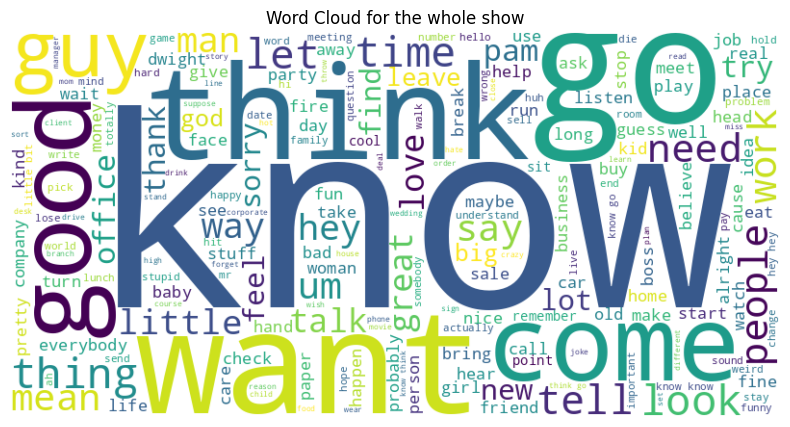

In [151]:
# Concatenate all text from each row into a single string
all_text = ' '.join(office_df['Cleaned_Text'])

# Generate word frequencies for one triggering ep
text_highlighted = ' '.join(office_df.loc[(office_df['episode'] == 12) & (office_df['season'] == 6), 'Cleaned_Text'])

# Create a word cloud, Darker word are used in S6E12
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)
wordcloud_highlighted = WordCloud(width=800, height=400, background_color ='white', color_func=lambda *args, **kwargs: "black").generate(text_highlighted)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for the whole show')
plt.show()

In [152]:
from textblob import TextBlob

# Calculate the sentiment of each line in the DataFrame
office_df['Sentiment'] = office_df['Cleaned_Text'].apply(lambda text: TextBlob(text).sentiment.polarity)

# View the sentiment scores
print(office_df[['speaker', 'line_text', 'Sentiment']].head())


    speaker                                          line_text  Sentiment
0   Michael  All right Jim. Your quarterlies look very good...   0.700000
2   Michael  So you've come to the master for guidance? Is ...   0.000000
5   Michael  [on the phone] Yes, I'd like to speak to your ...  -0.333333
6   Michael  I've, uh, I've been at Dunder Mifflin for 12 y...   0.050000
12  Michael  Oh! Pam, this is from Corporate. How many time...   0.178571


In [153]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [154]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Initialize the VADER sentiment analyzer
office_sia = SentimentIntensityAnalyzer()

# Function to get VADER scores
def get_office_vader_sentiment(text):
    return office_sia.polarity_scores(text)['compound']  # Compound score is the normalized weighted score

# Apply the function to each line in the DataFrame
office_df['VADER_Sentiment'] = office_df['line_text'].apply(get_office_vader_sentiment)

# Display the first few entries to check the VADER sentiment scores
print(office_df[['speaker', 'line_text', 'VADER_Sentiment']].head())


    speaker                                          line_text  \
0   Michael  All right Jim. Your quarterlies look very good...   
2   Michael  So you've come to the master for guidance? Is ...   
5   Michael  [on the phone] Yes, I'd like to speak to your ...   
6   Michael  I've, uh, I've been at Dunder Mifflin for 12 y...   
12  Michael  Oh! Pam, this is from Corporate. How many time...   

    VADER_Sentiment  
0            0.4927  
2            0.0000  
5            0.7987  
6            0.2225  
12           0.4574  


In [155]:
from textblob import TextBlob

# Function to calculate sentiment
def get_office_sentiment(text):
    # Create a TextBlob object
    office_blob = TextBlob(text)
    return office_blob.sentiment.polarity  # Returns the polarity of the text

# Apply the function to each line in the DataFrame
office_df['Sentiment'] = office_df['line_text'].apply(get_office_sentiment)

# Display the first few entries to check the sentiment scores
print(office_df[['speaker', 'line_text', 'Sentiment']].head())


    speaker                                          line_text  Sentiment
0   Michael  All right Jim. Your quarterlies look very good...   0.597857
2   Michael  So you've come to the master for guidance? Is ...   0.000000
5   Michael  [on the phone] Yes, I'd like to speak to your ...   0.054150
6   Michael  I've, uh, I've been at Dunder Mifflin for 12 y...   0.110491
12  Michael  Oh! Pam, this is from Corporate. How many time...   0.214286


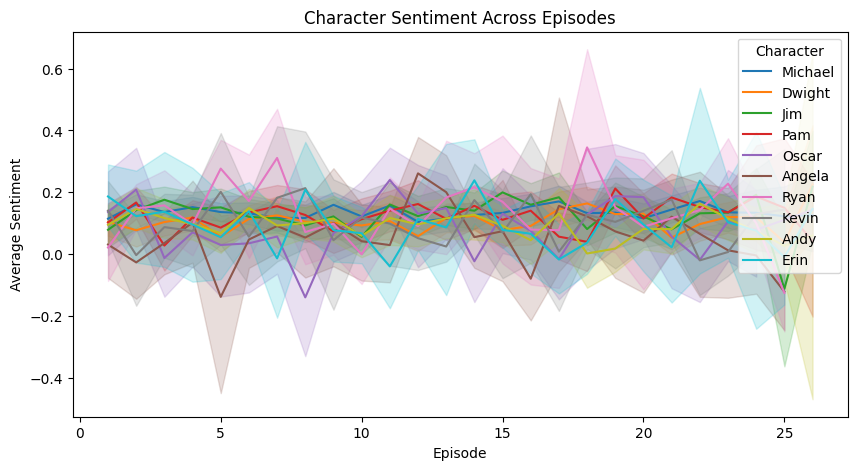

In [156]:
top_characters = office_df['speaker'].value_counts().head(10).index

# Top 10 characters
top_characters_df = office_df[office_df['speaker'].isin(top_characters)]

# Plot the sentiment scores for the top characters
plt.figure(figsize=(10, 5))
sns.lineplot(data=top_characters_df, x='episode', y='Sentiment', hue='speaker')
plt.title('Character Sentiment Across Episodes')
plt.xlabel('Episode')
plt.ylabel('Average Sentiment')
plt.legend(title='Character')
plt.show()

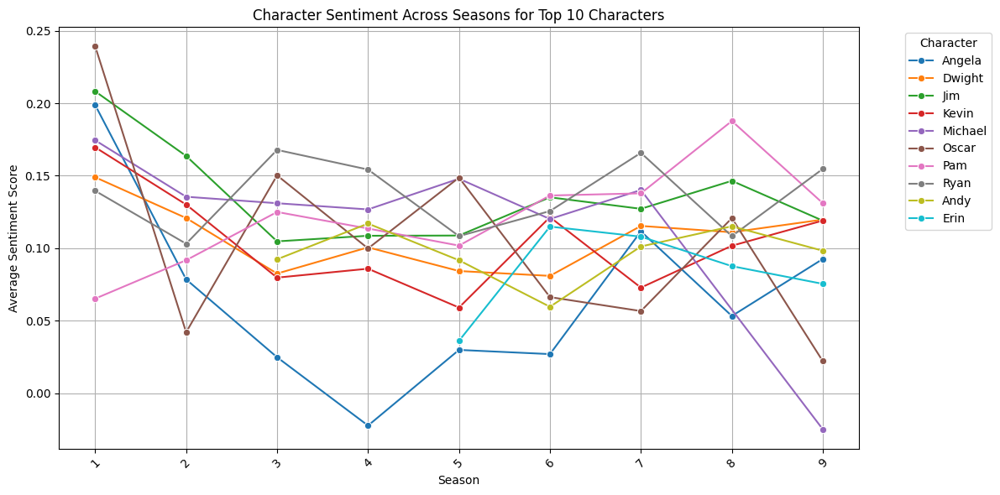

In [157]:
top_10_names = office_df['speaker'].value_counts().nlargest(10).index

# Filter the DataFrame to only include these characters
df_top_10 = office_df[office_df['speaker'].isin(top_10_names)]

# Group the data by 'season' and 'name' and calculate the mean sentiment
seasonal_sentiment = df_top_10.groupby(['season', 'speaker'])['Sentiment'].mean().reset_index()

# Example: Plotting sentiment over seasons for the top 10 characters
plt.figure(figsize=(12, 6))
sns.lineplot(data=seasonal_sentiment, x='season', y='Sentiment', hue='speaker', marker='o')
plt.title('Character Sentiment Across Seasons for Top 10 Characters')
plt.xlabel('Season')
plt.ylabel('Average Sentiment Score')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.legend(title='Character', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)  # Add grid for easier visualization
plt.tight_layout()  # Adjust layout to make room for the legend
plt.show()


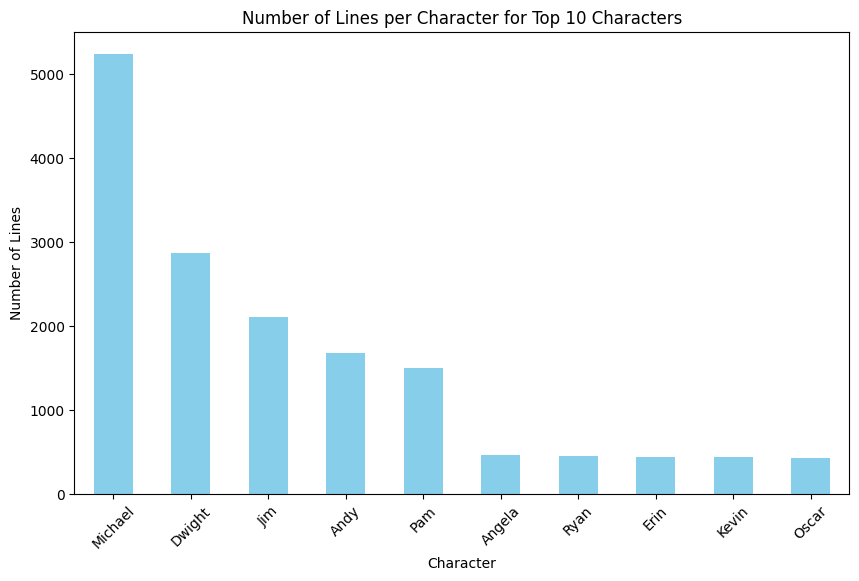

In [158]:
top_10_character_lines_count = office_df['speaker'].value_counts().head(10)

# Plotting the count of dialogues for the top 10 characters
plt.figure(figsize=(10, 6))
top_10_character_lines_count.plot(kind='bar', color='skyblue')
plt.title('Number of Lines per Character for Top 10 Characters')
plt.xlabel('Character')
plt.ylabel('Number of Lines')
plt.xticks(rotation=45)
plt.show()

<ipython-input-159-81aba9e84323>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




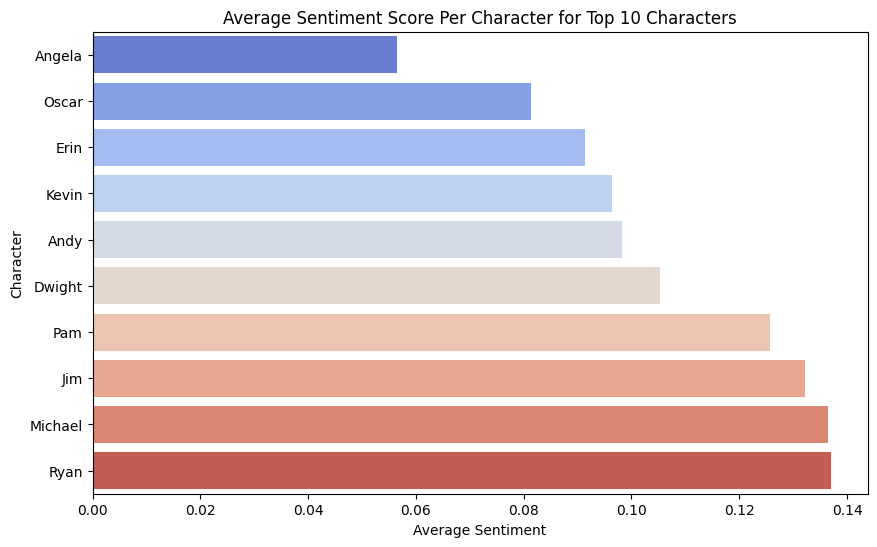

In [159]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd


# Find the top 10 characters with the most lines
top_10_names = office_df['speaker'].value_counts().nlargest(10).index

# Calculate the average sentiment for each character and filter for the top 10 characters
character_sentiment = office_df[office_df['speaker'].isin(top_10_names)].groupby('speaker')['Sentiment'].mean().sort_values()

# Plotting for the top 10 characters
plt.figure(figsize=(10, 6))
sns.barplot(x=character_sentiment.values, y=character_sentiment.index, palette='coolwarm')
plt.title('Average Sentiment Score Per Character for Top 10 Characters')
plt.xlabel('Average Sentiment')
plt.ylabel('Character')
plt.show()


In [160]:
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')

# Load the NRC sentiment lexicon
nrc = pd.read_csv('NRC.csv')

# Display the first few rows of the lexicon
sentiment_dict = {}
for index, row in nrc.iterrows():
    if row['word'] not in sentiment_dict:
        sentiment_dict[row['word']] = []
    sentiment_dict[row['word']].append(row['sentiment'])

# Function to determine sentiments
def determine_sentiments(dialog):
    tokens = word_tokenize(dialog.lower())
    sentiments = [sentiment_dict.get(token, []) for token in tokens]
    # Flatten the list of lists
    sentiment_counts = Counter([sent for sublist in sentiments for sent in sublist])
    return sentiment_counts


total_sentiments = Counter()
office_df['Sentiment_Counts'] = office_df['line_text'].apply(determine_sentiments)
for counts in office_df['Sentiment_Counts']:
    total_sentiments.update(counts)




[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


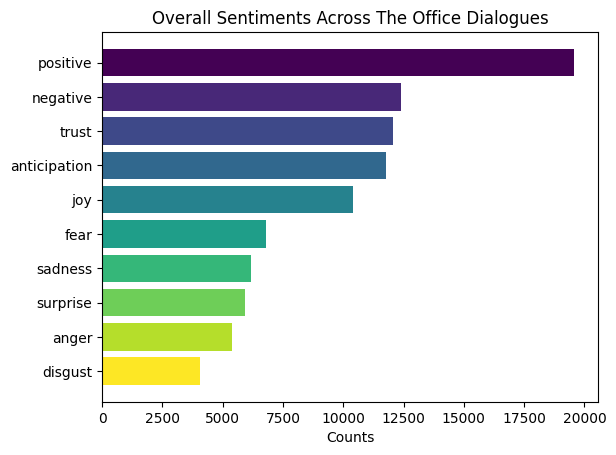

In [161]:
# Sort the sentiments by count in descending order
sentiments_sorted = {k: v for k, v in sorted(total_sentiments.items(), key=lambda item: item[1], reverse=True)}
sentiments = list(sentiments_sorted.keys())
counts = [sentiments_sorted[sent] for sent in sentiments]

# Plot the overall sentiment distribution
colors = plt.cm.viridis(np.linspace(0, 1, len(sentiments)))

# Create a horizontal bar plot
fig, ax = plt.subplots()
ax.barh(sentiments, counts, color=colors)
ax.set_xlabel('Counts')
ax.set_title('Overall Sentiments Across The Office Dialogues')
ax.invert_yaxis()  # Invert the y-axis to display the highest count at the top
plt.show()

# How I Met Your Mother Analysis

In [162]:
import pandas as pd
import numpy as np
import re
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns
import nltk
import string

In [163]:
# read dataset
df = pd.read_csv('/content/himym_full_transcripts.csv')

In [164]:
df.head()

,episode,name,line
0,4x02 - The Best Burger in New York,Barney,Goliath National Bank. The world leader in cr...
1,4x02 - The Best Burger in New York,Ted,"Okay, first of all, you look like the last pi..."
2,4x02 - The Best Burger in New York,Barney,Our company just bought them out in a ruthles...
3,4x02 - The Best Burger in New York,Lily,"Barney, Marshall didn't quit his last soul-su..."
4,4x02 - The Best Burger in New York,Ted,"So, what do you guys want to do for dinner?\n"


In [165]:
# Split data into title, ep and season, then sort it by season and ep
df['title'] = df['episode'].str[6:]
df['ep'] = df['episode'].str[2:4]
df['season'] = df['episode'].str[0]
df = df.drop(df.columns[0], axis=1)
df = df.sort_values(by=['season', 'ep'])

In [166]:
df

,name,line,title,ep,season
6962,Marshall,Will you marry me.\n,Pilot,01,1
6963,Ted,"Yes, perfect! And then you're engaged, you po...",Pilot,01,1
6964,Marshall,"Got it. Thanks for helping me plan this out, ...",Pilot,01,1
6965,Ted,"Dude, are you kidding? It's you and Lily! I'v...",Pilot,01,1
6966,Marshall,"yeah, sorry. We thought you were asleep.\n",Pilot,01,1
...,...,...,...,...,...
9826,Ted,"The pleasure is mine. And you know, you might...",Ducky Tie,03,7
9827,Robin,"Yes, yes. Where is Lenny Kravitz?\n",Ducky Tie,03,7
9828,Ted,"Right there. Leonard Kravitz, world-renowned ...",Ducky Tie,03,7
9829,Robin,"Well, great. I'll go find one myself and hang...",Ducky Tie,03,7


In [167]:
# Apply the functions to clean text
df['Cleaned_Text'] = df['line'].apply(lambda x: handle_non_verbal_cues(remove_filler_words(expand_abbreviations(x))))

In [168]:
# Load the English tokenizer, tagger, parser, NER, and word vectors
nlp = spacy.load("en_core_web_sm")

In [169]:
# Recognize the named entity. Because we focus on the emotion and triggering, the named entity should be ignored.
def remove_named_entities(text):
    doc = nlp(text)
    cleaned_text = ' '.join([token.text if token.ent_type_ == '' else '' for token in doc])
    return cleaned_text

In [170]:
# Remove the named entities from df
df['Cleaned_Text'] = df['Cleaned_Text'].apply(remove_named_entities)

In [171]:
# Normalize Text (convert to lowercase)
df['Cleaned_Text'] = df['Cleaned_Text'].str.lower()

In [172]:
df

,name,line,title,ep,season,Cleaned_Text
6962,Marshall,Will you marry me.\n,Pilot,01,1,will you marry me .
6963,Ted,"Yes, perfect! And then you're engaged, you po...",Pilot,01,1,"yes , perfect ! and then you are engaged , you..."
6964,Marshall,"Got it. Thanks for helping me plan this out, ...",Pilot,01,1,"got it . thanks for helping me plan this out , ."
6965,Ted,"Dude, are you kidding? It's you and Lily! I'v...",Pilot,01,1,"dude , are you kidding ? it is you and ! i ha..."
6966,Marshall,"yeah, sorry. We thought you were asleep.\n",Pilot,01,1,"yeah , sorry . we thought you were asleep ."
...,...,...,...,...,...,...
9826,Ted,"The pleasure is mine. And you know, you might...",Ducky Tie,03,7,"the pleasure is mine . and you know , you migh..."
9827,Robin,"Yes, yes. Where is Lenny Kravitz?\n",Ducky Tie,03,7,"yes , yes . where is ?"
9828,Ted,"Right there. Leonard Kravitz, world-renowned ...",Ducky Tie,03,7,"right there . , world - renowned architect ...."
9829,Robin,"Well, great. I'll go find one myself and hang...",Ducky Tie,03,7,"well , great . i will go find myself and hang..."


In [173]:
# Using function to define words
df['Cleaned_Text'] = df['Cleaned_Text'].apply(lambda x: clean_text(x))

In [174]:
df

,name,line,title,ep,season,Cleaned_Text
6962,Marshall,Will you marry me.\n,Pilot,01,1,marry
6963,Ted,"Yes, perfect! And then you're engaged, you po...",Pilot,01,1,yes perfect engage pop champagne drink toast s...
6964,Marshall,"Got it. Thanks for helping me plan this out, ...",Pilot,01,1,get thank help plan
6965,Ted,"Dude, are you kidding? It's you and Lily! I'v...",Pilot,01,1,dude kid big moment night meet date thing
6966,Marshall,"yeah, sorry. We thought you were asleep.\n",Pilot,01,1,yeah sorry think asleep
...,...,...,...,...,...,...
9826,Ted,"The pleasure is mine. And you know, you might...",Ducky Tie,03,7,pleasure know find interesting guy represent h...
9827,Robin,"Yes, yes. Where is Lenny Kravitz?\n",Ducky Tie,03,7,yes yes
9828,Ted,"Right there. Leonard Kravitz, world-renowned ...",Ducky Tie,03,7,right world renowne architect guy star famo...
9829,Robin,"Well, great. I'll go find one myself and hang...",Ducky Tie,03,7,great find hang


In [175]:
# Function to identify short responses
df['Is_Short_Response'] = df['Cleaned_Text'].apply(is_short_response)

In [176]:
# Filter the dataset to exclude short responses for thematic analysis
df = df[~df['Is_Short_Response']].copy()

In [177]:
df['Cleaned_Text'] = df['Cleaned_Text'].astype(str)

In [178]:
# Apply the function to remove short response words
df['Cleaned_Text'] = df['Cleaned_Text'].apply(remove_words)

In [179]:
# Exploratory Data Analysis (EDA)
# Frequency of words or phrases
word_frequency = df['Cleaned_Text'].str.split(expand=True).stack().value_counts()
word_frequency

know       1506
go         1302
want        963
think       850
guy         808
           ... 
colo          1
inhaler       1
solely        1
plump         1
ner           1
Name: count, Length: 7717, dtype: int64

In [180]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(df['Cleaned_Text'])

In [181]:
NUM_TOPICS = 10

In [182]:
# Latent Dirichlet Allocation (LDA) for Topic Modeling
lda = LatentDirichletAllocation(n_components=NUM_TOPICS, random_state=42)
df_lda = lda.fit(tfidf_matrix)

In [183]:
# Define function to print the topics and thier keyword
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += " ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()

In [184]:
# Print topics and the top 30 words
tf_feature_names = tfidf_vectorizer.get_feature_names_out()
n_top_words = 30
print_top_words(lda, tf_feature_names, n_top_words)

Topic #0: party know beer ask think come want look guy wife couple stop home whoa bring girl let car room coffee easy number god monkey man send happen woman work thing
Topic #1: want know look awesome drink happen cute guy fine think happy real child stupid run class girl new money matter great work time catch buy lily laser tag drunk book
Topic #2: help know high say school believe look need eat think rule plan want bet dude guy mean beautiful man love girl excited come way sleep cake thing change lily step
Topic #3: guy know let forget guess good thing head probably come look start think want relationship totally naked girl mean hey time sorry work try family lily dinner pretty win little
Topic #4: love know want feel thing good think god look break open tell bad sleep come great baby happen person say remember promise guy way write hurt movie sex talk lead
Topic #5: wait know god want ruin think girl wish leave suck pick good sorry bad man look live finally little tell single watch

In [185]:
# Get topic distribution for each episode
topic_distributions = lda.transform(tfidf_matrix)

In [186]:
# From the keywords, we assign those categories for topics
categories = ['Personal matters and emotions', 'Social interactions and relationships', 'Home and lifestyle', 'Appearance and behavior', 'Gratitude and appreciation', 'Leisure and entertainment', 'Self-reflection and introspection', 'Friendship and social activities', 'Family and parental relationships', 'Spirituality and beliefs']


In [187]:
# Apply the finding categories function to each episode
df['Top_3_Categories'] = [
    assign_top_three_categories(dist,categories) for dist in topic_distributions
]

# Create a clean output DataFrame
result_df = df[['season', 'ep', 'Top_3_Categories']].copy()
result_df['Top_3_Categories_Str'] = result_df['Top_3_Categories'].apply(lambda x: ', '.join(x))

# Group by Season and Episode
grouped_results = result_df.groupby(['season', 'ep']).agg({
    'Top_3_Categories_Str': 'first'  # Ensure only the first occurrence is taken if duplicates exist
}).reset_index()

# Print and view the DataFrame
print(grouped_results)

    season  ep                               Top_3_Categories_Str
0        1  01  Leisure and entertainment, Personal matters an...
1        1  02  Self-reflection and introspection, Friendship ...
2        1  03  Leisure and entertainment, Family and parental...
3        1  04  Friendship and social activities, Home and lif...
4        1  05  Spirituality and beliefs, Friendship and socia...
..     ...  ..                                                ...
128      6  23  Friendship and social activities, Spirituality...
129      6  24  Social interactions and relationships, Friends...
130      7  01  Personal matters and emotions, Family and pare...
131      7  02  Leisure and entertainment, Gratitude and appre...
132      7  03  Leisure and entertainment, Gratitude and appre...

[133 rows x 3 columns]


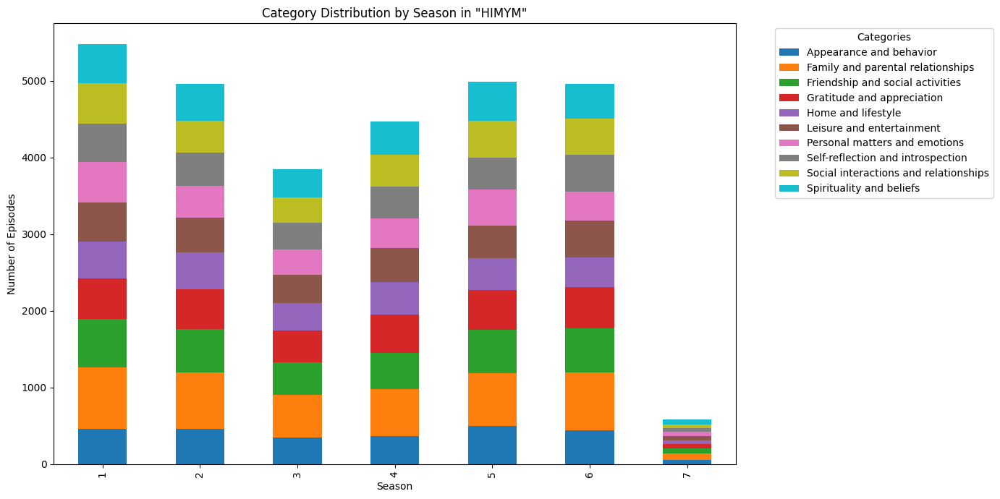

In [188]:
# Visualization of category distribution by season
data_for_visualization = df.explode('Top_3_Categories')
season_theme_counts = data_for_visualization.groupby(['season', 'Top_3_Categories']).size().unstack(fill_value=0)

# Plotting
season_theme_counts.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='tab10')
plt.title('Category Distribution by Season in "HIMYM"')
plt.xlabel('Season')
plt.ylabel('Number of Episodes')
plt.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [189]:
# Identify episodes with sensitive content
df['Trigger_Warnings'] = df['Cleaned_Text'].apply(check_sensitive_content)

# Group by Season and Episode, summing the Counters directly
grouped_data = df.groupby(['season', 'ep'])['Trigger_Warnings'].agg(sum)

# Get the top three trigger warnings for each grouped data
grouped_data = grouped_data.apply(get_top_three_triggers)

# Reset index and prepare for display
final_results = grouped_data.reset_index()
final_results.columns = ['season', 'ep', 'Top_3_Trigger_Warnings']

# Print and view the DataFrame
print(final_results)

    season  ep                          Top_3_Trigger_Warnings
0        1  01                                      Sex, Death
1        1  02                             Alcohol, Sex, Death
2        1  03                      Homophobia, Death, Alcohol
3        1  04                 Sex, Death, Relationship Issues
4        1  05                  Alcohol, Homophobia, Pregnancy
..     ...  ..                                             ...
128      6  23                 Death, Emotional Abuse, Alcohol
129      6  24  Relationship Issues, Body Image, Mental Health
130      7  01                       Alcohol, Drugs, Pregnancy
131      7  02                    Alcohol, Sex, Sexual Content
132      7  03                    Alcohol, Sex, Sexual Content

[133 rows x 3 columns]


In [190]:
combined_results_himym = pd.merge(grouped_results, final_results, on=['season', 'ep'], how='outer')

# Check the resulting DataFrame
print(combined_results_himym)

    season  ep                               Top_3_Categories_Str  \
0        1  01  Leisure and entertainment, Personal matters an...   
1        1  02  Self-reflection and introspection, Friendship ...   
2        1  03  Leisure and entertainment, Family and parental...   
3        1  04  Friendship and social activities, Home and lif...   
4        1  05  Spirituality and beliefs, Friendship and socia...   
..     ...  ..                                                ...   
128      6  23  Friendship and social activities, Spirituality...   
129      6  24  Social interactions and relationships, Friends...   
130      7  01  Personal matters and emotions, Family and pare...   
131      7  02  Leisure and entertainment, Gratitude and appre...   
132      7  03  Leisure and entertainment, Gratitude and appre...   

                             Top_3_Trigger_Warnings  
0                                        Sex, Death  
1                               Alcohol, Sex, Death  
2        

In [191]:
combined_results_himym

,season,ep,Top_3_Categories_Str,Top_3_Trigger_Warnings
0,1,01,"Leisure and entertainment, Personal matters an...","Sex, Death"
1,1,02,"Self-reflection and introspection, Friendship ...","Alcohol, Sex, Death"
2,1,03,"Leisure and entertainment, Family and parental...","Homophobia, Death, Alcohol"
3,1,04,"Friendship and social activities, Home and lif...","Sex, Death, Relationship Issues"
4,1,05,"Spirituality and beliefs, Friendship and socia...","Alcohol, Homophobia, Pregnancy"
...,...,...,...,...
128,6,23,"Friendship and social activities, Spirituality...","Death, Emotional Abuse, Alcohol"
129,6,24,"Social interactions and relationships, Friends...","Relationship Issues, Body Image, Mental Health"
130,7,01,"Personal matters and emotions, Family and pare...","Alcohol, Drugs, Pregnancy"
131,7,02,"Leisure and entertainment, Gratitude and appre...","Alcohol, Sex, Sexual Content"


In [192]:
# Convert season to numeric
combined_results_himym['season'] = combined_results_himym['season'].astype(int)

# Convert ep to numeric
combined_results_himym['ep'] = combined_results_himym['ep'].astype(int)

In [193]:
for season_number in range(1, 8):
    season_data = combined_results_himym[combined_results_himym['season'] == season_number]
    warnings_list = season_data['Top_3_Trigger_Warnings'].str.split(', ')
    warnings_count = {}
    for warnings in warnings_list:
        for warning in warnings:
            warnings_count[warning.strip()] = warnings_count.get(warning.strip(), 0) + 1
    max_warning = max(warnings_count, key=warnings_count.get)
    max_count = warnings_count[max_warning]

    print(f"The most common warning in season {season_number} is '{max_warning}' with {max_count} occurrences.")


The most common warning in season 1 is 'Sex' with 12 occurrences.
The most common warning in season 2 is 'Sex' with 11 occurrences.
The most common warning in season 3 is 'Sex' with 13 occurrences.
The most common warning in season 4 is 'Alcohol' with 13 occurrences.
The most common warning in season 5 is 'Death' with 14 occurrences.
The most common warning in season 6 is 'Death' with 13 occurrences.
The most common warning in season 7 is 'Alcohol' with 3 occurrences.


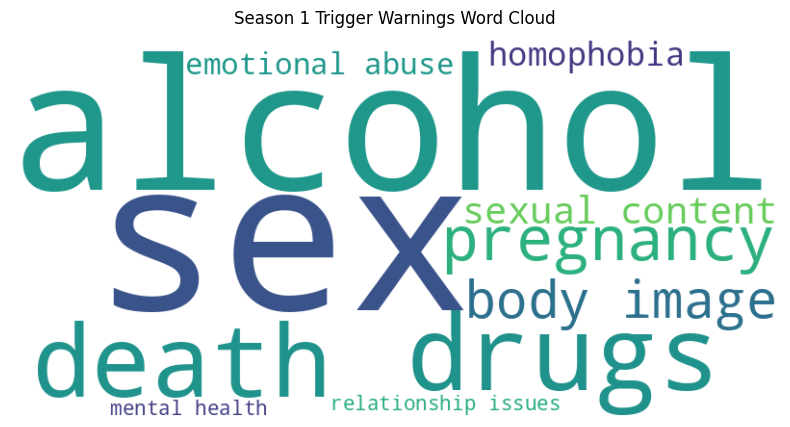

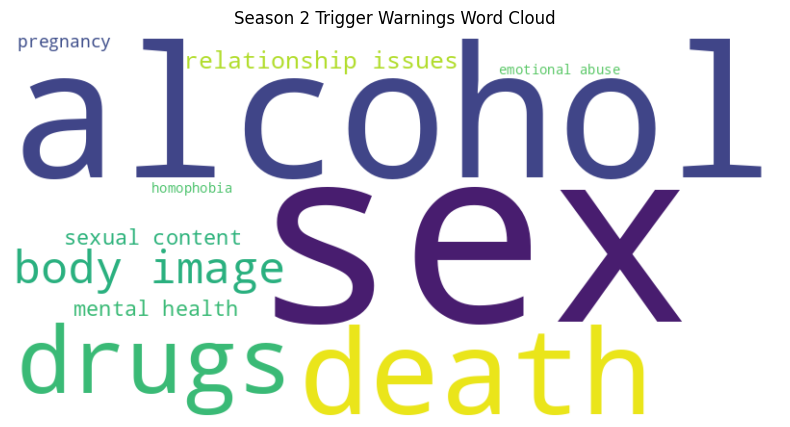

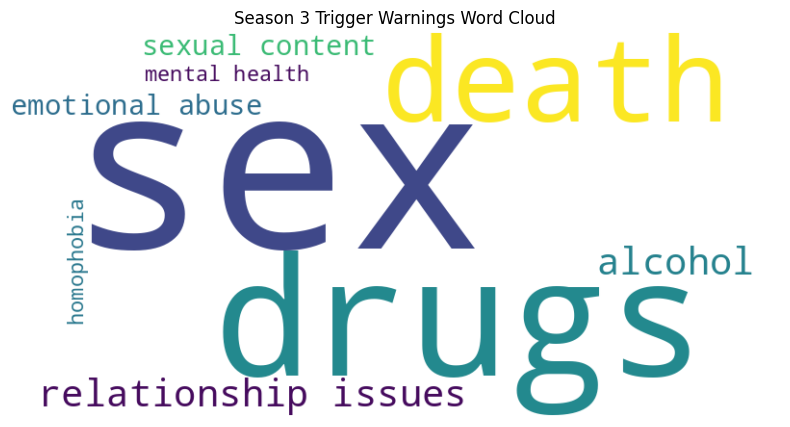

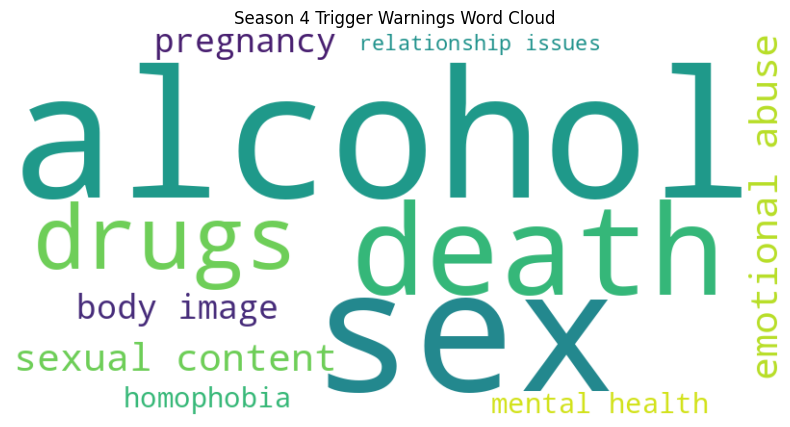

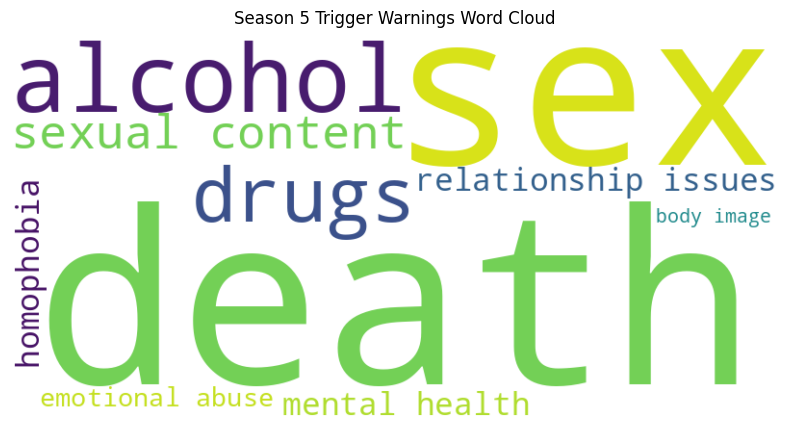

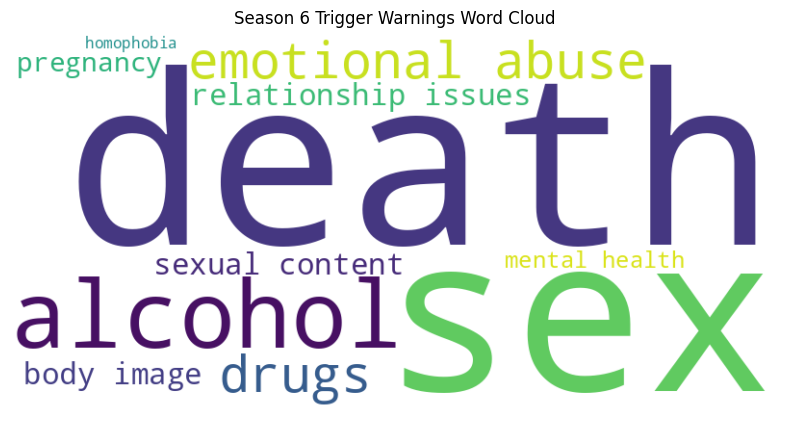

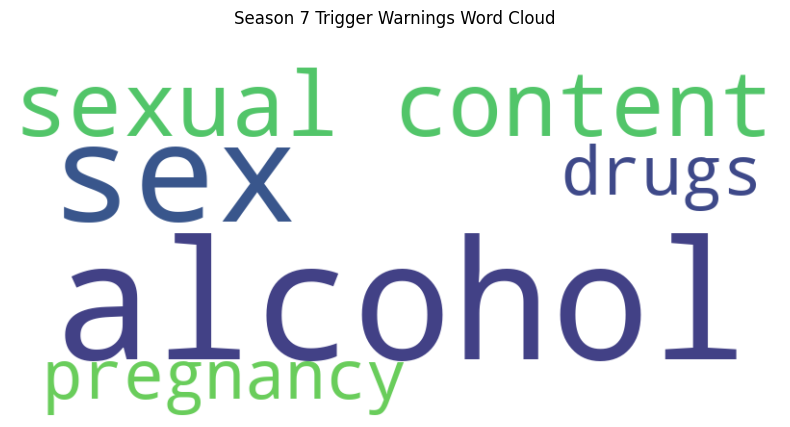

In [194]:
# WordCloud for warnings
for season_number in range(1, 8):
    # Filter data for the current season
    season_data = combined_results_himym[combined_results_himym['season'] == season_number]

    # Flatten the list of trigger warnings for the season
    warnings_list = [warning.strip().lower() for sublist in season_data['Top_3_Trigger_Warnings'].str.split(', ') for warning in sublist]

    # Count the occurrences of each trigger warning
    warnings_count = Counter(warnings_list)

    # Generate word cloud data
    wordcloud_data = {word: count for word, count in warnings_count.items()}

    # Create and display the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Season {season_number} Trigger Warnings Word Cloud')
    plt.show()


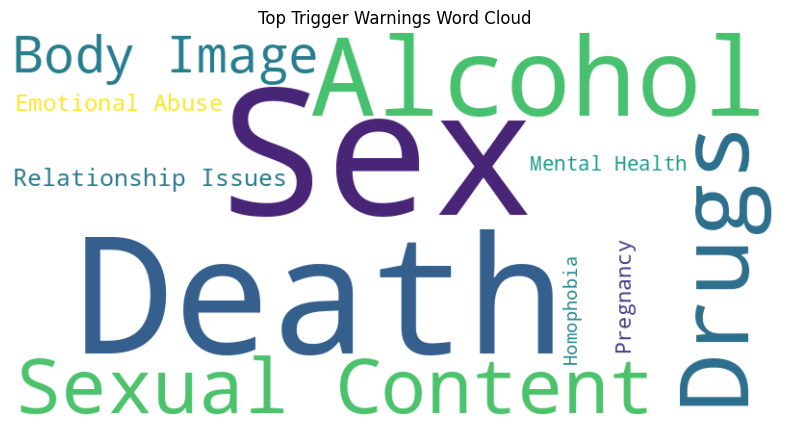

In [195]:
# Concatenate all trigger warnings from each row into a single string
all_warnings_text = ', '.join(combined_results_himym['Top_3_Trigger_Warnings'])

# Split the text into words and filter out empty strings
words = [word.strip() for word in all_warnings_text.split(',') if word.strip()]

# Count the frequency of each word
word_freq = Counter(words)

# Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Top Trigger Warnings Word Cloud')
plt.show()

In [196]:
word_freq

Counter({'Sex': 72,
         'Death': 62,
         'Alcohol': 55,
         'Homophobia': 11,
         'Relationship Issues': 18,
         'Pregnancy': 14,
         'Drugs': 42,
         'Body Image': 19,
         'Emotional Abuse': 17,
         'Sexual Content': 24,
         'Mental Health': 13})

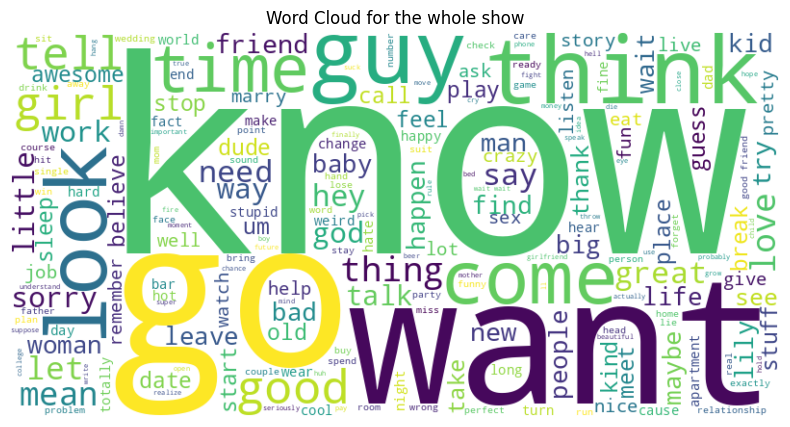

In [197]:
# Concatenate all text from each row into a single string
all_text = ' '.join(df['Cleaned_Text'])

# Generate word frequencies for S6E14
text_highlighted = ' '.join(df.loc[(df['ep'].astype(int) == 14) & (df['season'].astype(int) == 6), 'Cleaned_Text'])

# Create a word cloud, Darker word are used in S6E14
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)
wordcloud_highlighted = WordCloud(width=800, height=400, background_color ='white', color_func=lambda *args, **kwargs: "black").generate(text_highlighted)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for the whole show')
plt.show()

  name     word
0  Ted      Yes
1  Ted        ,
2  Ted  perfect
3  Ted        !
4  Ted      And
                                           Cleaned_Text Sentiment
6963   perfect engage pop champagne drink toast sex ...  positive
6964                              get thank help plan    positive
6965  dude kid   big moment   night meet   date   thing   neutral
6966                                 sorry think asleep  negative
6967  physics   bunk move bunk move god getting enga...  negative
Word Cloud for Positive Sentiment:


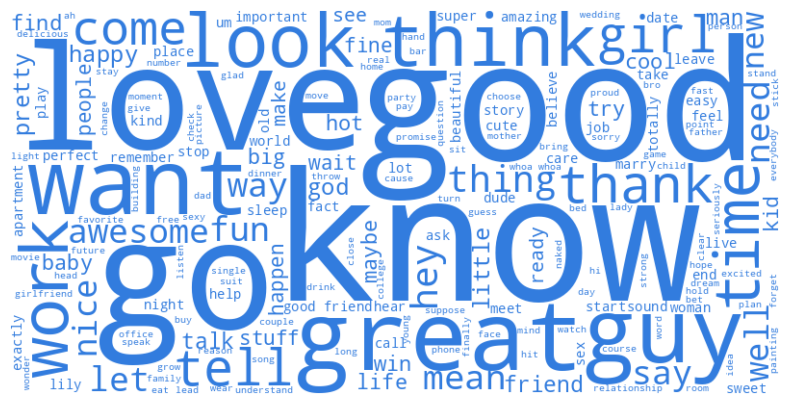

Word Cloud for Negative Sentiment:


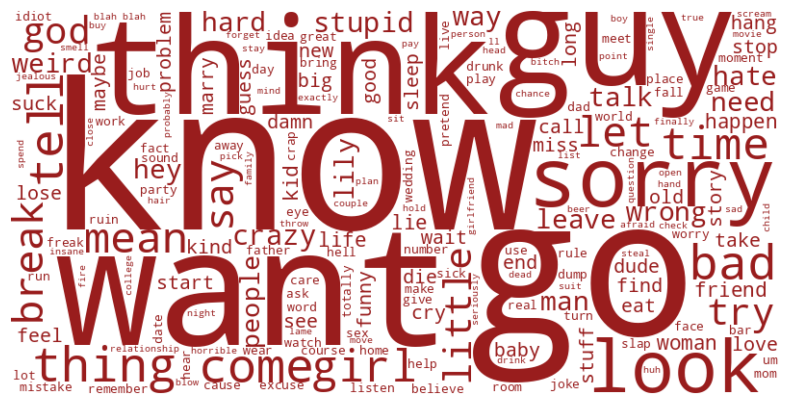

In [198]:
#bing

df['line'] = df['line'].astype(str)

# Tokenize
df['tokens'] = df.apply(lambda row: word_tokenize(row['line']), axis=1)

# Flatten the list of tokens with corresponding character names
rows = []
for _, row in df.iterrows():
    for word in row['tokens']:
        rows.append({'name': row['name'], 'word': word})

# Create a DataFrame from the list of dictionaries
tokens_df = pd.DataFrame(rows)

# Display the first 5 rows
print(tokens_df.head(5))

# WordCloud using bing
# Create a dictionary of words and their sentiment
sentiment_dict = pd.Series(bing.sentiment.values, index=bing.word).to_dict()

# Categorize each line
df['Sentiment'] = df['Cleaned_Text'].apply(lambda x: categorize_line(x, sentiment_dict))

# Preview the categorized data
print(df[['Cleaned_Text', 'Sentiment']].head())

# Aggregate words for each sentiment
positive_words = ' '.join(df[df['Sentiment'] == 'positive']['Cleaned_Text'].tolist())
negative_words = ' '.join(df[df['Sentiment'] == 'negative']['Cleaned_Text'].tolist())

# Generate and show word clouds for each sentiment
print("Word Cloud for Positive Sentiment:")
generate_wordcloud(positive_words, color='#327CDE')

print("Word Cloud for Negative Sentiment:")
generate_wordcloud(negative_words, color='#991D1D')

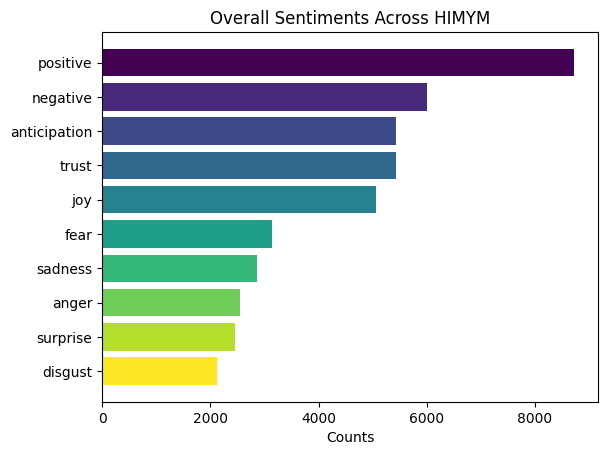

In [199]:
# NRC
# Create a sentiment dictionary where each word can have multiple sentiments
sentiment_dict = {}
for index, row in nrc.iterrows():
    if row['word'] not in sentiment_dict:
        sentiment_dict[row['word']] = []
    sentiment_dict[row['word']].append(row['sentiment'])
# Apply the function to each line and sum up all sentiment counts
total_sentiments = Counter()
df['Sentiment_Counts'] = df['line'].apply(determine_sentiments)
for counts in df['Sentiment_Counts']:
    total_sentiments.update(counts)

# Prepare data for plotting by sorting
sentiments_sorted = {k: v for k, v in sorted(total_sentiments.items(), key=lambda item: item[1], reverse=True)}
sentiments = list(sentiments_sorted.keys())
counts = [sentiments_sorted[sent] for sent in sentiments]

# Define a color for each sentiment
colors = plt.cm.viridis(np.linspace(0, 1, len(sentiments)))

# Plot the inverted bar graph with top sentiments at the top
fig, ax = plt.subplots()
ax.barh(sentiments, counts, color=colors)
ax.set_xlabel('Counts')
ax.set_title('Overall Sentiments Across HIMYM')
ax.invert_yaxis()  # Inverts the y-axis so the bar with the highest count is on top
plt.show()

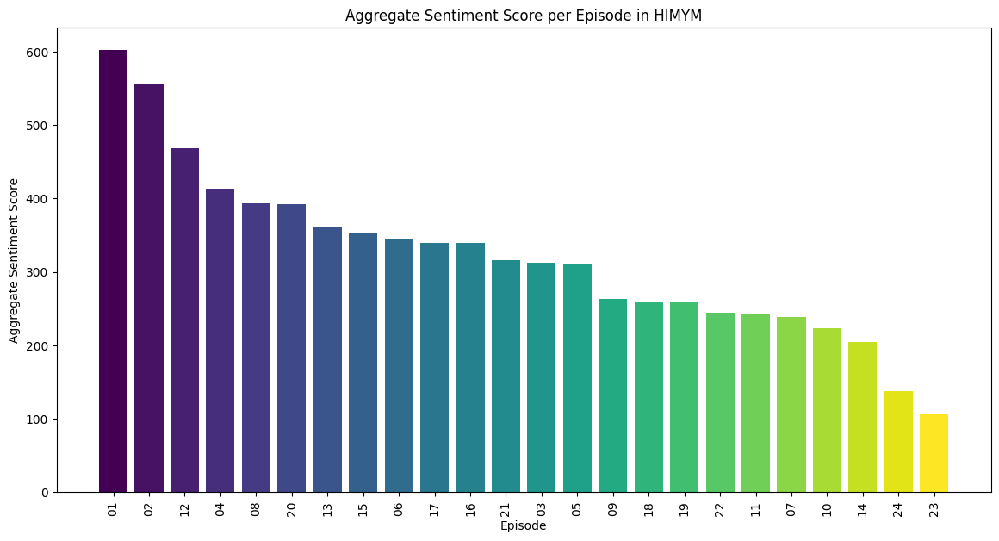

In [200]:
# AFINN
# Ensure the text is a string and tokenize it
df['tokens'] = df['line'].apply(lambda x: word_tokenize(str(x).lower()))

# Expand the DataFrame so that each token gets its row, duplicating the other columns
all_words = df.explode('tokens')
all_words.rename(columns={'tokens': 'word'}, inplace=True)

# Merge with the AFINN data
merged_data = pd.merge(all_words, afinn, on='word', how='inner')

# Aggregate sentiment scores for each dialogue
sentiment_score = merged_data.groupby('ep').agg({'value': 'sum'}).reset_index()

# Sorting values for plotting
sentiment_score_sorted = sentiment_score.sort_values('value', ascending=False)

# Plotting the sentiment distribution
fig, ax = plt.subplots(figsize=(14, 7))
colors = plt.cm.viridis(np.linspace(0, 1, len(sentiment_score_sorted)))
ax.bar(sentiment_score_sorted['ep'], sentiment_score_sorted['value'], color=colors)
ax.set_xlabel('Episode')
ax.set_ylabel('Aggregate Sentiment Score')
ax.set_title('Aggregate Sentiment Score per Episode in HIMYM')
plt.xticks(rotation=90)
plt.show()

In [201]:
from textblob import TextBlob

# Calculate the sentiment of each line in the DataFrame
df['Sentiment'] = df['Cleaned_Text'].apply(lambda text: TextBlob(text).sentiment.polarity)

# View the sentiment scores
print(df[['name', 'line', 'Sentiment']].head())


          name                                               line  Sentiment
6963       Ted   Yes, perfect! And then you're engaged, you po...        1.0
6964  Marshall   Got it. Thanks for helping me plan this out, ...        0.0
6965       Ted   Dude, are you kidding? It's you and Lily! I'v...        0.0
6966  Marshall         yeah, sorry. We thought you were asleep.\n       -0.5
6967       Ted   It's physics Marshall, if the bottom bunk mov...        0.0


In [202]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [203]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Initialize the VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Function to get VADER scores
def get_vader_sentiment(text):
    return sia.polarity_scores(text)['compound']  # Compound score is the normalized weighted score

# Apply the function to each line in the DataFrame
df['VADER_Sentiment'] = df['line'].apply(get_vader_sentiment)

# Display the first few entries to check the VADER sentiment scores
print(df[['name', 'line', 'VADER_Sentiment']].head())


          name                                               line  \
6963       Ted   Yes, perfect! And then you're engaged, you po...   
6964  Marshall   Got it. Thanks for helping me plan this out, ...   
6965       Ted   Dude, are you kidding? It's you and Lily! I'v...   
6966  Marshall         yeah, sorry. We thought you were asleep.\n   
6967       Ted   It's physics Marshall, if the bottom bunk mov...   

      VADER_Sentiment  
6963           0.9037  
6964           0.6249  
6965           0.1759  
6966           0.2263  
6967           0.6808  


In [204]:
from textblob import TextBlob

# Function to calculate sentiment
def get_sentiment(text):
    # Create a TextBlob object
    blob = TextBlob(text)
    return blob.sentiment.polarity  # Returns the polarity of the text

# Apply the function to each line in the DataFrame
df['Sentiment'] = df['line'].apply(get_sentiment)

# Display the first few entries to check the sentiment scores
print(df[['name', 'line', 'Sentiment']].head())


          name                                               line  Sentiment
6963       Ted   Yes, perfect! And then you're engaged, you po...    1.00000
6964  Marshall   Got it. Thanks for helping me plan this out, ...    0.20000
6965       Ted   Dude, are you kidding? It's you and Lily! I'v...    0.09375
6966  Marshall         yeah, sorry. We thought you were asleep.\n   -0.50000
6967       Ted   It's physics Marshall, if the bottom bunk mov...    0.50000


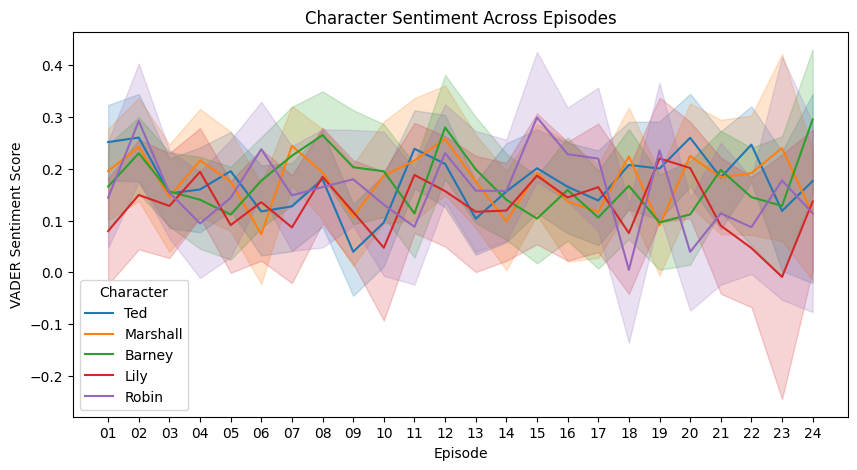

In [205]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting average sentiment per episode or character
plt.figure(figsize=(10, 5))
sns.lineplot(data=df, x='ep', y='VADER_Sentiment', hue='name')
plt.title('Character Sentiment Across Episodes')
plt.xlabel('Episode')
plt.ylabel('VADER Sentiment Score')
plt.legend(title='Character')
plt.show()


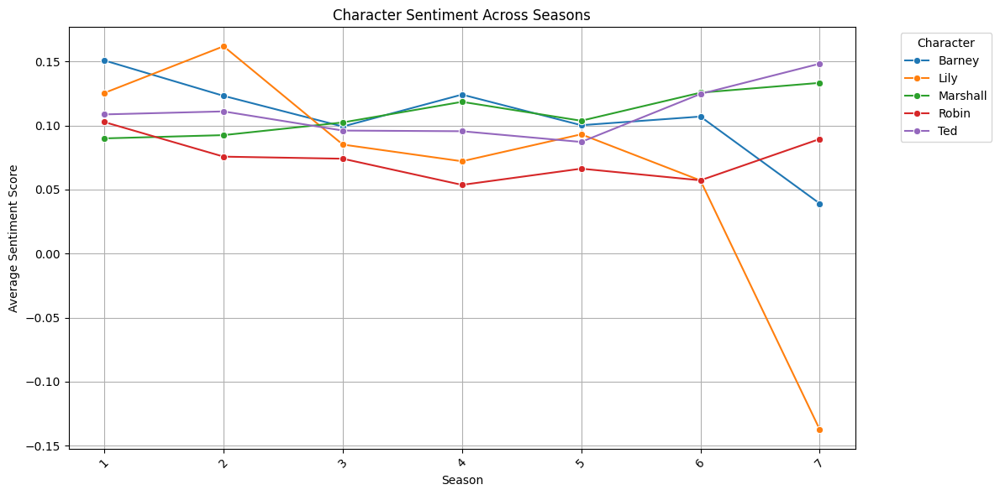

In [206]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Group the data by 'season' and 'name' and calculate the mean sentiment
seasonal_sentiment = df.groupby(['season', 'name'])['Sentiment'].mean().reset_index()

# Example: Plotting sentiment over seasons
plt.figure(figsize=(12, 6))
sns.lineplot(data=seasonal_sentiment, x='season', y='Sentiment', hue='name', marker='o')
plt.title('Character Sentiment Across Seasons')
plt.xlabel('Season')
plt.ylabel('Average Sentiment Score')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.legend(title='Character', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)  # Add grid for easier visualization
plt.tight_layout()  # Adjust layout to make room for the legend
plt.show()


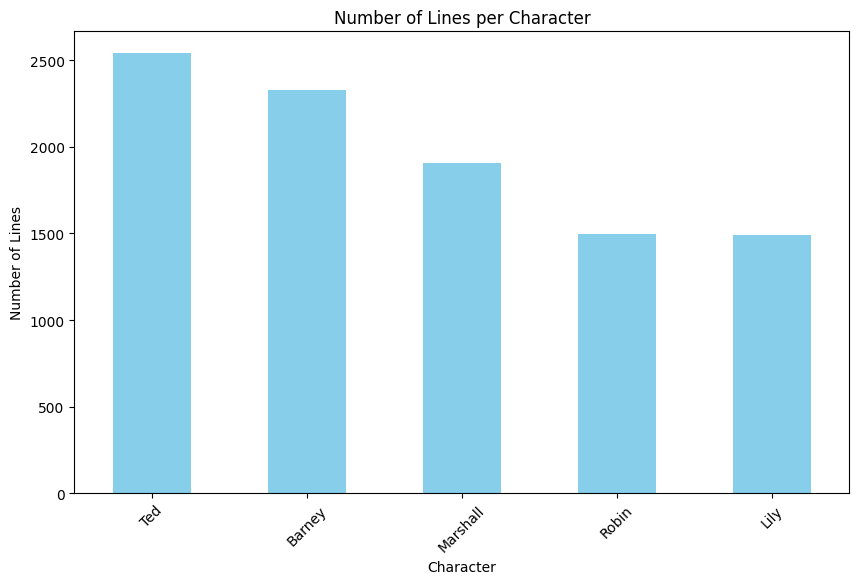

In [207]:
import matplotlib.pyplot as plt

# Count the number of lines each character has
character_lines_count = df['name'].value_counts()

# Plotting the count of dialogues per character
plt.figure(figsize=(10, 6))
character_lines_count.plot(kind='bar', color='skyblue')
plt.title('Number of Lines per Character')
plt.xlabel('Character')
plt.ylabel('Number of Lines')
plt.xticks(rotation=45)
plt.show()


<ipython-input-208-e913ec83338c>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




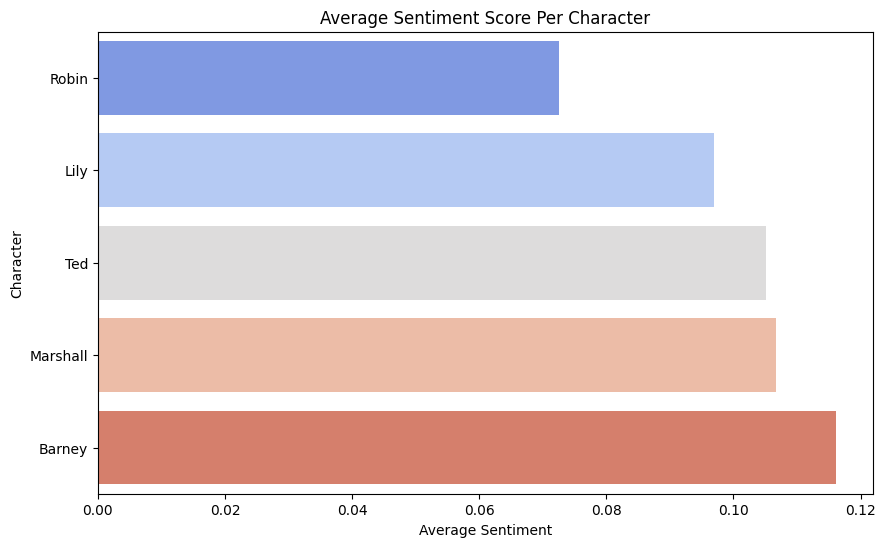

In [208]:
# Sentiment Analysis
character_sentiment = df.groupby('name')['Sentiment'].mean().sort_values()

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x=character_sentiment.values, y=character_sentiment.index, palette='coolwarm')
plt.title('Average Sentiment Score Per Character')
plt.xlabel('Average Sentiment')
plt.ylabel('Character')
plt.show()


In [209]:
from sklearn.feature_extraction.text import CountVectorizer

# Let's consider analyzing the top 5 most common words used by each character
vectorizer = CountVectorizer(stop_words='english', max_features=5)

# Filtering the DataFrame for one character as an example
ted_lines = df[df['name'] == 'Ted']['Cleaned_Text']

# Applying the vectorizer
ted_words = vectorizer.fit_transform(ted_lines)
sum_words = ted_words.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)

# Display
print("Top words for Ted:", words_freq)


Top words for Ted: [('know', 389), ('think', 268), ('want', 263), ('look', 234), ('guy', 221)]


# The Big Bang Theory Analysis

In [210]:
import pandas as pd
import numpy as np
import re
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns

In [211]:
# Load the dataset
file_path = 'tbbt_new.csv'
df = pd.read_csv(file_path)

In [212]:
df

,Text,Speaker,Episode,Season,Show
0,A corridor at a sperm bank.,Scene,Episode-1-Pilot Episode,Season-1,TBBT
1,So if a photon is directed through a plane wi...,Sheldon,Episode-1-Pilot Episode,Season-1,TBBT
2,"Agreed, what’s your point?",Leonard,Episode-1-Pilot Episode,Season-1,TBBT
3,"There’s no point, I just think it’s a good id...",Sheldon,Episode-1-Pilot Episode,Season-1,TBBT
4,Excuse me?,Leonard,Episode-1-Pilot Episode,Season-1,TBBT
...,...,...,...,...,...
54401,"And I with you. Question, are you seeking a r...",Sheldon,Episode-24-The Long Distance Dissonance,Season-10,TBBT
54402,What if I were?,Ramona,Episode-24-The Long Distance Dissonance,Season-10,TBBT
54403,"Well, that would raise a number of problems. ...",Sheldon,Episode-24-The Long Distance Dissonance,Season-10,TBBT
54404,Princeton.,Scene,Episode-24-The Long Distance Dissonance,Season-10,TBBT


In [213]:
# Apply the function to the Episode column
df['Simple_Episode'] = df['Episode'].apply(extract_simple_episode)

# Display the updated DataFrame to verify the new column
print(df[['Text', 'Episode', 'Simple_Episode']])

                                                    Text  \
0                            A corridor at a sperm bank.   
1       So if a photon is directed through a plane wi...   
2                             Agreed, what’s your point?   
3       There’s no point, I just think it’s a good id...   
4                                             Excuse me?   
...                                                  ...   
54401   And I with you. Question, are you seeking a r...   
54402                                    What if I were?   
54403   Well, that would raise a number of problems. ...   
54404                                        Princeton.    
54405   (Knock, knock, knock) Amy. (Knock, knock, kno...   

                                       Episode Simple_Episode  
0                      Episode-1-Pilot Episode      Episode-1  
1                      Episode-1-Pilot Episode      Episode-1  
2                      Episode-1-Pilot Episode      Episode-1  
3                      

In [214]:
#Extract episode numbers
df['Episode'] = df['Episode'].str.extract(r'(\d+)').astype(int)

In [215]:
#Extract season numbers
df['Season'] = df['Season'].str.extract(r'(\d+)').astype(int)

In [216]:
df

,Text,Speaker,Episode,Season,Show,Simple_Episode
0,A corridor at a sperm bank.,Scene,1,1,TBBT,Episode-1
1,So if a photon is directed through a plane wi...,Sheldon,1,1,TBBT,Episode-1
2,"Agreed, what’s your point?",Leonard,1,1,TBBT,Episode-1
3,"There’s no point, I just think it’s a good id...",Sheldon,1,1,TBBT,Episode-1
4,Excuse me?,Leonard,1,1,TBBT,Episode-1
...,...,...,...,...,...,...
54401,"And I with you. Question, are you seeking a r...",Sheldon,24,10,TBBT,Episode-24
54402,What if I were?,Ramona,24,10,TBBT,Episode-24
54403,"Well, that would raise a number of problems. ...",Sheldon,24,10,TBBT,Episode-24
54404,Princeton.,Scene,24,10,TBBT,Episode-24


In [217]:
import re
def remove_non_alphabetic(text):
    if isinstance(text, str):  # Check if the input is already a string
        return str(text)
    else:  # Convert non-string input to string and then apply the operation
        return re.sub('[^a-zA-Z\s.,;!?]', ' ', str(text))

# Apply the function to each element of the 'Text' column
df['Text'] = df['Text'].apply(remove_non_alphabetic)

In [218]:
# The ' is wrong
df['Cleaned_Text'] = df['Text'].apply(lambda x: x.replace("’", "'"))

In [219]:
df

,Text,Speaker,Episode,Season,Show,Simple_Episode,Cleaned_Text
0,A corridor at a sperm bank.,Scene,1,1,TBBT,Episode-1,A corridor at a sperm bank.
1,So if a photon is directed through a plane wi...,Sheldon,1,1,TBBT,Episode-1,So if a photon is directed through a plane wi...
2,"Agreed, what’s your point?",Leonard,1,1,TBBT,Episode-1,"Agreed, what's your point?"
3,"There’s no point, I just think it’s a good id...",Sheldon,1,1,TBBT,Episode-1,"There's no point, I just think it's a good id..."
4,Excuse me?,Leonard,1,1,TBBT,Episode-1,Excuse me?
...,...,...,...,...,...,...,...
54401,"And I with you. Question, are you seeking a r...",Sheldon,24,10,TBBT,Episode-24,"And I with you. Question, are you seeking a r..."
54402,What if I were?,Ramona,24,10,TBBT,Episode-24,What if I were?
54403,"Well, that would raise a number of problems. ...",Sheldon,24,10,TBBT,Episode-24,"Well, that would raise a number of problems. ..."
54404,Princeton.,Scene,24,10,TBBT,Episode-24,Princeton.


In [220]:
# Apply the functions to clean text
df['Cleaned_Text'] = df['Cleaned_Text'].apply(lambda x: handle_non_verbal_cues(remove_filler_words(expand_abbreviations(x))))
df['Cleaned_Text'] = df['Cleaned_Text'].apply(remove_named_entities)
df['Cleaned_Text'] = df['Cleaned_Text'].str.lower()
df['Cleaned_Text'] = df['Cleaned_Text'].apply(lambda x: clean_text(x))
df['Cleaned_Text'] = df['Cleaned_Text'].apply(remove_words)
df['Is_Short_Response'] = df['Cleaned_Text'].apply(is_short_response)
df = df[~df['Is_Short_Response']].copy()
df['Cleaned_Text'] = df['Cleaned_Text'].astype(str)

   Speaker    word
0  Sheldon      So
1  Sheldon      if
2  Sheldon       a
3  Sheldon  photon
4  Sheldon      is
                                         Cleaned_Text Sentiment
1   photon direct plane   slit slit observe slit u...  negative
3                     point think good idea tee shirt  positive
6                   … finger … phylum make        ...   neutral
8                               um high iq sperm bank   neutral
13                 time finish crossword puzzle  wait   neutral
Word Cloud for Positive Sentiment:


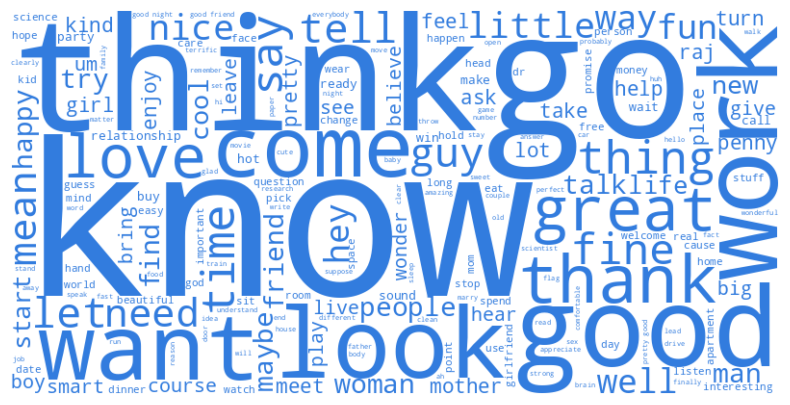

Word Cloud for Negative Sentiment:


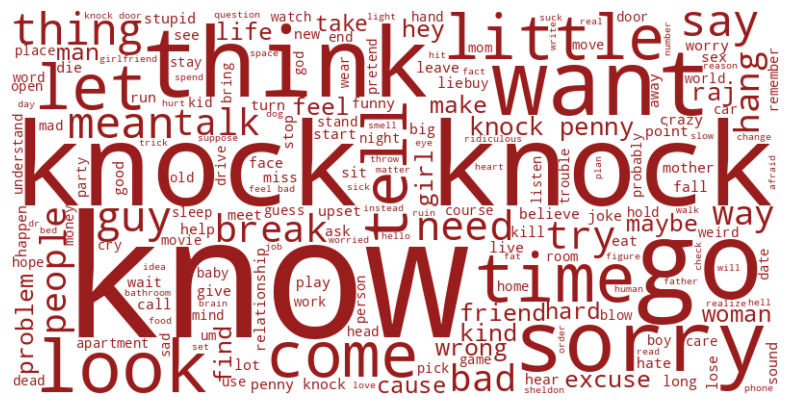

In [221]:
#bing
# Ensure 'Text' is in string format
df['Text'] = df['Text'].astype(str)

# Tokenize the 'Text’ column
df['tokens'] = df.apply(lambda row: word_tokenize(row['Text']), axis=1)

# Flatten the list of tokens with corresponding character names
rows = []
for _, row in df.iterrows():
    for word in row['tokens']:
        rows.append({'Speaker': row['Speaker'], 'word': word})

# Create a DataFrame from the list of dictionaries
tokens_df = pd.DataFrame(rows)

# Display the first 5 rows
print(tokens_df.head(5))

# WordCloud using bing
# Create a dictionary of words and their sentiment
sentiment_dict = pd.Series(bing.sentiment.values, index=bing.word).to_dict()

# Categorize each line
df['Sentiment'] = df['Cleaned_Text'].apply(lambda x: categorize_line(x, sentiment_dict))

# Preview the categorized data
print(df[['Cleaned_Text', 'Sentiment']].head())

# Aggregate words for each sentiment
positive_words = ' '.join(df[df['Sentiment'] == 'positive']['Cleaned_Text'].tolist())
negative_words = ' '.join(df[df['Sentiment'] == 'negative']['Cleaned_Text'].tolist())

# Generate and show word clouds for each sentiment
print("Word Cloud for Positive Sentiment:")
generate_wordcloud(positive_words, color='#327CDE')

print("Word Cloud for Negative Sentiment:")
generate_wordcloud(negative_words, color='#991D1D')

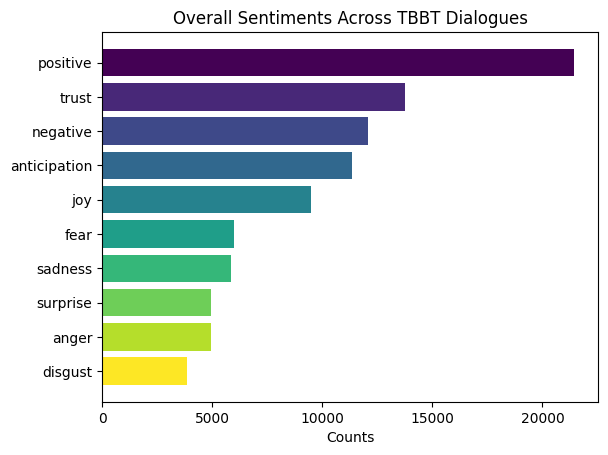

In [222]:
# NRC
# Create a sentiment dictionary where each word can have multiple sentiments
sentiment_dict = {}
for index, row in nrc.iterrows():
    if row['word'] not in sentiment_dict:
        sentiment_dict[row['word']] = []
    sentiment_dict[row['word']].append(row['sentiment'])
# Apply the function to each ’line’ and sum up all sentiment counts
total_sentiments = Counter()
df['Sentiment_Counts'] = df['Text'].apply(determine_sentiments)
for counts in df['Sentiment_Counts']:
    total_sentiments.update(counts)

# Prepare data for plotting by sorting
sentiments_sorted = {k: v for k, v in sorted(total_sentiments.items(), key=lambda item: item[1], reverse=True)}
sentiments = list(sentiments_sorted.keys())
counts = [sentiments_sorted[sent] for sent in sentiments]

# Define a color for each sentiment
colors = plt.cm.viridis(np.linspace(0, 1, len(sentiments)))

# Plot the inverted bar graph with top sentiments at the top
fig, ax = plt.subplots()
ax.barh(sentiments, counts, color=colors)
ax.set_xlabel('Counts')
ax.set_title('Overall Sentiments Across TBBT Dialogues')
ax.invert_yaxis()  # Inverts the y-axis so the bar with the highest count is on top
plt.show()

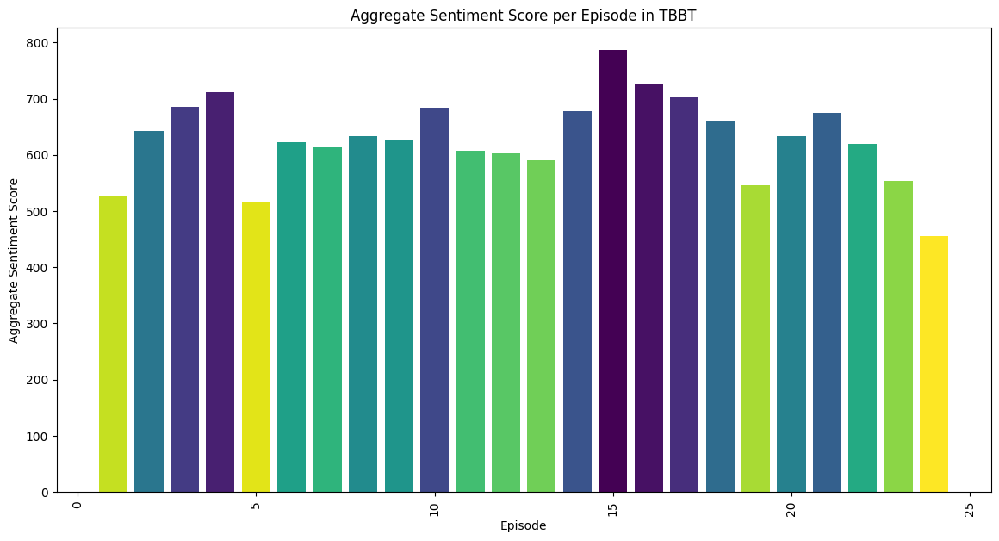

In [223]:
# AFINN
# Ensure the text is a string and tokenize it
df['tokens'] = df['Text'].apply(lambda x: word_tokenize(str(x).lower()))

# Expand the DataFrame so that each token gets its row, duplicating the other columns
all_words = df.explode('tokens')
all_words.rename(columns={'tokens': 'word'}, inplace=True)

# Merge with the AFINN data
merged_data = pd.merge(all_words, afinn, on='word', how='inner')

# Aggregate sentiment scores for each dialogue
sentiment_score = merged_data.groupby('Episode').agg({'value': 'sum'}).reset_index()

# Sorting values for plotting
sentiment_score_sorted = sentiment_score.sort_values('value', ascending=False)

# Plotting the sentiment distribution
fig, ax = plt.subplots(figsize=(14, 7))
colors = plt.cm.viridis(np.linspace(0, 1, len(sentiment_score_sorted)))
ax.bar(sentiment_score_sorted['Episode'], sentiment_score_sorted['value'], color=colors)
ax.set_xlabel('Episode')
ax.set_ylabel('Aggregate Sentiment Score')
ax.set_title('Aggregate Sentiment Score per Episode in TBBT')
plt.xticks(rotation=90)
plt.show()


In [224]:
# Exploratory Data Analysis (EDA)
# Frequency of words or phrases
word_frequency = df['Cleaned_Text'].str.split(expand=True).stack().value_counts()
word_frequency

know           2994
go             2280
think          1704
want           1565
get            1452
               ... 
barnard           1
maga              1
krav              1
plausibly         1
gallbladder       1
Name: count, Length: 13098, dtype: int64

In [225]:
# Categorization

In [226]:
# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(df['Cleaned_Text'])

In [227]:
# Latent Dirichlet Allocation (LDA) for Topic Modeling
n_components = 10
lda = LatentDirichletAllocation(n_components=n_components, random_state=42)
lda.fit(tfidf_matrix)

LatentDirichletAllocation(random_state=42)

In [228]:
# Print topics and the top 30 words
tf_feature_names = tfidf_vectorizer.get_feature_names_out()
n_top_words = 30
print_top_words(lda, tf_feature_names, n_top_words)

Topic #0: know look game think want thing hot play agreement roommate cute good number come relationship mean let great little upset say friend sorry video couple work people need girl time
Topic #1: know wait come look think hey little let tell try break guy time need good question want sorry say sex mean answer lie home hi man science ask ring aw
Topic #2: comic book store know time want think tell baby work good look stop come wait make guy long funny let office marry figure man space sheldon hey friend pick talk
Topic #3: know think come time flag look whoa want little dr ready sense fast ah plan entire good mean tell make need ha hey hear beat lunch leave order talk buddy
Topic #4: know want think come care happen thing friend live look weird let date good guy woman tell time house sit hey mean happy meet dinner mind reason star people play
Topic #5: know let think gift say little exactly want bit tell business come win time need friend favour fun help guy beer um relationship wor

In [229]:
# From the keywords, we assign those categories for topics
categories = [
    'Social Interactions and Relationships',
    'Communication and Interactions',
    'Hobbies and Entertainment',
    'Planning and Organization',
    'Personal Life and Relationships',
    'Generosity and Assistance',
    'Emotional Expression and Support',
    'Social Events and Activities',
    'Lifestyle and Expression',
    'Greetings and Events'
]

In [230]:
# Get topic distribution for each episode
topic_distributions = lda.transform(tfidf_matrix)

In [231]:
# Apply the function to each episode
df['Top_3_Categories'] = [
    assign_top_three_categories(dist,categories) for dist in topic_distributions
]

# Create a clean output DataFrame
result_df = df[['Season', 'Episode', 'Top_3_Categories']].copy()
result_df['Top_3_Categories_Str'] = result_df['Top_3_Categories'].apply(lambda x: ', '.join(x))

# Group by Season and Episode
grouped_results = result_df.groupby(['Season', 'Episode']).agg({
    'Top_3_Categories_Str': 'first'  # Ensure only the first occurrence is taken if duplicates exist
}).reset_index()

# Print and view the DataFrame
print(grouped_results)

     Season  Episode                               Top_3_Categories_Str
0         1        1  Communication and Interactions, Generosity and...
1         1        2  Social Events and Activities, Lifestyle and Ex...
2         1        3  Emotional Expression and Support, Social Event...
3         1        4  Social Interactions and Relationships, Plannin...
4         1        5  Planning and Organization, Greetings and Event...
..      ...      ...                                                ...
226      10       20  Hobbies and Entertainment, Social Events and A...
227      10       21  Social Interactions and Relationships, Persona...
228      10       22  Personal Life and Relationships, Generosity an...
229      10       23  Lifestyle and Expression, Social Events and Ac...
230      10       24  Generosity and Assistance, Social Interactions...

[231 rows x 3 columns]


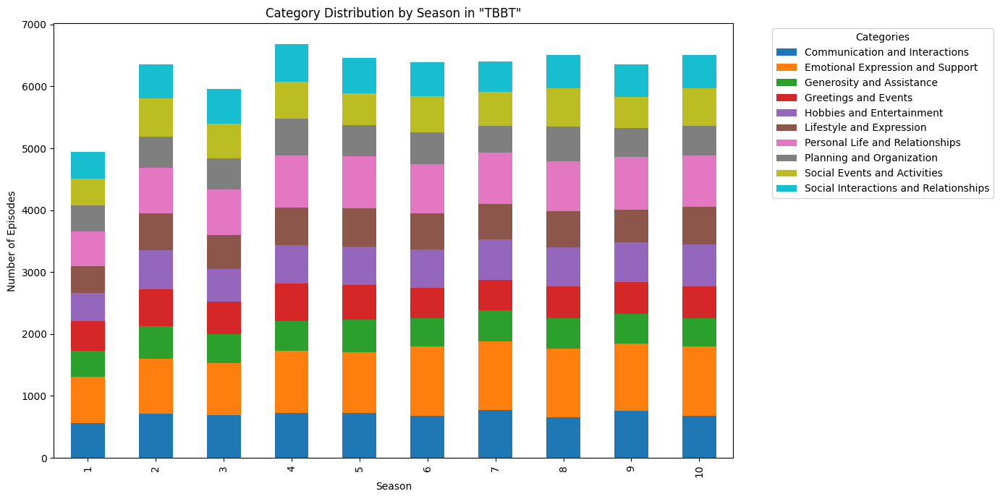

In [232]:
# Visualization of category distribution by season
data_for_visualization = df.explode('Top_3_Categories')
season_theme_counts = data_for_visualization.groupby(['Season', 'Top_3_Categories']).size().unstack(fill_value=0)

# Plotting
season_theme_counts.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='tab10')
plt.title('Category Distribution by Season in "TBBT"')
plt.xlabel('Season')
plt.ylabel('Number of Episodes')
plt.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [233]:
# Apply sentiment analysis to cleaned text
df['Sentiment'] = df['Cleaned_Text'].apply(get_sentiment)
df['Sentiment']

1        0.100
3        0.700
6        0.000
8        0.160
13       0.000
         ...  
54397    0.000
54400    0.200
54401    0.000
54403   -0.025
54405    0.000
Name: Sentiment, Length: 20854, dtype: float64

In [234]:
#Categorize sentiment scores into 'Positive', 'Neutral', and 'Negative'
df['Sentiment_Category'] = pd.cut(df['Sentiment'], bins=[-1, -0.01, 0.01, 1], labels=['Negative', 'Neutral', 'Positive'])

In [235]:
# Apply the function to identify episodes with sensitive content
df['Trigger_Warnings'] = df['Cleaned_Text'].apply(check_sensitive_content)

# Group by Season and Episode, summing the Counters directly
grouped_data = df.groupby(['Season', 'Episode'])['Trigger_Warnings'].agg(sum)

# Apply function to get the top three trigger warnings for each grouped data
grouped_data = grouped_data.apply(get_top_three_triggers)

# Reset index and prepare for display
final_results_tbbt = grouped_data.reset_index()
final_results_tbbt.columns = ['Season', 'Episode', 'Top_3_Trigger_Warnings']

# Print and view the DataFrame
print(final_results_tbbt)
combined_results_tbbt = pd.merge(grouped_results, final_results_tbbt, on=['Season', 'Episode'], how='outer')

     Season  Episode                Top_3_Trigger_Warnings
0         1        1       Drugs, Sex, Relationship Issues
1         1        2                     Death, Sex, Drugs
2         1        3  Sex, Emotional Abuse, Sexual Content
3         1        4     Death, Drugs, Relationship Issues
4         1        5                     Sex, Drugs, Death
..      ...      ...                                   ...
226      10       20               Pregnancy, Drugs, Death
227      10       21                                      
228      10       22              Sex, Alcohol, Body Image
229      10       23                Sex, Drugs, Body Image
230      10       24                            Sex, Death

[231 rows x 3 columns]


In [236]:
# Convert season to numeric
combined_results_tbbt['Season'] = combined_results_tbbt['Season'].astype(int)

# Convert ep to numeric
combined_results_tbbt['Episode'] = combined_results_tbbt['Episode'].astype(int)
for season_number in range(1, 11):
    season_data = combined_results_tbbt[combined_results_tbbt['Season'] == season_number]
    warnings_list = season_data['Top_3_Trigger_Warnings'].str.split(', ')
    warnings_count = {}
    for warnings in warnings_list:
        for warning in warnings:
            warnings_count[warning.strip()] = warnings_count.get(warning.strip(), 0) + 1
    max_warning = max(warnings_count, key=warnings_count.get)
    max_count = warnings_count[max_warning]

    print(f"The most common warning in season {season_number} is '{max_warning}' with {max_count} occurrences.")


The most common warning in season 1 is 'Death' with 9 occurrences.
The most common warning in season 2 is 'Death' with 16 occurrences.
The most common warning in season 3 is 'Sex' with 18 occurrences.
The most common warning in season 4 is 'Sex' with 14 occurrences.
The most common warning in season 5 is 'Sex' with 15 occurrences.
The most common warning in season 6 is 'Death' with 17 occurrences.
The most common warning in season 7 is 'Sex' with 12 occurrences.
The most common warning in season 8 is 'Death' with 13 occurrences.
The most common warning in season 9 is 'Sex' with 12 occurrences.
The most common warning in season 10 is 'Sex' with 12 occurrences.


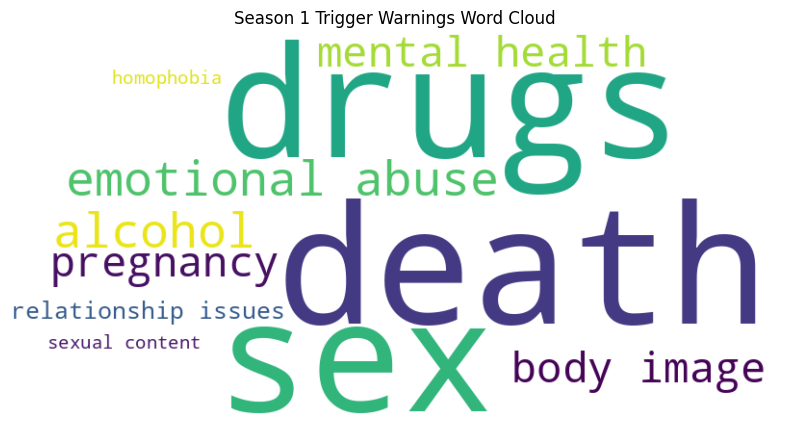

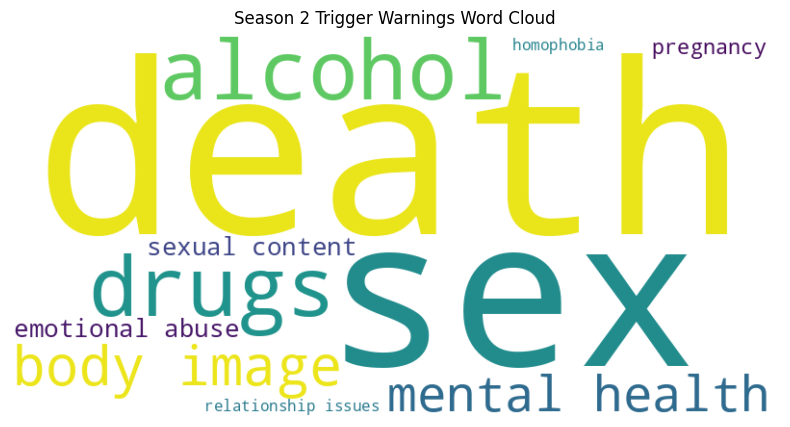

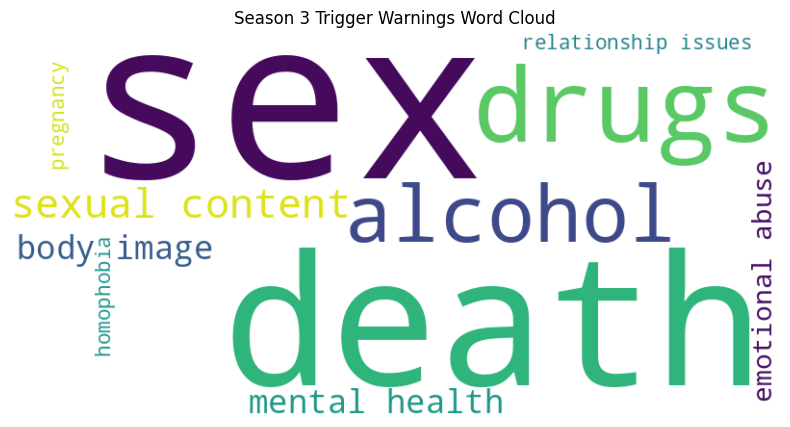

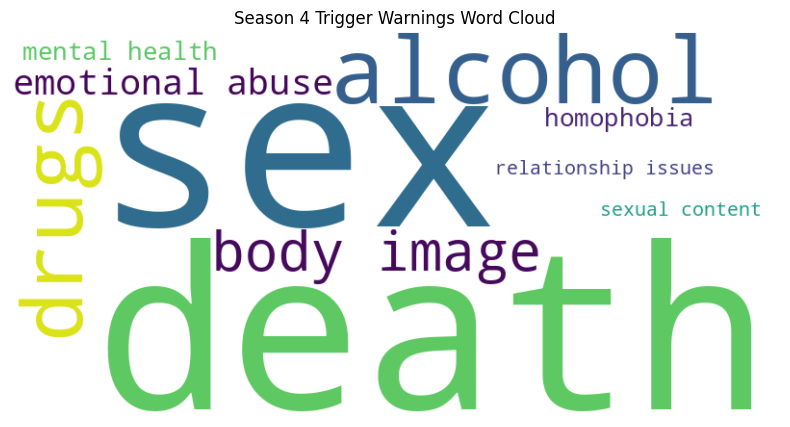

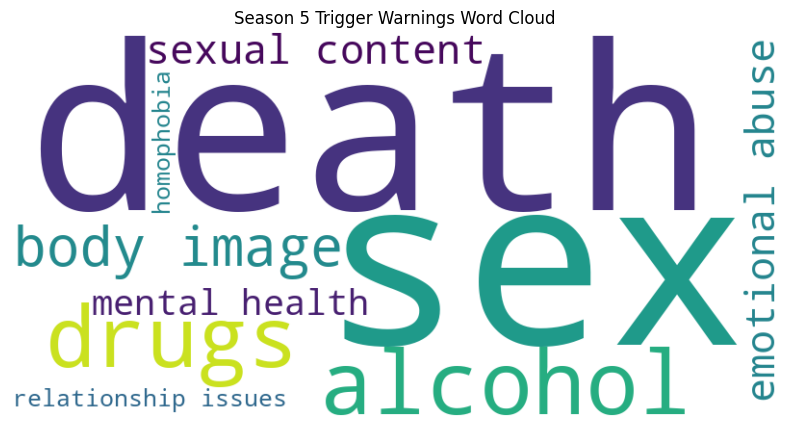

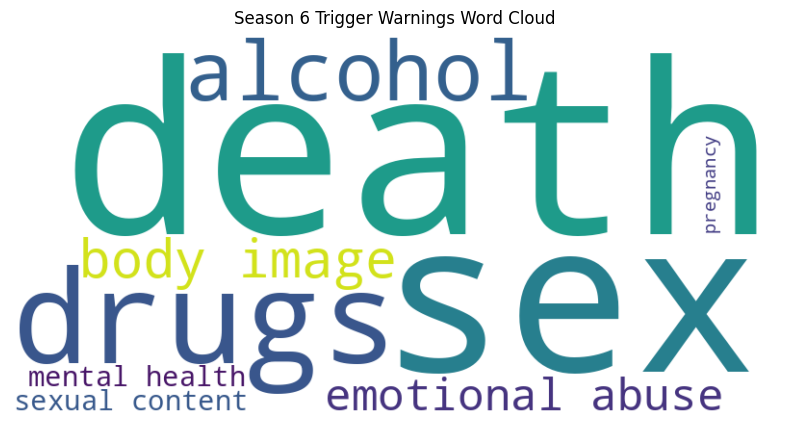

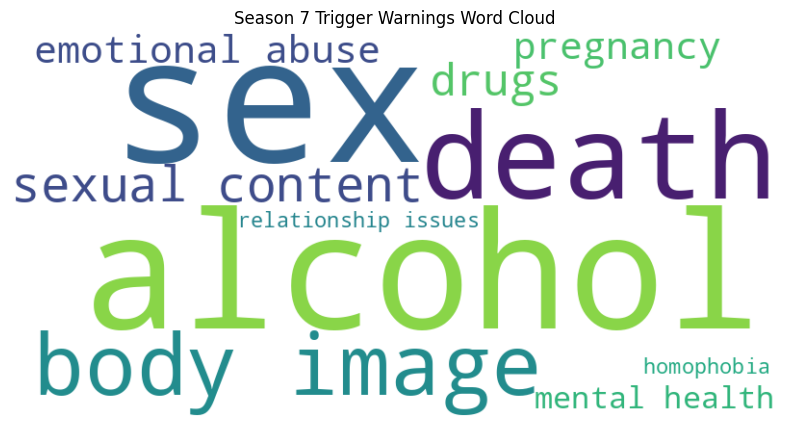

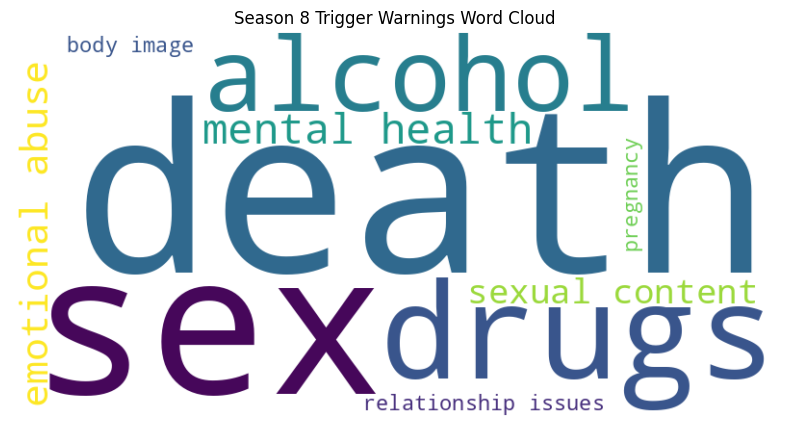

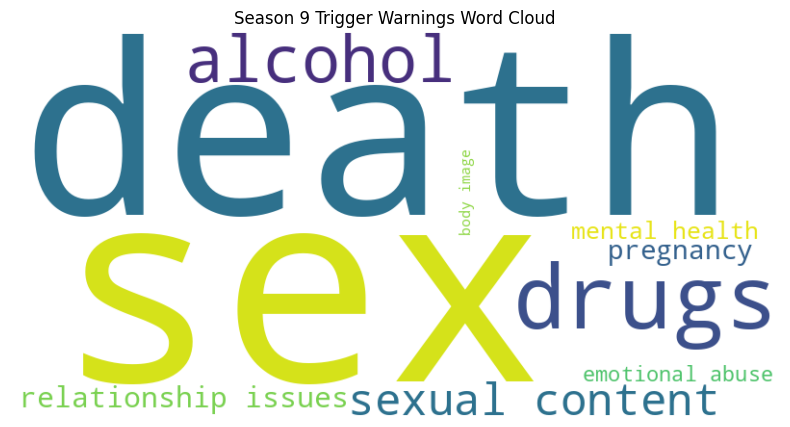

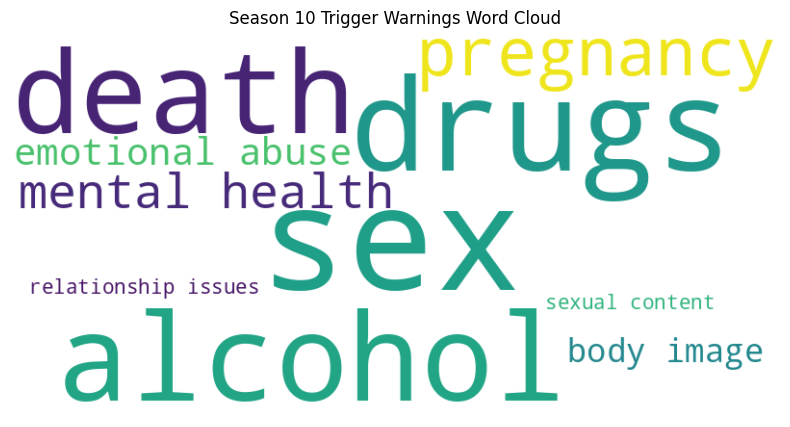

In [237]:
for season_number in range(1, 11):
    # Filter data for the current season
    season_data = combined_results_tbbt[combined_results_tbbt['Season'] == season_number]

    # Flatten the list of trigger warnings for the season
    warnings_list = [warning.strip().lower() for sublist in season_data['Top_3_Trigger_Warnings'].str.split(', ') for warning in sublist]

    # Count the occurrences of each trigger warning
    warnings_count = Counter(warnings_list)

    # Generate word cloud data
    wordcloud_data = {word: count for word, count in warnings_count.items()}

    # Create and display the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(wordcloud_data)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Season {season_number} Trigger Warnings Word Cloud')
    plt.show()

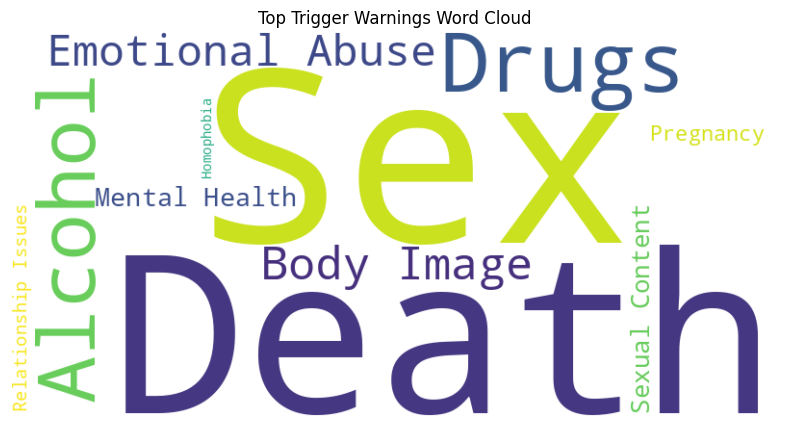

In [238]:
# Concatenate all trigger warnings from each row into a single string
all_warnings_text = ', '.join(combined_results_tbbt['Top_3_Trigger_Warnings'])

# Split the text into words and filter out empty strings
words = [word.strip() for word in all_warnings_text.split(',') if word.strip()]

# Count the frequency of each word
word_freq = Counter(words)

# Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Top Trigger Warnings Word Cloud')
plt.show()


In [239]:
word_freq

Counter({'Drugs': 86,
         'Sex': 125,
         'Relationship Issues': 17,
         'Death': 121,
         'Emotional Abuse': 37,
         'Sexual Content': 33,
         'Alcohol': 80,
         'Body Image': 41,
         'Mental Health': 35,
         'Pregnancy': 23,
         'Homophobia': 8})

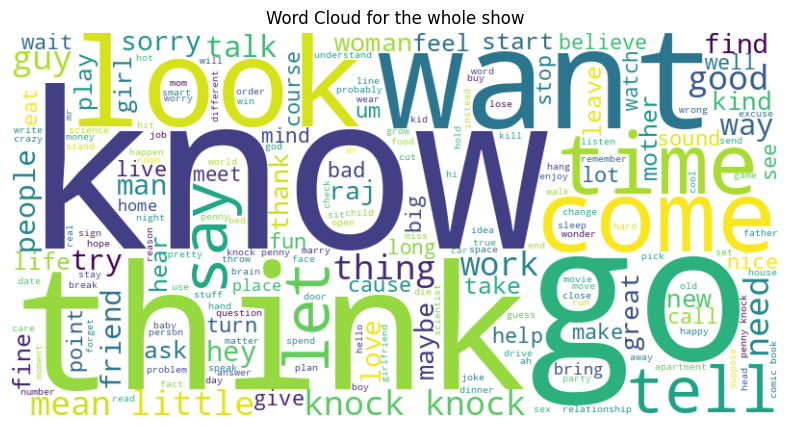

In [240]:
# Concatenate all text from each row into a single string
all_text = ' '.join(df['Cleaned_Text'])

# Generate word frequencies for S7E24
text_highlighted = ' '.join(df.loc[(df['Episode'] == 24) & (df['Season'] == 7), 'Cleaned_Text'])

# Create a word cloud, Darker word are used in S7E24
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)
wordcloud_highlighted = WordCloud(width=800, height=400, background_color ='white', color_func=lambda *args, **kwargs: "black").generate(text_highlighted)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for the whole show')
plt.show()

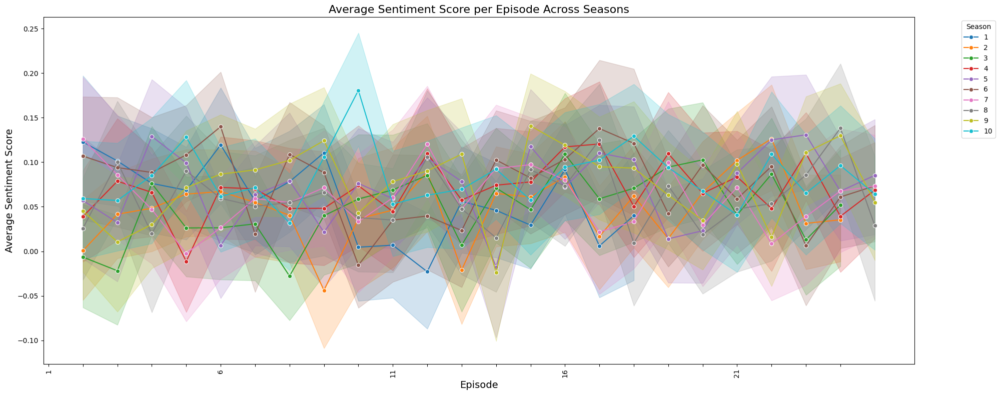

In [241]:
plt.figure(figsize=(20, 8))  # Increase figure size

# Line plot for average sentiment score per episode across seasons
sns.lineplot(data=df, x='Episode', y='Sentiment', hue='Season', marker='o', palette='tab10')

plt.title('Average Sentiment Score per Episode Across Seasons', fontsize=16)
plt.xlabel('Episode', fontsize=14)
plt.ylabel('Average Sentiment Score', fontsize=14)

# Adjust the display of episode labels on the x-axis for better readability
# Also check if Episode is sorted if not we should sort it or the visualization can be misleading
sorted_episodes = sorted(df['Episode'].unique())
visible_labels = [label if i % 5 == 0 else "" for i, label in enumerate(sorted_episodes)]
plt.xticks(ticks=range(len(sorted_episodes)), labels=visible_labels, rotation=90)  # Ensure x-ticks are set correctly

plt.legend(title='Season', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [242]:
#Character Analysis
#Filter data for main characters
main_characters = ["Sheldon", "Leonard", "Raj", "Howard", "Penny", "Bernadette"]
data_main_characters = df[df['Speaker'].isin(main_characters)]

In [243]:
data_main_characters

,Text,Speaker,Episode,Season,Show,Simple_Episode,Cleaned_Text,Is_Short_Response,tokens,Sentiment,Sentiment_Counts,Top_3_Categories,Sentiment_Category,Trigger_Warnings
1,So if a photon is directed through a plane wi...,Sheldon,1,1,TBBT,Episode-1,photon direct plane slit slit observe slit u...,False,"[so, if, a, photon, is, directed, through, a, ...",0.100000,{},"[Communication and Interactions, Generosity an...",Positive,{}
3,"There’s no point, I just think it’s a good id...",Sheldon,1,1,TBBT,Episode-1,point think good idea tee shirt,False,"[there, ’, s, no, point, ,, i, just, think, it...",0.700000,"{'anticipation': 1, 'joy': 1, 'positive': 1, '...","[Greetings and Events, Emotional Expression an...",Positive,{}
6,"One across is Aegean, eight down is Nabakov, ...",Leonard,1,1,TBBT,Episode-1,… finger … phylum make ...,False,"[one, across, is, aegean, ,, eight, down, is, ...",0.000000,{},"[Greetings and Events, Lifestyle and Expressio...",Neutral,{}
8,"Yes. Um, is this the High IQ sperm bank?",Leonard,1,1,TBBT,Episode-1,um high iq sperm bank,False,"[yes, ., um, ,, is, this, the, high, iq, sperm...",0.160000,{'trust': 1},"[Lifestyle and Expression, Greetings and Event...",Positive,{'Drugs': 1}
16,No. We are committing genetic fraud. There’s ...,Sheldon,1,1,TBBT,Episode-1,commit genetic fraud guarantee sperm go genera...,False,"[no, ., we, are, committing, genetic, fraud, ....",0.080000,"{'anger': 1, 'negative': 1, 'positive': 1, 'tr...","[Lifestyle and Expression, Greetings and Event...",Positive,{'Drugs': 1}
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54393,I think Dr. Nowitzki is a friendly colleague....,Sheldon,24,10,TBBT,Episode-24,think dr friendly colleague think need mar...,False,"[i, think, dr., nowitzki, is, a, friendly, col...",0.366071,"{'anticipation': 2, 'joy': 3, 'positive': 4, '...","[Social Interactions and Relationships, Person...",Positive,{}
54397,"Uh, breakfast yes, lunch no. I did have a cou...",Sheldon,24,10,TBBT,Episode-24,breakfast lunch cough drop ride line suck ea...,False,"[uh, ,, breakfast, yes, ,, lunch, no, ., i, di...",0.000000,"{'positive': 1, 'disgust': 1, 'negative': 1}","[Personal Life and Relationships, Hobbies and ...",Neutral,{}
54401,"And I with you. Question, are you seeking a r...",Sheldon,24,10,TBBT,Episode-24,question seek romantic relationship,False,"[and, i, with, you, ., question, ,, are, you, ...",0.000000,"{'positive': 2, 'anticipation': 1, 'joy': 1, '...","[Social Interactions and Relationships, Person...",Neutral,{}
54403,"Well, that would raise a number of problems. ...",Sheldon,24,10,TBBT,Episode-24,raise number problem colleague currently relat...,False,"[well, ,, that, would, raise, a, number, of, p...",-0.025000,{'negative': 1},"[Social Interactions and Relationships, Social...",Negative,{}


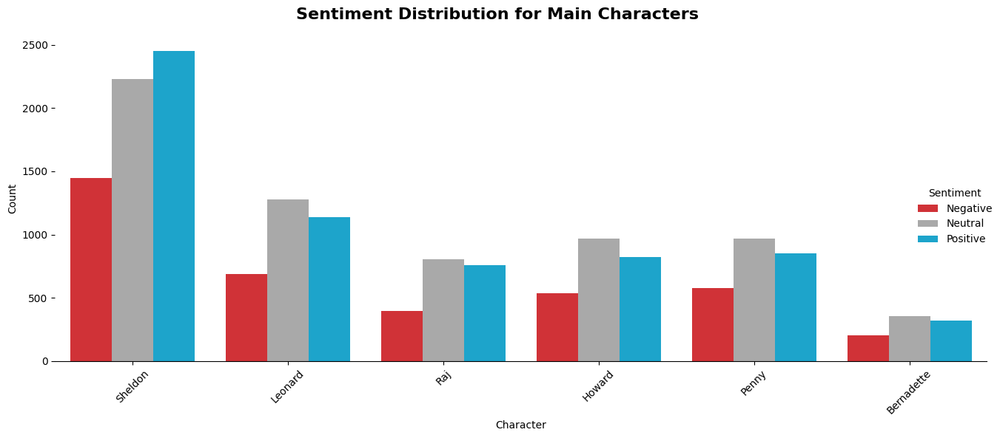

In [244]:
# Define a new palette that includes a color for 'Neutral'
sentiment_palette = {"Positive": "#00B4E8", "Negative": "#EA181E", "Neutral": "#A9A9A9"}

# Create a faceted bar plot showing sentiment distribution for each character
g = sns.catplot(
    data=data_main_characters,
    x='Speaker',
    hue='Sentiment_Category',
    palette=sentiment_palette,
    kind='count',
    height=6,
    aspect=2,
    order=main_characters,
    hue_order=['Negative', 'Neutral', 'Positive']  # Ensuring consistent order
)

# Improve the aesthetics and layout
g.set_axis_labels("Character", "Count")
g.set_titles("{col_name}")
g.fig.suptitle("Sentiment Distribution for Main Characters", fontsize=16, fontweight='bold')
g._legend.set_title('Sentiment')
g._legend.set_bbox_to_anchor((1, 0.5))  # Adjust legend position
g.despine(left=True)  # Remove left spine for cleaner look

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()